# 4 — Fermi-Hubbard con protocolo térmico tipo Lloyd-Abanin

En el Paper, el protocolo de thermalización se aplica a modelos de espines. En este notebook lo extendemos al modelo de **Fermi-Hubbard**, que es fermiónico y por tanto requiere primero mapear el Hamiltoniano a qubits.

La estrategia general es:

1. escribir el Hamiltoniano de Fermi-Hubbard en segunda cuantización;
2. transformarlo a qubits mediante Jordan-Wigner;
3. aplicar un protocolo de colisiones con qubits de baño auxiliares;
4. resetear o trazar el baño después de cada ciclo;
5. comparar el estado final con el Gibbs exacto de $H_{\mathrm{FH}}$.

El flujo principal usa el ensemble grand-canonical con $\mu=0$. Esto permite trabajar en todo el espacio de Hilbert y comparar de forma directa con los acoplos locales tipo Paper.

La variante a **half-filling**, donde se restringe el sistema al sector $N=L$ y se usan operadores que conservan el número de partículas, se deja para el Apéndice A.8. Esa parte no sustituye al protocolo principal: es una adaptación más física para estudiar el régimen Mott.

El objetivo de NB04 es responder tres preguntas:

1. si el protocolo puede preparar estados térmicos de Fermi-Hubbard;
2. en qué régimen reproduce bien los observables físicos;
3. qué cambia al pasar de simulación exacta NumPy a circuitos Qiskit y simulación shot-based.

In [1]:
# Add the project source tree to Python's import path
from pathlib import Path
import sys

PROJECT_ROOT = Path.cwd().resolve()
if PROJECT_ROOT.name == "notebooks":
    PROJECT_ROOT = PROJECT_ROOT.parent

SRC = PROJECT_ROOT / "src"
if str(SRC) not in sys.path:
    sys.path.insert(0, str(SRC))

print("Project root:", PROJECT_ROOT)
print("Source:", SRC)

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from IPython.display import display, Markdown

from tfm_shared.core import *
from tfm_shared.plots import *
from tfm_shared.qiskit_impl import *
from tfm_fh.model import *
import tfm_fh.model as fhm

plt.rcParams["figure.figsize"] = (7, 4)
plt.rcParams["axes.grid"] = True
plt.rcParams["grid.alpha"] = 0.25
plt.rcParams["figure.dpi"] = 120

try:
    from qiskit import QuantumCircuit, QuantumRegister, transpile
    from qiskit.quantum_info import SparsePauliOp, Operator, DensityMatrix, partial_trace
    from qiskit.circuit.library import PauliEvolutionGate
    from qiskit.synthesis import SuzukiTrotter, LieTrotter
    QISKIT_AVAILABLE = True
    print("✓ Qiskit disponible")
except ImportError:
    QISKIT_AVAILABLE = False
    print("⚠ Qiskit no encontrado — simulación matricial pura.")

np.set_printoptions(precision=6, linewidth=120)
plt.rcParams.update({'figure.figsize':(10,6),'font.size':11,'axes.titlesize':13,'lines.linewidth':1.8})

Project root: C:\Users\paula\Desktop\tfm
Funciones Qiskit cargadas.
✓ Qiskit disponible


# Convenciones del notebook

Trabajamos con el Hamiltoniano de Fermi-Hubbard

$$
H_{\mathrm{FH}}
=
-t \sum_{\langle i,j\rangle,\sigma}
\left(
c^\dagger_{i\sigma}c_{j\sigma}
+
c^\dagger_{j\sigma}c_{i\sigma}
\right)
+
U \sum_i n_{i\uparrow} n_{i\downarrow}
-
\mu \sum_{i,\sigma} n_{i\sigma}.
$$

Durante el notebook fijamos $t=1$. Por tanto, todas las energías se expresan en unidades de $t$, y los parámetros relevantes son

$$
U/t,\qquad T/t,\qquad \beta t,\qquad h/t.
$$

Usamos $k_B=1$, de modo que

$$
\beta = \frac{1}{T}.
$$

## Orden de qubits

Usamos Jordan-Wigner con orden intercalado por sitio:

$$
(\uparrow_0,\downarrow_0,\uparrow_1,\downarrow_1,\ldots).
$$

Es decir,

$$
q=2i \leftrightarrow (i,\uparrow),
\qquad
q=2i+1 \leftrightarrow (i,\downarrow).
$$

Para un dímero Hubbard con $L=2$ sitios:

$$
q_0=\uparrow_0,\qquad
q_1=\downarrow_0,\qquad
q_2=\uparrow_1,\qquad
q_3=\downarrow_1.
$$

La ocupación de cada orbital se codifica como

$$
|0\rangle_q = \text{vacío},
\qquad
|1\rangle_q = \text{ocupado}.
$$

Por tanto, el operador número es

$$
n_q = \frac{I-Z_q}{2}.
$$

## Ensemble principal

El flujo principal usa el Gibbs grand-canonical con $\mu=0$:

$$
\rho_\beta
=
\frac{
e^{-\beta H_{\mathrm{FH}}}
}{
\mathrm{Tr}
\left(
e^{-\beta H_{\mathrm{FH}}}
\right)
}.
$$

Esta elección deja que el estado térmico ocupe distintos sectores de número de partículas. Es la opción más directa para estudiar los acoplos locales tipo Paper, que no conservan necesariamente $N$.

La variante canónica a half-filling,

$$
N=L,
$$

se estudia aparte en el Apéndice A.8.

## Observables principales

Usamos estos observables para comparar el estado producido por el protocolo con el Gibbs exacto:

| Símbolo | Nombre | Qué mide |
|---|---|---|
| $E$ | Energía total | Valor medio de $H_{\mathrm{FH}}$ |
| $K$ | Energía cinética | Contribución del hopping |
| $U_D$ | Energía de interacción | Contribución de $U\sum_i n_{i\uparrow}n_{i\downarrow}$ |
| $N$ | Número total de partículas | Ocupación total del sistema |
| $S^z$ | Espín total en dirección $z$ | Balance global entre spin up y spin down |
| $D$ | Doble ocupación media | Probabilidad media de doble ocupación por sitio |
| $S^z_{ij}$ | Correlación espín-espín | Correlación longitudinal entre dos sitios |
| $C^{nn}_{ij}$ | Correlación densidad-densidad | Correlación entre ocupaciones locales |
| $I(i:j)$ | Información mutua | Correlación total entre dos sitios |

Estos observables permiten separar tres aspectos: energía térmica, ocupación de sectores físicos y aparición de correlaciones Hubbard.

# A. Capa exacta 

En esta parte se trabaja con matrices densidad exactas. Aquí están los resultados físicos: Gibbs exacto, punto fijo del canal, operadores de acoplo, barridos de parámetros y observables.

la versión más completa del modelo en Jordan–Wigner, el canal térmico matricial, observables detallados, exploración de parámetros e información mutua.


Validamos el protocolo en dímero/cadena pequeña.

## A.1. Validación del dímero


El dímero es el caso de referencia del notebook: 2 sitios físicos, 4 qubits y dimensión $2^4=16$. Es suficientemente pequeño para comparar exactamente contra Gibbs y suficientemente rico para contener hopping, interacción $U$, doble ocupación y correlaciones de spin/carga.


Antes de aplicar el protocolo comprobamos que el Hamiltoniano conserva número total de partículas y $S_z$, y calculamos los observables térmicos exactos de Gibbs. Esta tabla será la referencia para comparar el estado preparado por el canal.


### A.1.1 Hamiltoniano FH y simetrías

In [4]:
dimer = FermiHubbardJW(n_sites=2, bonds=[(0, 1)], t=1.0, U=4.0)

print("═" * 72)
print("COMPROBACIONES BÁSICAS — DÍMERO FERMI–HUBBARD")
print("═" * 72)
print(f"Sistema: {dimer.n_sites} sitios, {dimer.n_qubits} qubits, dim={dimer.dim}")
print(f"Parámetros: t={dimer.t}, U={dimer.U}, μ={dimer.mu}, h_mag={dimer.h_mag}")

print("\nAnticonmutación Jordan–Wigner:")
jw_check = dimer.check_jw_anticommutation()
print(f"  ok = {jw_check['ok']}")
print(f"  error máximo = {jw_check['max_error']:.2e}")

print("\nSimetrías del Hamiltoniano:")
sym = dimer.validate_symmetries()
display(pd.DataFrame([sym]))

evals, _ = dimer.eigensystem()
print("\nPrimeros 8 autovalores:")
print(np.round(evals[:8], 6))


# ------------------------------------------------------------
# Tabla térmica completa
# ------------------------------------------------------------

rows = []

for beta in [0.5, 1.0, 2.0, 5.0]:
    rho_g = dimer.gibbs_state(beta)

    row = {
        "β": beta,

        # Energía
        "E": dimer.energy(rho_g),
        "K": dimer.kinetic_energy(rho_g),
        "U_D": dimer.interaction_energy(rho_g),

        # Simetrías / sectores
        "<N>": dimer.total_number(rho_g),
        "<Sz>": dimer.total_sz(rho_g),

        # Observables físicos
        "D_dbl": dimer.avg_double_occupancy(rho_g),
        "Czz_01": dimer.spin_correlation(rho_g, 0, 1, connected=False),
        "Czz_01_conn": dimer.spin_correlation(rho_g, 0, 1, connected=True),
        "Cnn_01_conn": dimer.density_correlation(rho_g, 0, 1, connected=True),

        # Información / entropía
        "MI_01": dimer.site_mutual_information(rho_g, 0, 1),
        "S": von_neumann_entropy(rho_g),
    }

    rows.append(row)

df_dimer_gibbs = pd.DataFrame(rows)

display(df_dimer_gibbs.round(6))

════════════════════════════════════════════════════════════════════════
COMPROBACIONES BÁSICAS — DÍMERO FERMI–HUBBARD
════════════════════════════════════════════════════════════════════════
Sistema: 2 sitios, 4 qubits, dim=16
Parámetros: t=1.0, U=4.0, μ=0.0, h_mag=0.0

Anticonmutación Jordan–Wigner:
  ok = True
  error máximo = 0.00e+00

Simetrías del Hamiltoniano:


,H_hermitian,comm_H_N,comm_H_Sz
0,0.0,0.0,0.0



Primeros 8 autovalores:
[-1.       -1.       -0.828427  0.        0.        0.        0.        1.      ]


,β,E,K,U_D,<N>,<Sz>,D_dbl,Czz_01,Czz_01_conn,Cnn_01_conn,MI_01,S
0,0.5,-0.005387,-0.402672,0.397285,1.460942,-0.0,0.049661,-0.007003,-0.007003,-0.018860,0.099136,2.383975
1,1.0,-0.485409,-0.635923,0.150514,1.360517,-0.0,0.018814,-0.018957,-0.018957,-0.051458,0.293633,2.048426
2,2.0,-0.775146,-0.902442,0.127296,1.298526,-0.0,0.015912,-0.035756,-0.035756,-0.113475,0.678845,1.640062
3,5.0,-0.959246,-1.060593,0.101347,1.178508,-0.0,0.012668,-0.036231,-0.036231,-0.191300,1.165979,1.100309


### A.1.2 Validación de la descomposición de Pauli

In [5]:
def validate_fh_pauli_decomposition(model, atol=1e-10):
    H2 = np.zeros((model.dim, model.dim), dtype=complex)
    for coeff, ops in model.hamiltonian_pauli_terms(include_identity=True):
        H2 += coeff * pauli_string(ops, model.n_qubits)

    err = float(np.max(np.abs(model.H - H2)))
    return {"ok": bool(err < atol), "max_error": err}

for ns, bonds in [(2, [(0, 1)]), (3, [(0, 1), (1, 2)])]:
    m = FermiHubbardJW(ns, bonds=bonds, t=1.0, U=4.0)
    print(ns, validate_fh_pauli_decomposition(m))

2 {'ok': True, 'max_error': 0.0}
3 {'ok': True, 'max_error': 0.0}


### A.1.3 Curva exacta <$N$> VS $\mu$

,mu,N,E,D_avg
0,2.0,2.0,-4.428402,0.059378


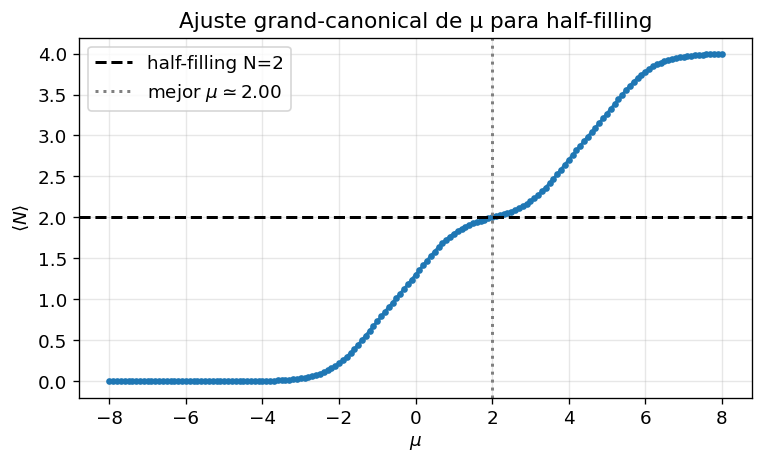

In [ ]:
# A1b — Grand-canonical con μ ajustado a half-filling

df_mu_scan, best_mu = find_mu_for_target_N(
    n_sites=2,
    t=1.0,
    U=4.0,
    beta=beta_sector,
    target_N=N_half,
)

display(pd.DataFrame([best_mu]).round(6))

fig, ax = plt.subplots(figsize=(6.5, 4))
ax.plot(df_mu_scan["mu"], df_mu_scan["N"], "o-", ms=3)
ax.axhline(N_half, ls="--", color="black", label=f"half-filling N={N_half}")
ax.axvline(best_mu["mu"], ls=":", color="gray", label=fr"mejor $\mu\simeq{best_mu['mu']:.2f}$")
ax.set_xlabel(r"$\mu$")
ax.set_ylabel(r"$\langle N\rangle$")
ax.set_title("Ajuste grand-canonical de μ para half-filling")
ax.legend()
ax.grid(alpha=0.3)
plt.tight_layout()
plt.show()

### A.1.4. Simetrías qque rompen los acoplos del canal

El Hamiltoniano Fermi–Hubbard conserva $N$ y $S_z$, pero el canal completo también depende de los operadores de acoplo $A_\mu$. Si $[A_\mu,N]\neq0$, el baño puede mover población entre sectores de partículas. Si $[A_\mu,S_z]\neq0$, también puede mezclar sectores de magnetización.

Esto decide si la referencia térmica correcta es grand-canonical o canónica.

In [ ]:
# A1c — Simetrías que conservan o rompen las familias de acoplo

df_channel_sym = coupling_symmetry_table(dimer_sector)
display(df_channel_sym.round(6))

,familia,n_ops,"max ||[A,N]||","max ||[A,Sz]||",conserva N,conserva Sz
0,paper (Z+Y)/√2,4,2.828427,1.414214,False,False
1,hubbard físico,6,0.000000,0.000000,True,True
2,hubbard dressed,6,2.000000,1.000000,False,False
3,solo X,4,4.000000,2.000000,False,False
4,solo Y,4,4.000000,2.000000,False,False
5,solo Z,4,0.000000,0.000000,True,True


En Fermi–Hubbard, el protocolo no solo depende de $\theta$, $h$, $M_T$ y $\beta$, sino también de las simetrías que rompen o conservan los operadores de acoplo. Eso determina si el target correcto es Gibbs global, Gibbs con $\mu$ ajustado, o Gibbs canónico a half-filling.

Si tu protocolo conserva $N$ pero comparas contra un Gibbs grand-canonical que mezcla sectores de $N$, el error que ves no mide “fallo térmico”, sino “target equivocado”. En cambio, si usas operadores tipo Paper $(Z+Y)/\sqrt2$, que rompen $N$, entonces sí tiene sentido comparar contra Gibbs global.

## A.2 Convergencia a Gibbs

En esta sección aplicamos el protocolo térmico exacto al dímero Hubbard.

El Hamiltoniano físico que queremos thermalizar es siempre el mismo:

$$
H_S = H_{\mathrm{FH}}.
$$

El protocolo construye un canal abierto acoplando el sistema a qubits auxiliares de baño. Un ciclo del canal actúa como

$$
\mathcal{E}(\rho)
=
\mathrm{Tr}_B
\left[
Q
\left(
\rho \otimes |0\rangle\langle 0|
\right)
Q^\dagger
\right].
$$

Aquí $\rho$ es el estado del sistema y $\mathrm{Tr}_B$ indica que al final del ciclo se elimina la información del baño. En circuitos, esto corresponde a medir o resetear los qubits auxiliares.

El unitario de un paso temporal tiene la forma

$$
U_\tau
=
e^{-i\delta\theta f_\tau V}
e^{-i\delta H_B}
e^{-i\delta H_S}.
$$

Por tanto, cada ciclo combina:

1. evolución libre del sistema;
2. evolución libre del baño;
3. acoplo sistema-baño modulado por el filtro $f_\tau$;
4. reset o traza del baño.

En esta sección comparamos dos implementaciones exactas del mismo esquema: `FullBath`, con un qubit de baño por operador de acoplo, y `Sequential`, con un único qubit de baño reutilizado.

In [9]:
dimer_cmp = FermiHubbardJW(
    n_sites=2,
    bonds=[(0, 1)],
    t=1.0,
    U=4.0,
)

beta_cmp = 2.0
rho_g_cmp = dimer_cmp.gibbs_state(beta_cmp)

A_cmp, labels_cmp = build_coupling_ops_paper(dimer_cmp)

params_cmp = dict(
    h_bath=1.0,
    beta=beta_cmp,
    theta=0.35,
    delta=0.30,
    M_T=12,
)

protocols_cmp = {
    "Paper full bath NB=4": ThermalProtocolFullBath(
        dimer_cmp,
        A_cmp,
        **params_cmp,
        random_evolution=True,
    ),
    "Sequential ordered NB=1": ThermalProtocolSequential(
        dimer_cmp,
        A_cmp,
        **params_cmp,
        random_order=False,
        random_evolution=True,
    ),
    "Sequential random order NB=1": ThermalProtocolSequential(
        dimer_cmp,
        A_cmp,
        **params_cmp,
        random_order=True,
        random_evolution=True,
    ),
}

res_cmp = {}

for name, prot in protocols_cmp.items():
    print(f"\n{name}")
    print(prot.metadata)

    out = prot.run(
        n_cycles=500,
        rho_init=np.eye(dimer_cmp.dim) / dimer_cmp.dim,
        verbose=False,
        record_every=25,
        seed=42,
    )

    res_cmp[name] = out


Paper full bath NB=4
{'protocol': 'paper_full_bath', 'n_system_qubits': 4, 'n_bath_qubits': 4, 'n_ops': 4, 'dim_system': 16, 'dim_bath': 16, 'dim_total': 256, 'build_time_sec': 0.9495220184326172}

Sequential ordered NB=1
{'protocol': 'sequential_reused_bath', 'n_system_qubits': 4, 'n_bath_qubits': 1, 'n_ops': 4, 'dim_system': 16, 'dim_bath': 2, 'dim_total': 32, 'build_time_sec': 0.03127431869506836}

Sequential random order NB=1
{'protocol': 'sequential_reused_bath', 'n_system_qubits': 4, 'n_bath_qubits': 1, 'n_ops': 4, 'dim_system': 16, 'dim_bath': 2, 'dim_total': 32, 'build_time_sec': 0.01990675926208496}


In [11]:
rows_cmp = []

for name, out in res_cmp.items():
    rho_f = out["rho_final"]
    meta = out["metadata"]

    row = dimer_cmp.summary_row(rho_f, label=name)

    row.update({
        "D_trace": trace_distance(rho_f, rho_g_cmp),
        "n_bath": meta["n_bath_qubits"],
        "n_ops": meta["n_ops"],
        "dim_total": meta["dim_total"],
        "build_time_s": meta["build_time_sec"],
    })

    rows_cmp.append(row)

row_g = dimer_cmp.summary_row(rho_g_cmp, label="Gibbs")
row_g.update({
    "D_trace": 0.0,
    "n_bath": np.nan,
    "n_ops": np.nan,
    "dim_total": np.nan,
    "build_time_s": np.nan,
})

df_protocol_cmp = pd.DataFrame([row_g] + rows_cmp)

display(
    df_protocol_cmp[
        [
            "label",
            "D_trace",
            "E",
            "K",
            "U_D",
            "N",
            "D_avg",
            "Czz_01",
            "MI_01",
            "n_bath",
            "n_ops",
            "dim_total",
            "build_time_s",
        ]
    ].round(6)
)

,label,D_trace,E,K,U_D,N,D_avg,Czz_01,MI_01,n_bath,n_ops,dim_total,build_time_s
0,Gibbs,0.000000,-0.775146,-0.902442,0.127296,1.298526,0.015912,-0.035756,0.678845,NaN,NaN,NaN,NaN
1,Paper full bath NB=4,0.025519,-0.765017,-0.900048,0.135031,1.300722,0.016879,-0.034522,0.669725,4.0,4.0,256.0,2.565387
2,Sequential ordered NB=1,0.027210,-0.761934,-0.900236,0.138303,1.302293,0.017288,-0.035489,0.668068,1.0,4.0,32.0,0.052317
3,Sequential random order NB=1,0.024390,-0.761865,-0.899525,0.137660,1.303623,0.017208,-0.035154,0.667706,1.0,4.0,32.0,0.057832


### Observables físicos Hubbard

Además de la distancia traza, medimos observables propios del modelo Hubbard:

- $E$: energía total.
- $K$: energía cinética, asociada al hopping.
- $U_D$: energía de interacción, asociada a la doble ocupación.
- $N$: número total de partículas.
- $D$: doble ocupación media.
- $C^{zz}$ y $C^{nn}$: correlaciones de espín y densidad.
- $I(i:j)$: información mutua entre sitios.

Así distinguimos si el protocolo acierta solo la energía o si también reproduce la estructura física del estado térmico.

,label,D_trace,E,K,U_D,N,Sz,D_avg,Czz_01,Czz_01_conn,Cnn_01_conn,MI_01,S
0,Gibbs,NaN,-0.775146,-0.902442,0.127296,1.298526,-0.000000,0.015912,-0.035756,-0.035756,-0.113475,0.678845,1.640062
1,Paper full bath NB=4,0.025519,-0.765017,-0.900048,0.135031,1.300722,-0.000000,0.016879,-0.034522,-0.034522,-0.110971,0.669725,1.654673
2,Sequential ordered NB=1,0.027210,-0.761934,-0.900236,0.138303,1.302293,-0.001157,0.017288,-0.035489,-0.035484,-0.112075,0.668068,1.658043
3,Sequential random order NB=1,0.024390,-0.761865,-0.899525,0.137660,1.303623,0.000384,0.017208,-0.035154,-0.035142,-0.112191,0.667706,1.658897


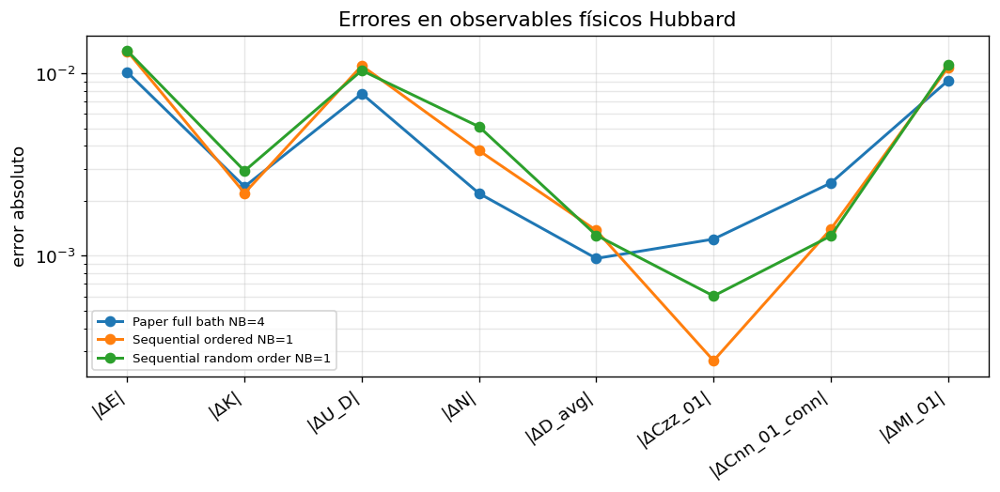

In [12]:
# Observables físicos: Gibbs vs protocolos del dímero

rows_obs = []

rho_g = rho_g_cmp
rows_obs.append(dimer_cmp.summary_row(rho_g, label="Gibbs"))

for name, out in res_cmp.items():
    rho_f = out["rho_final"]
    row = dimer_cmp.summary_row(rho_f, label=name)
    row["D_trace"] = trace_distance(rho_f, rho_g)
    rows_obs.append(row)

df_hubbard_obs = pd.DataFrame(rows_obs)

cols_obs = [
    "label",
    "D_trace",
    "E",
    "K",
    "U_D",
    "N",
    "Sz",
    "D_avg",
    "Czz_01",
    "Czz_01_conn",
    "Cnn_01_conn",
    "MI_01",
    "S",
]

display(df_hubbard_obs[cols_obs].round(6))

# Plot compacto: errores absolutos frente a Gibbs
g = df_hubbard_obs.iloc[0]
df_err_obs = df_hubbard_obs.iloc[1:].copy()

for col in ["E", "K", "U_D", "N", "D_avg", "Czz_01", "Cnn_01_conn", "MI_01"]:
    df_err_obs[f"|Δ{col}|"] = np.abs(df_err_obs[col] - g[col])

err_cols = ["|ΔE|", "|ΔK|", "|ΔU_D|", "|ΔN|", "|ΔD_avg|", "|ΔCzz_01|", "|ΔCnn_01_conn|", "|ΔMI_01|"]

fig, ax = plt.subplots(figsize=(9, 4.5))
x = np.arange(len(err_cols))

for _, row in df_err_obs.iterrows():
    ax.plot(x, row[err_cols], "o-", label=row["label"])

ax.set_xticks(x)
ax.set_xticklabels(err_cols, rotation=35, ha="right")
ax.set_yscale("log")
ax.set_ylabel("error absoluto")
ax.set_title("Errores en observables físicos Hubbard")
ax.grid(alpha=0.3, which="both")
ax.legend(fontsize=8)
plt.tight_layout()
plt.show()

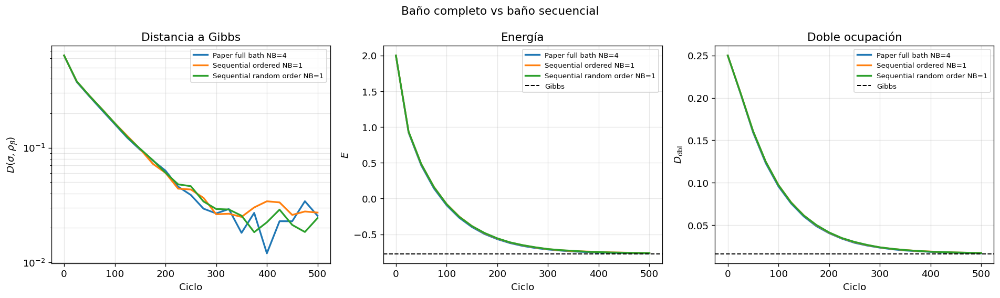

In [5]:
fig, axes = plt.subplots(1, 3, figsize=(16, 4.8))

for name, out in res_cmp.items():
    axes[0].semilogy(
        out["cycles"],
        out["trace_dist"],
        "-",
        lw=2,
        label=name,
    )

    axes[1].plot(
        out["cycles"],
        out["energies"],
        "-",
        lw=2,
        label=name,
    )

    axes[2].plot(
        out["cycles"],
        out["double_occ"],
        "-",
        lw=2,
        label=name,
    )

axes[1].axhline(
    dimer_cmp.energy(rho_g_cmp),
    color="k",
    ls="--",
    lw=1.2,
    label="Gibbs",
)

axes[2].axhline(
    dimer_cmp.avg_double_occupancy(rho_g_cmp),
    color="k",
    ls="--",
    lw=1.2,
    label="Gibbs",
)

axes[0].set(
    xlabel="Ciclo",
    ylabel="$D(\\sigma,\\rho_\\beta)$",
    title="Distancia a Gibbs",
)

axes[1].set(
    xlabel="Ciclo",
    ylabel="$E$",
    title="Energía",
)

axes[2].set(
    xlabel="Ciclo",
    ylabel="$D_{\\rm dbl}$",
    title="Doble ocupación",
)

for ax in axes:
    ax.grid(alpha=0.3, which="both")
    ax.legend(fontsize=8)

plt.suptitle("Baño completo vs baño secuencial", fontsize=13)
plt.tight_layout()
plt.show()

### Elección del protocolo de trabajo

La comparación muestra que, para el dímero con acoplos tipo Paper, la implementación con baño completo y la implementación secuencial producen resultados muy parecidos en distancia traza, energía, doble ocupación y correlaciones.

La diferencia principal está en el coste. `ThermalProtocolFullBath` usa un auxiliar por operador de acoplo. En el dímero esto implica $N_B=4$ y una dimensión total $d_S d_B=16\times16=256$. En cambio, `ThermalProtocolSequential` reutiliza un único auxiliar, por lo que usa $N_B=1$ y dimensión total $16\times2=32$.

Por tanto, usamos `ThermalProtocolFullBath` como referencia del protocolo simultáneo y `ThermalProtocolSequential` como protocolo de trabajo en el resto del notebook. Esta elección conserva los ingredientes principales del protocolo —baño reseteable, acoplo modulado, filtro gaussiano y randomización— pero permite hacer barridos extensos con un coste mucho menor.

## A.3 Operadores de acoplo 

En esta sección el Hamiltoniano del sistema sigue siendo siempre el mismo:

$$
H_S = H_{\rm FH}.
$$

Es decir, el modelo sigue siendo Fermi-Hubbard. Lo que cambiamos no es el modelo, sino la familia de operadores $A_\mu$ que acopla el sistema al baño:

$$
V(\tau)=f(\tau)\sum_\mu A_\mu\otimes Y_{B,\mu}.
$$

Aquí $A_\mu$ actúa sobre el sistema y $Y_{B,\mu}$ actúa sobre el auxiliar del baño. Por tanto, `Pauli`, `Paper`, `Hubbard` o `Dressed` son distintas elecciones de acoplo para intentar preparar el Gibbs del mismo $H_{\rm FH}$.

En el dímero usamos el orden Jordan-Wigner

$$
(\uparrow_0,\downarrow_0,\uparrow_1,\downarrow_1),
$$

así que hay 4 qubits de sistema.

Probamos primero acoplos **Pauli locales**:

$$
A_q=X_q,\qquad A_q=Y_q,\qquad A_q=Z_q.
$$

También probamos **mezclas Pauli locales**:

$$
A_q^{ZY}=\frac{Z_q+Y_q}{\sqrt2},\qquad
A_q^{ZX}=\frac{Z_q+X_q}{\sqrt2},\qquad
A_q^{XY}=\frac{X_q+Y_q}{\sqrt2}.
$$

Estudiar `solo X`, `solo Y` y las mezclas Pauli sirve para diagnosticar qué parte del acoplo produce mezcla efectiva. 
La familia `Paper` corresponde a $(Z_q+Y_q)/\sqrt2$ por qubit.

---

### Operadores Hubbard-locales

Los operadores `Hubbard` no son “el modelo”. El modelo ya está fijado por $H_{\rm FH}$. Estos operadores son acoplos $A_\mu$ construidos a partir de observables naturales de Fermi-Hubbard.

Para cada sitio $i$, la **carga local** desplazada es

$$
A_i^n
=
n_{i\uparrow}+n_{i\downarrow}-1
=
-\frac12
\left(
Z_{i\uparrow}+Z_{i\downarrow}
\right).
$$

El **spin local** es

$$
A_i^s
=
n_{i\uparrow}-n_{i\downarrow}
=
\frac12
\left(
Z_{i\downarrow}-Z_{i\uparrow}
\right).
$$

El **hopping** entre dos sitios $i,j$ para spin $\sigma$ es

$$
A_{ij,\sigma}^{\rm hop}
=
c^\dagger_{i\sigma}c_{j\sigma}
+
c^\dagger_{j\sigma}c_{i\sigma}.
$$

El hopping mueve una partícula entre sitios. En Jordan-Wigner, si los orbitales correspondientes son $p<q$, queda

$$
A_{pq}^{\rm hop}
=
\frac12
\left(
X_p Z_{p+1}\cdots Z_{q-1}X_q
+
Y_p Z_{p+1}\cdots Z_{q-1}Y_q
\right).
$$

Es no diagonal porque contiene $X$ e $Y$, pero no ser diagonal no basta: el hopping conserva número total de partículas y spin, así que puede no conectar suficientemente todos los autoestados relevantes. Además, se parece mucho a la parte cinética del propio Hamiltoniano, así que puede mezclar solo dentro de subespacios concretos.

---


`Hubbard: ALL` no es un nuevo Hamiltoniano ni un único operador. Es usar juntos todos los acoplos Hubbard-locales disponibles.

En el dímero hay 2 sitios y 1 enlace. Por eso:

$$
2\ \text{cargas}
+
2\ \text{spins}
+
2\ \text{hoppings}
=
6\ \text{operadores}.
$$

Explícitamente,

$$
A_\mu^{\rm ALL}
=
\{
A_0^n,
A_1^n,
A_0^s,
A_1^s,
A_{01,\uparrow}^{\rm hop},
A_{01,\downarrow}^{\rm hop}
\}.
$$

El protocolo los usa como una lista de canales de acoplo al baño. Con `random_order=True`, el orden de estos operadores se baraja en cada ciclo.

---

### Hubbard dressed

`Dressed: Hubbard+Y` es Hubbard-local más una componente $Y$ añadida a carga y spin.

La carga vestida es

$$
A_i^{n,Y}
=
\frac{1}{\sqrt2}
\left[
-\frac12
\left(
Z_{i\uparrow}+Z_{i\downarrow}
\right)
+
\frac12
\left(
Y_{i\uparrow}+Y_{i\downarrow}
\right)
\right].
$$

El spin vestido es

$$
A_i^{s,Y}
=
\frac{1}{\sqrt2}
\left[
\frac12
\left(
Z_{i\downarrow}-Z_{i\uparrow}
\right)
+
\frac12
\left(
Y_{i\uparrow}-Y_{i\downarrow}
\right)
\right].
$$

Los hoppings se dejan sin vestir:

$$
A_{ij,\sigma}^{\rm hop}
=
c^\dagger_{i\sigma}c_{j\sigma}
+
c^\dagger_{j\sigma}c_{i\sigma}.
$$

Por tanto, `Dressed` es una familia intermedia: mantiene estructura Hubbard-local, pero añade mezcla no diagonal local.

La tabla siguiente comprueba primero propiedades estructurales: número de operadores, hermiticidad y diagonalidad. Después se aplica el protocolo y se compara dinámicamente contra Gibbs.

In [21]:
# ============================================================
# A.3 — Comparación dinámica de operadores de acoplo A_mu
# ============================================================

beta = 2.0

rho_g = dimer.gibbs_state(beta)
E_g = dimer.energy(rho_g)
D_g = dimer.avg_double_occupancy(rho_g)
C_g = dimer.spin_correlation(rho_g, 0, 1)

# ------------------------------------------------------------
# Familias de operadores
# ------------------------------------------------------------

# Hubbard-local completo: carga, spin y hopping
ops_hubbard_all, labs_hubbard_all = build_coupling_operators(dimer)

ops_hubbard_charge = [
    A for A, lab in zip(ops_hubbard_all, labs_hubbard_all)
    if lab.startswith("charge")
]
labs_hubbard_charge = [
    lab for lab in labs_hubbard_all
    if lab.startswith("charge")
]

ops_hubbard_spin = [
    A for A, lab in zip(ops_hubbard_all, labs_hubbard_all)
    if lab.startswith("spin")
]
labs_hubbard_spin = [
    lab for lab in labs_hubbard_all
    if lab.startswith("spin")
]

ops_hubbard_hop = [
    A for A, lab in zip(ops_hubbard_all, labs_hubbard_all)
    if lab.startswith("hop")
]
labs_hubbard_hop = [
    lab for lab in labs_hubbard_all
    if lab.startswith("hop")
]

operator_sets = {
    "Pauli: solo X": build_coupling_ops_pauli(dimer, "X"),
    "Pauli: solo Y": build_coupling_ops_pauli(dimer, "Y"),
    "Pauli: solo Z": build_coupling_ops_pauli(dimer, "Z"),

    "Paper: (Z+Y)/√2": build_coupling_ops_paper(dimer),

    "Pauli: (Z+X)/√2": build_coupling_ops_pauli(dimer, "ZX"),
    "Pauli: (X+Y)/√2": build_coupling_ops_pauli(dimer, "XY"),

    "Hubbard: charge": (ops_hubbard_charge, labs_hubbard_charge),
    "Hubbard: spin": (ops_hubbard_spin, labs_hubbard_spin),
    "Hubbard: hop": (ops_hubbard_hop, labs_hubbard_hop),
    "Hubbard: ALL": (ops_hubbard_all, labs_hubbard_all),

    "Dressed: Hubbard+Y": build_coupling_ops_dressed(dimer),
}

protocol_params_A = dict(
    h_bath=1.0,
    beta=beta,
    theta=0.35,
    delta=0.30,
    M_T=12,
    random_order=True,
    random_evolution=True,
)

# ------------------------------------------------------------
# Test dinámico
# ------------------------------------------------------------

rows = []
res_A = {}

for name, (ops, labs) in operator_sets.items():
    np.random.seed(42)

    prot = ThermalProtocolSequential(
        dimer,
        ops,
        **protocol_params_A,
    )

    out = prot.run(
        n_cycles=500,
        verbose=False,
        record_every=25,
        seed=42,
    )

    rho_f = out["rho_final"]
    res_A[name] = out

    n_herm = sum(
        np.allclose(A, A.conj().T, atol=1e-10)
        for A in ops
    )

    n_diag = sum(
        np.max(np.abs(A - np.diag(np.diag(A)))) < 1e-10
        for A in ops
    )

    rows.append({
        "familia": name,
        "n_ops": len(ops),
        "hermíticos": f"{n_herm}/{len(ops)}",
        "diag_ops": n_diag,
        "offdiag_ops": len(ops) - n_diag,

        "D_trace": trace_distance(rho_f, rho_g),

        "E": dimer.energy(rho_f),
        "|ΔE|": abs(dimer.energy(rho_f) - E_g),

        "D_dbl": dimer.avg_double_occupancy(rho_f),
        "|ΔD_dbl|": abs(dimer.avg_double_occupancy(rho_f) - D_g),

        "Czz": dimer.spin_correlation(rho_f, 0, 1),
        "|ΔCzz|": abs(dimer.spin_correlation(rho_f, 0, 1) - C_g),
    })

df_A_dynamic = pd.DataFrame(rows)

display(df_A_dynamic.round(6))

print("Referencia Gibbs:")
print(f"E       = {E_g:.6f}")
print(f"D_dbl   = {D_g:.6f}")
print(f"Czz     = {C_g:.6f}")

,familia,n_ops,hermíticos,diag_ops,offdiag_ops,D_trace,E,|ΔE|,D_dbl,|ΔD_dbl|,Czz,|ΔCzz|
0,Pauli: solo X,4,4/4,0,4,0.026406,-0.766559,0.008587,0.015816,0.000096,-0.034135,0.001621
1,Pauli: solo Y,4,4/4,0,4,0.026406,-0.766559,0.008587,0.015816,0.000096,-0.034135,0.001621
2,Pauli: solo Z,4,4/4,4,0,0.496853,1.425511,2.200657,0.254377,0.238465,0.002189,0.037944
3,Paper: (Z+Y)/√2,4,4/4,0,4,0.024390,-0.761865,0.013281,0.017208,0.001296,-0.035154,0.000602
4,Pauli: (Z+X)/√2,4,4/4,0,4,0.024390,-0.761865,0.013281,0.017208,0.001296,-0.035154,0.000602
5,Pauli: (X+Y)/√2,4,4/4,0,4,0.026406,-0.766559,0.008587,0.015816,0.000096,-0.034135,0.001621
6,Hubbard: charge,2,2/2,2,0,0.521332,1.480983,2.256129,0.252580,0.236668,0.001290,0.037046
7,Hubbard: spin,2,2/2,2,0,0.500522,1.483185,2.258330,0.252711,0.236799,0.001355,0.037111
8,Hubbard: hop,2,2/2,0,2,0.636399,1.819422,2.594568,0.227464,0.211552,-0.011268,0.024488
9,Hubbard: ALL,6,6/6,4,2,0.418869,1.055751,1.830897,0.221015,0.205103,-0.014493,0.021263


Referencia Gibbs:
E       = -0.775146
D_dbl   = 0.015912
Czz     = -0.035756


Grupos equivalentes:
  - Pauli: solo X = Pauli: solo Y = Pauli: (X+Y)/√2
  - Pauli: solo Z
  - Paper: (Z+Y)/√2 = Pauli: (Z+X)/√2
  - Hubbard: charge
  - Hubbard: spin
  - Hubbard: hop
  - Hubbard: ALL
  - Dressed: Hubbard+Y


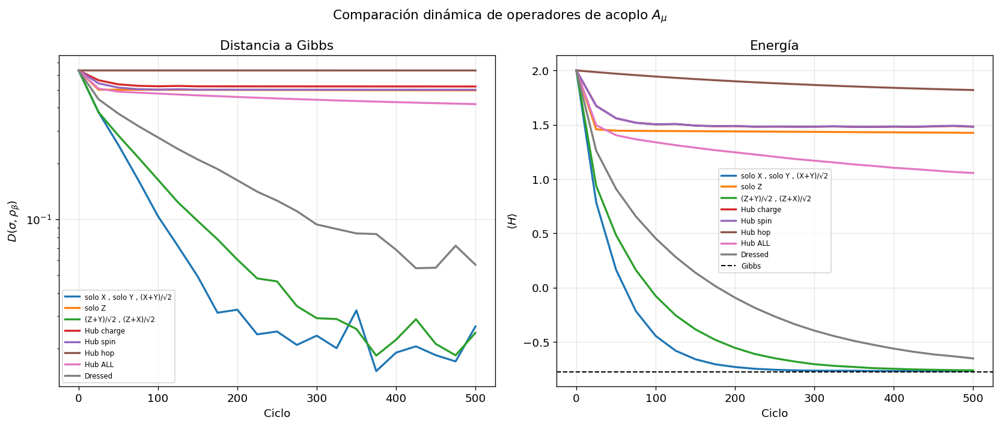

In [10]:
names = list(operator_sets.keys())

def same_dynamics(name1, name2, atol=1e-12, rtol=1e-10):
    d_ok = np.allclose(
        res_A[name1]["trace_dist"],
        res_A[name2]["trace_dist"],
        atol=atol,
        rtol=rtol,
    )
    e_ok = np.allclose(
        res_A[name1]["energies"],
        res_A[name2]["energies"],
        atol=atol,
        rtol=rtol,
    )
    return d_ok and e_ok

groups = []
used = set()

for name in names:
    if name in used:
        continue

    group = [name]
    used.add(name)

    for other in names:
        if other in used:
            continue
        if same_dynamics(name, other):
            group.append(other)
            used.add(other)

    groups.append(group)

print("Grupos equivalentes:")
for g in groups:
    print("  - " + " = ".join(g))


short_name = {
    "Pauli: solo X": "solo X",
    "Pauli: solo Y": "solo Y",
    "Pauli: solo Z": "solo Z",
    "Paper: (Z+Y)/√2": "(Z+Y)/√2",
    "Pauli: (Z+X)/√2": "(Z+X)/√2",
    "Pauli: (X+Y)/√2": "(X+Y)/√2",
    "Hubbard: charge": "Hub charge",
    "Hubbard: spin": "Hub spin",
    "Hubbard: hop": "Hub hop",
    "Hubbard: ALL": "Hub ALL",
    "Dressed: Hubbard+Y": "Dressed",
}

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

for group in groups:
    rep = group[0]
    out = res_A[rep]

    label = " , ".join(short_name[g] for g in group)

    axes[0].semilogy(
        out["cycles"],
        out["trace_dist"],
        "-",
        lw=2,
        label=label,
    )

    axes[1].plot(
        out["cycles"],
        out["energies"],
        "-",
        lw=2,
        label=label,
    )

axes[1].axhline(E_g, color="k", ls="--", lw=1.2, label="Gibbs")

axes[0].set(
    xlabel="Ciclo",
    ylabel=r"$D(\sigma,\rho_\beta)$",
    title="Distancia a Gibbs",
)

axes[1].set(
    xlabel="Ciclo",
    ylabel=r"$\langle H\rangle$",
    title="Energía",
)

for ax in axes:
    ax.grid(alpha=0.3)
    ax.legend(fontsize=7)

plt.suptitle(r"Comparación dinámica de operadores de acoplo $A_\mu$", fontsize=13)
plt.tight_layout()
plt.show()



La comparación muestra que la propiedad clave de $A_\mu$ no es solo que sea un operador “natural” del modelo, sino que genere una mezcla suficiente en el canal abierto.

Primero, los operadores diagonales no bastan. `Pauli: solo Z`, `Hubbard: charge` y `Hubbard: spin` quedan lejos de Gibbs porque son diagonales en la base computacional y no inducen transiciones entre ocupaciones.

Segundo, una componente local no diagonal es muy eficaz en el dímero. `Pauli: solo X`, `Pauli: solo Y` y `Pauli: (X+Y)/√2` generan la misma dinámica efectiva. Esto indica que, para este sistema pequeño, basta una dirección local no diagonal para inducir una buena mezcla.

Tercero, `Paper: (Z+Y)/√2` coincide dinámicamente con `Pauli: (Z+X)/√2` en este caso. La parte diagonal $Z$ no destruye la mezcla, pero tampoco parece ser el ingrediente decisivo en el dímero. Lo importante es que haya una componente local no diagonal.

Cuarto, `Hubbard: hop` es no diagonal, pero no suficiente. Aunque mueve partículas entre los dos sitios, conserva número total de partículas y spin. Por eso no garantiza una dinámica ergódica hacia Gibbs.

Quinto, `Hubbard: ALL` mejora respecto a algunas subfamilias aisladas porque combina carga, spin y hopping, pero sigue limitado por la presencia de componentes diagonales y por las simetrías que conserva el hopping.

Finalmente, `Dressed: Hubbard+Y` mejora claramente frente a `Hubbard: ALL`, porque añade componentes $Y$ a carga y spin. Aun así, queda como una opción intermedia: más conectada con observables Hubbard-locales que `solo Y`, pero menos precisa que los controles Pauli locales simples en el dímero.

En Fermi–Hubbard no basta con elegir operadores “físicos”; deben ser también suficientemente mezclantes.

## A.4 Barridos del dímero

Una vez identificado un acoplo que funciona bien, usamos el dímero para estudiar cómo cambian los resultados al variar parámetros físicos y del protocolo.

$$
A_q=\frac{Z_q+Y_q}{\sqrt2}.
$$

Esta es la familia tipo Paper. En A.3 vimos que otros acoplos Pauli locales, como `solo X`, `solo Y` o $(X+Y)/\sqrt2$, producen dinámicas muy parecidas en el dímero. Sin embargo, usamos la familia tipo Paper como referencia porque está conectada con la construcción original del protocolo y funciona bien sin ajustar el operador a cada barrido.


Nos centramos en:

- $U/t$, para ver el paso hacia régimen Mott fuerte;
- $\beta$, para estudiar temperatura;
- $h$, para la sintonía espectral del baño;
- $M_T$, para resolución del filtro y resonancias discretas.

### A.4.1 Barrido en $U/t$: régimen débil, intermedio y Mott fuerte 

En este barrido cambiamos la interacción local $U$ manteniendo $t=1$. El cociente $U/t$ mide la competencia entre energía cinética y repulsión local.

Para $U/t$ pequeño o intermedio, el hopping permite que las partículas se deslocalicen. Para $U/t$ grande, la doble ocupación queda penalizada y aparece un régimen fuertemente correlacionado tipo Mott. En el dímero no hay transición de fase real, pero sí una separación clara de escalas:

$$
U
\qquad\text{y}\qquad
J_{\rm spin}=\frac{4t^2}{U}.
$$

Usamos siempre el acoplo tipo Paper,

$$
A_q=\frac{Z_q+Y_q}{\sqrt2},
$$

y retuneamos los parámetros del filtro en cada punto. El objetivo no es encontrar el óptimo absoluto para cada $U$, sino comprobar si el protocolo sigue preparando bien el Gibbs completo al entrar en régimen fuerte.

En cada $U$ ajustamos:

- $h$, para sintonizar la escala principal del baño;
- $\delta$, para reducir el paso temporal cuando crece la escala energética;
- $\theta$, para mantener el acoplo en un régimen perturbativo razonable;
- $M_T$, para mantener una ventana temporal comparable del filtro.

Los ajustamos así:

El resto de parámetros se elige de forma común para que la comparación sea justa:

$$
\theta
=
\sqrt{
\frac{0.05}{\sqrt{\beta h}}
}.
$$

que es una heuristica nuestra. La motivación era reducir $\theta$ cuando crece $h$, por estar en régimen débil, pero la constante $0.05$ es arbitraria.

Después se limita a un intervalo razonable para mantener el régimen perturbativo.

El paso temporal se reduce cuando crece la escala energética dominante:

$$
\delta
=
\min
\left(
0.20,
\frac{0.25}{\max(t,U/2)}
\right).
$$

otra heuristica nuestra. Es una regla práctica para que el paso temporal baje cuando crece la escala energética.

El ancho del filtro viene dado por

$$
a=\sqrt{\frac{4h}{\beta}}.
$$

q si viene del paper.

La ventana temporal efectiva se toma como

$$
T_{\rm filter}=\frac{5}{a},
$$

y por tanto

$$
M_T
=
\left\lceil
\frac{T_{\rm filter}}{\delta}
\right\rceil.
$$

otra heuristica. La idea viene de que el filtro tiene escala temporal $\sim 1/a$, pero el factor 5 es una elección práctica, no una fórmula del paper.

Así, en esta comparación lo único que cambia conceptualmente entre estrategias es la escala $h$ a la que se sintoniza el baño.

In [ ]:
U_vals = [0.5, 1.0, 2.0, 4.0, 6.0, 8.0, 12.0]

beta_U = 2.0
t_U = 1.0
n_cycles_U = 700

rows_U = []
res_U = {}

for U in U_vals:
    np.random.seed(42)

    model_U = FermiHubbardJW(
        n_sites=2,
        bonds=[(0, 1)],
        t=t_U,
        U=U,
    )

    rho_g_U = model_U.gibbs_state(beta_U)
    A_U, _ = build_coupling_ops_paper(model_U)

    p = tune_protocol_full_gibbs(U, t=t_U, beta=beta_U)

    prot_U = ThermalProtocolSequential(
        model_U,
        A_U,
        h_bath=p["h_bath"],
        beta=p["beta"],
        theta=p["theta"],
        delta=p["delta"],
        M_T=p["M_T"],
        random_order=True,
        random_evolution=True,
    )

    out_U = prot_U.run(
        n_cycles=n_cycles_U,
        rho_init=np.eye(model_U.dim) / model_U.dim,
        verbose=False,
        record_every=50,
    )

    rho_f_U = out_U["rho_final"]
    res_U[U] = out_U

    rows_U.append({
        "U/t": U,
        "J_spin": p["J_spin"],

        "h": p["h_bath"],
        "theta": p["theta"],
        "delta": p["delta"],
        "M_T": p["M_T"],
        "T_filter": p["T_filter"],
        "delta_H": p["delta_H"],

        "D_trace": trace_distance(rho_f_U, rho_g_U),

        "E_Gibbs": model_U.energy(rho_g_U),
        "E_protocol": model_U.energy(rho_f_U),
        "|ΔE|": abs(model_U.energy(rho_f_U) - model_U.energy(rho_g_U)),

        "Ddbl_Gibbs": model_U.avg_double_occupancy(rho_g_U),
        "Ddbl_protocol": model_U.avg_double_occupancy(rho_f_U),
        "|ΔDdbl|": abs(
            model_U.avg_double_occupancy(rho_f_U)
            - model_U.avg_double_occupancy(rho_g_U)
        ),

        "Czz_Gibbs": model_U.spin_correlation(rho_g_U, 0, 1),
        "Czz_protocol": model_U.spin_correlation(rho_f_U, 0, 1),
        "|ΔCzz|": abs(
            model_U.spin_correlation(rho_f_U, 0, 1)
            - model_U.spin_correlation(rho_g_U, 0, 1)
        ),
    })

df_U = pd.DataFrame(rows_U)

display(
    df_U[
        [
            "U/t", "J_spin", "h", "theta", "delta", "M_T",
            "D_trace", "|ΔE|", "|ΔDdbl|", "|ΔCzz|",
            "E_Gibbs", "E_protocol",
            "Ddbl_Gibbs", "Ddbl_protocol",
        ]
    ].round(6)
)

,U/t,J_spin,h,theta,delta,M_T,D_trace,|ΔE|,|ΔDdbl|,|ΔCzz|,E_Gibbs,E_protocol,Ddbl_Gibbs,Ddbl_protocol
0,0.5,8.000000,2.0,0.158114,0.200000,13,0.009211,0.002541,0.000027,0.000402,-1.300151,-1.297610,0.178390,0.178417
1,1.0,4.000000,2.0,0.158114,0.200000,13,0.008130,0.003897,0.000894,0.000344,-1.130991,-1.127095,0.123015,0.122121
2,2.0,2.000000,2.0,0.158114,0.200000,13,0.010699,0.002743,0.000549,0.000993,-0.924058,-0.921315,0.057231,0.057781
3,4.0,1.000000,4.0,0.132957,0.125000,15,0.039599,0.037374,0.000220,0.008007,-0.775146,-0.737772,0.015912,0.015692
4,6.0,0.666667,6.0,0.120141,0.083333,18,0.183872,0.164424,0.001789,0.013499,-0.738187,-0.573763,0.006293,0.008082
5,8.0,0.500000,8.0,0.111803,0.062500,20,0.332814,0.347890,0.001388,0.012104,-0.727172,-0.379282,0.003139,0.004526
6,12.0,0.333333,12.0,0.101026,0.041667,25,0.492016,0.624564,0.000947,0.009077,-0.721694,-0.097129,0.001171,0.002119


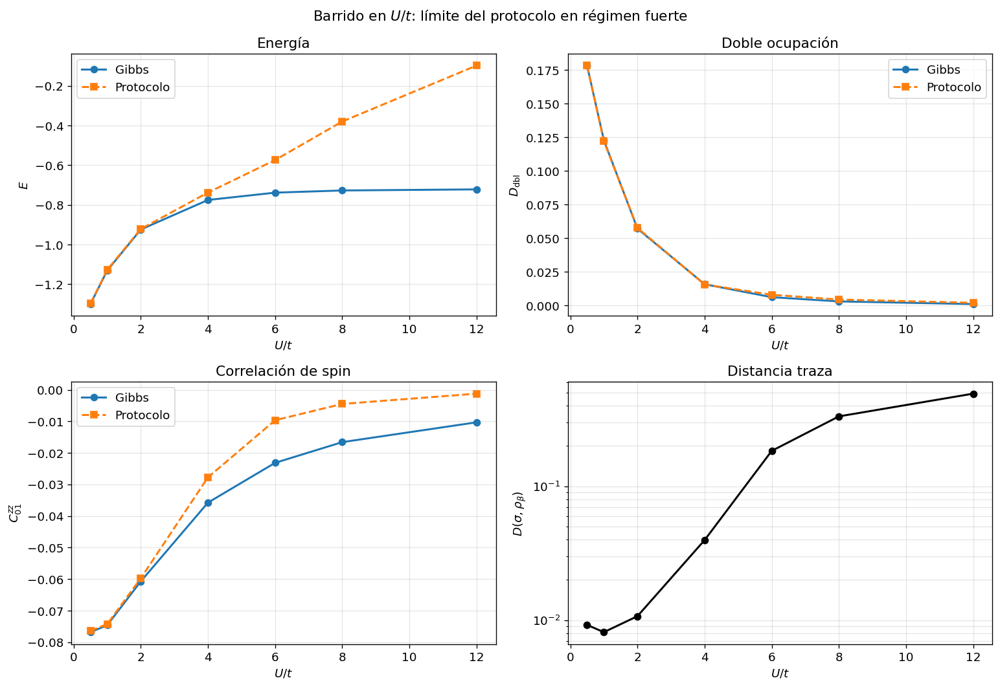

Resumen:
  Máxima D_trace para U/t <= 4 : 0.0396
  Mínima D_trace para U/t >= 6 : 0.1839

Lectura:
  El protocolo funciona bien en régimen débil/intermedio y falla claramente al entrar en régimen fuerte.


In [12]:
fig, axes = plt.subplots(2, 2, figsize=(13, 9))

axes[0, 0].plot(df_U["U/t"], df_U["E_Gibbs"], "o-", label="Gibbs")
axes[0, 0].plot(df_U["U/t"], df_U["E_protocol"], "s--", label="Protocolo")
axes[0, 0].set(xlabel="$U/t$", ylabel="$E$", title="Energía")
axes[0, 0].legend()
axes[0, 0].grid(alpha=0.3)

axes[0, 1].plot(df_U["U/t"], df_U["Ddbl_Gibbs"], "o-", label="Gibbs")
axes[0, 1].plot(df_U["U/t"], df_U["Ddbl_protocol"], "s--", label="Protocolo")
axes[0, 1].set(xlabel="$U/t$", ylabel="$D_{\\rm dbl}$", title="Doble ocupación")
axes[0, 1].legend()
axes[0, 1].grid(alpha=0.3)

axes[1, 0].plot(df_U["U/t"], df_U["Czz_Gibbs"], "o-", label="Gibbs")
axes[1, 0].plot(df_U["U/t"], df_U["Czz_protocol"], "s--", label="Protocolo")
axes[1, 0].set(xlabel="$U/t$", ylabel="$C^{zz}_{01}$", title="Correlación de spin")
axes[1, 0].legend()
axes[1, 0].grid(alpha=0.3)

axes[1, 1].semilogy(df_U["U/t"], df_U["D_trace"], "ko-")
axes[1, 1].set(
    xlabel="$U/t$",
    ylabel="$D(\\sigma,\\rho_\\beta)$",
    title="Distancia traza",
)
axes[1, 1].grid(alpha=0.3, which="both")

plt.suptitle("Barrido en $U/t$: límite del protocolo en régimen fuerte", fontsize=13)
plt.tight_layout()
plt.show()


# Resumen textual automático
weak = df_U[df_U["U/t"] <= 4]["D_trace"].max()
strong = df_U[df_U["U/t"] >= 6]["D_trace"].min()

print("Resumen:")
print(f"  Máxima D_trace para U/t <= 4 : {weak:.4f}")
print(f"  Mínima D_trace para U/t >= 6 : {strong:.4f}")
print()
print("Lectura:")
if weak < 0.05 and strong > 0.10:
    print("  El protocolo funciona bien en régimen débil/intermedio y falla claramente al entrar en régimen fuerte.")
else:
    print("  El cambio de régimen no es tan nítido; revisar parámetros o ciclos.")

### Diagnóstico de retuning en régimen fuerte

El barrido principal usa la estrategia `full_gibbs`, definida por

$$
h=\max(2t,U).
$$

Para $U/t=6,8,12$, esta regla coincide con la estrategia `carga`, porque entonces $h=U$.

Para comprobar si el fallo en régimen fuerte se debe solo a una mala elección de parámetros, probamos un pequeño grid de estrategias físicamente motivadas.

En este diagnóstico variamos la escala del baño $h$ manteniendo fija la regla de elección para el resto de parámetros.

En el régimen fuerte hay 2 escalas importantes $U
\qquad\text{y}\qquad
J_{\rm spin}=\frac{4t^2}{U}$, entonces probamos 4 elecciones:
- `h_choice = "full_gibbs"`-> $h=\max(2t,U)$ -> intenta preparar Gibbs completo, incluyendo escala de carga
- `h_choice = "spin"`       -> $h = J_{spin} = 4t²/U$ -> el baño apunta a transiciones de baja energía de spin.
- `h_choice = "intermedio"` -> $h = 2t$ -> el baño apunta a una escala cinética/hopping.
- `h_choice = "carga"`      -> $h = U$ -> el baño apunta a la escala de excitaciones de carga y doble ocupación.



Es un diagnóstico para ver si el fallo en $U/t$ grande se arregla simplemente cambiando la frecuencia del baño.


In [ ]:
U_diag = [6.0, 8.0, 12.0]
h_choices = ["full_gibbs", "carga", "intermedio", "spin"]

rows_hdiag = []
res_hdiag = {}

for U in U_diag:
    model_U = FermiHubbardJW(
        n_sites=2,
        bonds=[(0, 1)],
        t=1.0,
        U=U,
    )

    rho0_U = np.eye(model_U.dim) / model_U.dim
    rho_g_U = model_U.gibbs_state(beta_U)
    A_U, _ = build_coupling_ops_paper(model_U)

    for h_choice in h_choices:
        np.random.seed(42)

        p = tune_params_h_diagnostic(
            U,
            h_choice,
            t=1.0,
            beta=beta_U,
        )

        prot = ThermalProtocolSequential(
            model_U,
            A_U,
            h_bath=p["h"],
            beta=beta_U,
            theta=p["theta"],
            delta=p["delta"],
            M_T=p["M_T"],
            random_order=True,
            random_evolution=True,
        )

        out = prot.run(
            n_cycles=700,
            rho_init=rho0_U,
            verbose=False,
            record_every=50,
        )

        rho_f = out["rho_final"]
        res_hdiag[(U, h_choice)] = out

        rows_hdiag.append({
            "U/t": U,
            "h_choice": h_choice,
            "h": p["h"],
            "J_spin": p["J_spin"],
            "theta": p["theta"],
            "delta": p["delta"],
            "M_T": p["M_T"],

            "D_trace": trace_distance(rho_f, rho_g_U),

            "E_Gibbs": model_U.energy(rho_g_U),
            "E_protocol": model_U.energy(rho_f),
            "|ΔE|": abs(model_U.energy(rho_f) - model_U.energy(rho_g_U)),

            "Ddbl_Gibbs": model_U.avg_double_occupancy(rho_g_U),
            "Ddbl_protocol": model_U.avg_double_occupancy(rho_f),
            "|ΔDdbl|": abs(
                model_U.avg_double_occupancy(rho_f)
                - model_U.avg_double_occupancy(rho_g_U)
            ),

            "Czz_Gibbs": model_U.spin_correlation(rho_g_U, 0, 1),
            "Czz_protocol": model_U.spin_correlation(rho_f, 0, 1),
            "|ΔCzz|": abs(
                model_U.spin_correlation(rho_f, 0, 1)
                - model_U.spin_correlation(rho_g_U, 0, 1)
            ),
        })

df_hdiag = pd.DataFrame(rows_hdiag)

display(
    df_hdiag[
        [
            "U/t", "h_choice", "h", "J_spin", "theta", "delta", "M_T",
            "D_trace", "|ΔE|", "|ΔDdbl|", "|ΔCzz|",
            "E_Gibbs", "E_protocol",
            "Ddbl_Gibbs", "Ddbl_protocol",
        ]
    ]
    .sort_values(["U/t", "h_choice"])
    .round(6)
)

,U/t,h_choice,h,J_spin,theta,delta,M_T,D_trace,|ΔE|,|ΔDdbl|,|ΔCzz|,E_Gibbs,E_protocol,Ddbl_Gibbs,Ddbl_protocol
1,6.0,carga,6.000000,0.666667,0.120141,0.083333,18,0.183872,0.164424,0.001789,0.013499,-0.738187,-0.573763,0.006293,0.008082
0,6.0,full_gibbs,6.000000,0.666667,0.120141,0.083333,18,0.183872,0.164424,0.001789,0.013499,-0.738187,-0.573763,0.006293,0.008082
2,6.0,intermedio,2.000000,0.666667,0.158114,0.083333,30,0.127199,0.815682,0.066324,0.005510,-0.738187,0.077495,0.006293,0.072617
3,6.0,spin,0.666667,0.666667,0.200000,0.083333,52,0.437487,2.995879,0.246950,0.010018,-0.738187,2.257692,0.006293,0.253243
5,8.0,carga,8.000000,0.500000,0.111803,0.062500,20,0.332814,0.347890,0.001388,0.012104,-0.727172,-0.379282,0.003139,0.004526
4,8.0,full_gibbs,8.000000,0.500000,0.111803,0.062500,20,0.332814,0.347890,0.001388,0.012104,-0.727172,-0.379282,0.003139,0.004526
6,8.0,intermedio,2.000000,0.500000,0.158114,0.062500,40,0.427994,3.899513,0.242618,0.007162,-0.727172,3.172341,0.003139,0.245757
7,8.0,spin,0.500000,0.500000,0.200000,0.062500,80,0.437500,3.993782,0.248391,0.007094,-0.727172,3.266610,0.003139,0.251529
9,12.0,carga,12.000000,0.333333,0.101026,0.041667,25,0.492016,0.624564,0.000947,0.009077,-0.721694,-0.097129,0.001171,0.002119
8,12.0,full_gibbs,12.000000,0.333333,0.101026,0.041667,25,0.492016,0.624564,0.000947,0.009077,-0.721694,-0.097129,0.001171,0.002119


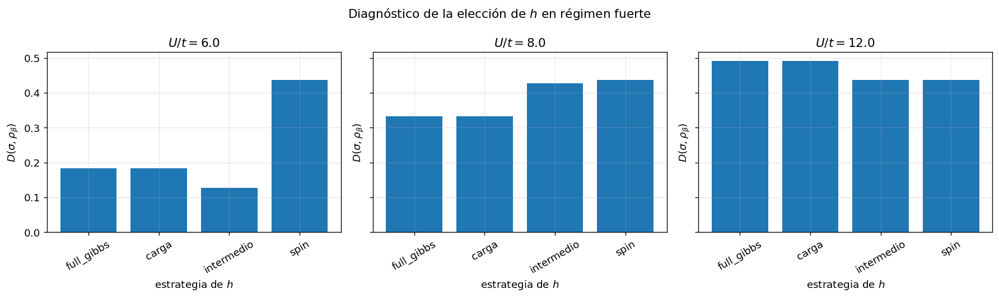

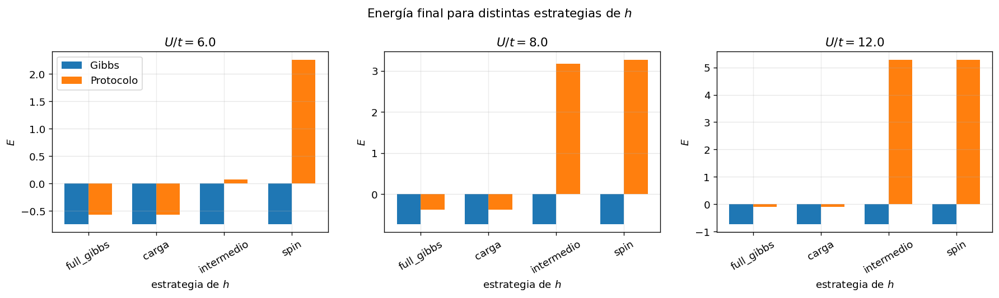

In [16]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4.5), sharey=True)

for ax, U in zip(axes, U_diag):
    sub = df_hdiag[df_hdiag["U/t"] == U].copy()

    ax.bar(
        sub["h_choice"],
        sub["D_trace"],
    )

    ax.set(
        title=f"$U/t={U}$",
        xlabel="estrategia de $h$",
        ylabel="$D(\\sigma,\\rho_\\beta)$",
    )

    ax.tick_params(axis="x", rotation=30)
    ax.grid(alpha=0.3, axis="y")

plt.suptitle("Diagnóstico de la elección de $h$ en régimen fuerte", fontsize=13)
plt.tight_layout()
plt.show()


fig, axes = plt.subplots(1, 3, figsize=(15, 4.5), sharey=False)

for ax, U in zip(axes, U_diag):
    sub = df_hdiag[df_hdiag["U/t"] == U].copy()

    x = np.arange(len(sub))
    width = 0.35

    ax.bar(
        x - width/2,
        sub["E_Gibbs"],
        width,
        label="Gibbs",
    )

    ax.bar(
        x + width/2,
        sub["E_protocol"],
        width,
        label="Protocolo",
    )

    ax.set(
        title=f"$U/t={U}$",
        xlabel="estrategia de $h$",
        ylabel="$E$",
        xticks=x,
        xticklabels=sub["h_choice"],
    )

    ax.tick_params(axis="x", rotation=30)
    ax.grid(alpha=0.3, axis="y")

axes[0].legend()

plt.suptitle("Energía final para distintas estrategias de $h$", fontsize=13)
plt.tight_layout()
plt.show()

In [ ]:
U_strong = [6.0, 8.0, 12.0]

h_choices = [
    "full_gibbs",
    "carga",
    "intermedio",
    "spin",
]

theta_grid = [
    0.10,
    0.15,
    0.20,
    0.35,
]

delta_factor_grid = [
    0.15,
    0.25,
]

window_factor_grid = [
    3.0,
    5.0,
]

beta_grid = 2.0
t_grid = 1.0
n_cycles_grid = 700

rows_grid = []
res_grid = {}

for U in U_strong:
    model_U = FermiHubbardJW(
        n_sites=2,
        bonds=[(0, 1)],
        t=t_grid,
        U=U,
    )

    rho0_U = np.eye(model_U.dim) / model_U.dim
    rho_g_U = model_U.gibbs_state(beta_grid)
    A_U, _ = build_coupling_ops_paper(model_U)

    for h_choice in h_choices:
        for theta in theta_grid:
            for delta_factor in delta_factor_grid:
                for window_factor in window_factor_grid:
                    p = candidate_params_strong(
                        U=U,
                        h_choice=h_choice,
                        theta=theta,
                        delta_factor=delta_factor,
                        window_factor=window_factor,
                        t=t_grid,
                        beta=beta_grid,
                    )

                    # Evita repetir cálculos idénticos:
                    # para U fuerte, full_gibbs y carga suelen ser iguales.
                    key_params = (
                        U,
                        round(p["h"], 12),
                        round(p["theta"], 12),
                        round(p["delta"], 12),
                        int(p["M_T"]),
                    )

                    if key_params in res_grid:
                        out = res_grid[key_params]["out"]
                        rho_f = res_grid[key_params]["rho_f"]
                    else:
                        np.random.seed(42)

                        prot = ThermalProtocolSequential(
                            model_U,
                            A_U,
                            h_bath=p["h"],
                            beta=beta_grid,
                            theta=p["theta"],
                            delta=p["delta"],
                            M_T=p["M_T"],
                            random_order=True,
                            random_evolution=True,
                        )

                        out = prot.run(
                            n_cycles=n_cycles_grid,
                            rho_init=rho0_U,
                            verbose=False,
                            record_every=50,
                        )

                        rho_f = out["rho_final"]

                        res_grid[key_params] = {
                            "out": out,
                            "rho_f": rho_f,
                        }

                    rows_grid.append({
                        "U/t": U,
                        "h_choice": h_choice,
                        "h": p["h"],
                        "J_spin": p["J_spin"],
                        "theta": p["theta"],
                        "delta": p["delta"],
                        "M_T": p["M_T"],
                        "delta_factor": p["delta_factor"],
                        "window_factor": p["window_factor"],

                        "D_trace": trace_distance(rho_f, rho_g_U),

                        "E_Gibbs": model_U.energy(rho_g_U),
                        "E_protocol": model_U.energy(rho_f),
                        "|ΔE|": abs(model_U.energy(rho_f) - model_U.energy(rho_g_U)),

                        "Ddbl_Gibbs": model_U.avg_double_occupancy(rho_g_U),
                        "Ddbl_protocol": model_U.avg_double_occupancy(rho_f),
                        "|ΔDdbl|": abs(
                            model_U.avg_double_occupancy(rho_f)
                            - model_U.avg_double_occupancy(rho_g_U)
                        ),

                        "Czz_Gibbs": model_U.spin_correlation(rho_g_U, 0, 1),
                        "Czz_protocol": model_U.spin_correlation(rho_f, 0, 1),
                        "|ΔCzz|": abs(
                            model_U.spin_correlation(rho_f, 0, 1)
                            - model_U.spin_correlation(rho_g_U, 0, 1)
                        ),

                        "key_params": key_params,
                    })

df_grid = pd.DataFrame(rows_grid)

display(
    df_grid
    .sort_values(["U/t", "D_trace"])
    .groupby("U/t")
    .head(10)
    .round(6)
)

,U/t,h_choice,h,J_spin,theta,delta,M_T,delta_factor,window_factor,D_trace,E_Gibbs,E_protocol,|ΔE|,Ddbl_Gibbs,Ddbl_protocol,|ΔDdbl|,Czz_Gibbs,Czz_protocol,|ΔCzz|,key_params
44,6.0,intermedio,2.0,0.666667,0.35,0.050000,31,0.15,3.0,0.017668,-0.738187,-0.727121,0.011066,0.006293,0.007291,0.000998,-0.023155,-0.022903,0.000252,"(6.0, 2.0, 0.35, 0.05, 31)"
45,6.0,intermedio,2.0,0.666667,0.35,0.050000,51,0.15,5.0,0.018909,-0.738187,-0.725986,0.012201,0.006293,0.007298,0.001004,-0.023155,-0.022871,0.000284,"(6.0, 2.0, 0.35, 0.05, 51)"
47,6.0,intermedio,2.0,0.666667,0.35,0.083333,30,0.25,5.0,0.019391,-0.738187,-0.728525,0.009662,0.006293,0.007143,0.000850,-0.023155,-0.022787,0.000369,"(6.0, 2.0, 0.35, 0.083333333333, 30)"
46,6.0,intermedio,2.0,0.666667,0.35,0.083333,18,0.25,3.0,0.020567,-0.738187,-0.728297,0.009890,0.006293,0.007114,0.000820,-0.023155,-0.022944,0.000211,"(6.0, 2.0, 0.35, 0.083333333333, 18)"
15,6.0,full_gibbs,6.0,0.666667,0.35,0.083333,18,0.25,5.0,0.028371,-0.738187,-0.732004,0.006183,0.006293,0.007058,0.000765,-0.023155,-0.022266,0.000889,"(6.0, 6.0, 0.35, 0.083333333333, 18)"
31,6.0,carga,6.0,0.666667,0.35,0.083333,18,0.25,5.0,0.028371,-0.738187,-0.732004,0.006183,0.006293,0.007058,0.000765,-0.023155,-0.022266,0.000889,"(6.0, 6.0, 0.35, 0.083333333333, 18)"
14,6.0,full_gibbs,6.0,0.666667,0.35,0.083333,11,0.25,3.0,0.029042,-0.738187,-0.731460,0.006727,0.006293,0.006975,0.000682,-0.023155,-0.022032,0.001123,"(6.0, 6.0, 0.35, 0.083333333333, 11)"
30,6.0,carga,6.0,0.666667,0.35,0.083333,11,0.25,3.0,0.029042,-0.738187,-0.731460,0.006727,0.006293,0.006975,0.000682,-0.023155,-0.022032,0.001123,"(6.0, 6.0, 0.35, 0.083333333333, 11)"
13,6.0,full_gibbs,6.0,0.666667,0.35,0.050000,29,0.15,5.0,0.032513,-0.738187,-0.732473,0.005714,0.006293,0.007030,0.000736,-0.023155,-0.022409,0.000747,"(6.0, 6.0, 0.35, 0.05, 29)"
29,6.0,carga,6.0,0.666667,0.35,0.050000,29,0.15,5.0,0.032513,-0.738187,-0.732473,0.005714,0.006293,0.007030,0.000736,-0.023155,-0.022409,0.000747,"(6.0, 6.0, 0.35, 0.05, 29)"


Mejor candidato por U/t dentro del grid:


,U/t,h_choice,h,J_spin,theta,delta,M_T,delta_factor,window_factor,D_trace,|ΔE|,|ΔDdbl|,|ΔCzz|
0,6.0,intermedio,2.0,0.666667,0.35,0.0500,31,0.15,3.0,0.017668,0.011066,0.000998,0.000252
1,8.0,full_gibbs,8.0,0.500000,0.35,0.0375,34,0.15,5.0,0.054320,0.041735,0.000405,0.004153
2,12.0,full_gibbs,12.0,0.333333,0.35,0.0250,41,0.15,5.0,0.306894,0.311304,0.000914,0.008985


Mejor resultado por estrategia de h:


,U/t,h_choice,h,theta,delta,M_T,D_trace,|ΔE|,|ΔDdbl|,|ΔCzz|
2,6.0,intermedio,2.000000,0.35,0.050000,31,0.017668,0.011066,0.000998,0.000252
0,6.0,carga,6.000000,0.35,0.083333,18,0.028371,0.006183,0.000765,0.000889
1,6.0,full_gibbs,6.000000,0.35,0.083333,18,0.028371,0.006183,0.000765,0.000889
3,6.0,spin,0.666667,0.35,0.083333,52,0.437449,2.998338,0.246928,0.010054
4,8.0,carga,8.000000,0.35,0.037500,34,0.054320,0.041735,0.000405,0.004153
5,8.0,full_gibbs,8.000000,0.35,0.037500,34,0.054320,0.041735,0.000405,0.004153
6,8.0,intermedio,2.000000,0.35,0.062500,24,0.386146,3.497625,0.217632,0.006359
7,8.0,spin,0.500000,0.35,0.062500,48,0.437498,3.999572,0.248392,0.006864
8,12.0,carga,12.000000,0.35,0.025000,41,0.306894,0.311304,0.000914,0.008985
9,12.0,full_gibbs,12.000000,0.35,0.025000,41,0.306894,0.311304,0.000914,0.008985


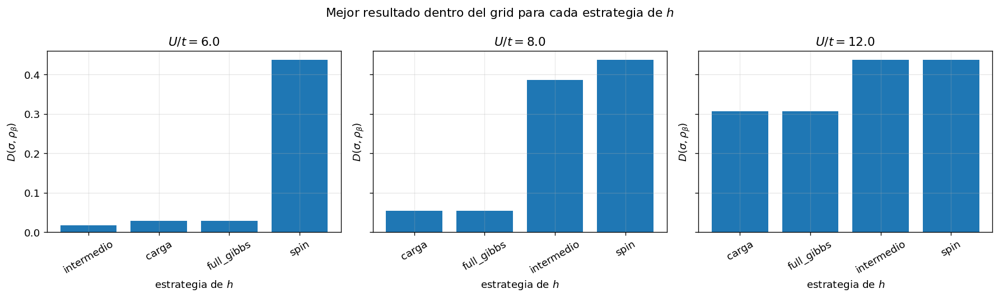

In [18]:
df_best_strong = (
    df_grid
    .sort_values(["U/t", "D_trace"])
    .groupby("U/t", as_index=False)
    .first()
)

print("Mejor candidato por U/t dentro del grid:")
display(
    df_best_strong[
        [
            "U/t",
            "h_choice",
            "h",
            "J_spin",
            "theta",
            "delta",
            "M_T",
            "delta_factor",
            "window_factor",
            "D_trace",
            "|ΔE|",
            "|ΔDdbl|",
            "|ΔCzz|",
        ]
    ].round(6)
)


print("Mejor resultado por estrategia de h:")
df_best_by_h = (
    df_grid
    .sort_values(["U/t", "h_choice", "D_trace"])
    .groupby(["U/t", "h_choice"], as_index=False)
    .first()
)

display(
    df_best_by_h[
        [
            "U/t",
            "h_choice",
            "h",
            "theta",
            "delta",
            "M_T",
            "D_trace",
            "|ΔE|",
            "|ΔDdbl|",
            "|ΔCzz|",
        ]
    ]
    .sort_values(["U/t", "D_trace"])
    .round(6)
)


fig, axes = plt.subplots(1, 3, figsize=(15, 4.5), sharey=True)

for ax, U in zip(axes, U_strong):
    sub = df_best_by_h[df_best_by_h["U/t"] == U].copy()
    sub = sub.sort_values("D_trace")

    ax.bar(
        sub["h_choice"],
        sub["D_trace"],
    )

    ax.set(
        title=f"$U/t={U}$",
        xlabel="estrategia de $h$",
        ylabel="$D(\\sigma,\\rho_\\beta)$",
    )

    ax.tick_params(axis="x", rotation=30)
    ax.grid(alpha=0.3, axis="y")

plt.suptitle("Mejor resultado dentro del grid para cada estrategia de $h$", fontsize=13)
plt.tight_layout()
plt.show()

,U/t,h_choice,h,J_spin,theta,delta,M_T,D_trace,E_Gibbs,E_protocol,|ΔE|,Ddbl_Gibbs,Ddbl_protocol,|ΔDdbl|,Czz_Gibbs,Czz_protocol,|ΔCzz|
0,0.5,full_gibbs,2.0,8.000000,0.158114,0.2000,13,0.009211,-1.300151,-1.297610,0.002541,0.178390,0.178417,0.000027,-0.076798,-0.076396,0.000402
1,1.0,full_gibbs,2.0,4.000000,0.158114,0.2000,13,0.008130,-1.130991,-1.127095,0.003897,0.123015,0.122121,0.000894,-0.074584,-0.074240,0.000344
2,2.0,full_gibbs,2.0,2.000000,0.158114,0.2000,13,0.010699,-0.924058,-0.921315,0.002743,0.057231,0.057781,0.000549,-0.060700,-0.059707,0.000993
3,4.0,full_gibbs,4.0,1.000000,0.132957,0.1250,15,0.039599,-0.775146,-0.737772,0.037374,0.015912,0.015692,0.000220,-0.035756,-0.027748,0.008007
4,6.0,intermedio,2.0,0.666667,0.350000,0.0500,31,0.017668,-0.738187,-0.727121,0.011066,0.006293,0.007291,0.000998,-0.023155,-0.022903,0.000252
5,8.0,full_gibbs,8.0,0.500000,0.350000,0.0375,34,0.054320,-0.727172,-0.685437,0.041735,0.003139,0.003543,0.000405,-0.016596,-0.012444,0.004153
6,12.0,full_gibbs,12.0,0.333333,0.350000,0.0250,41,0.306894,-0.721694,-0.410389,0.311304,0.001171,0.002085,0.000914,-0.010313,-0.001328,0.008985


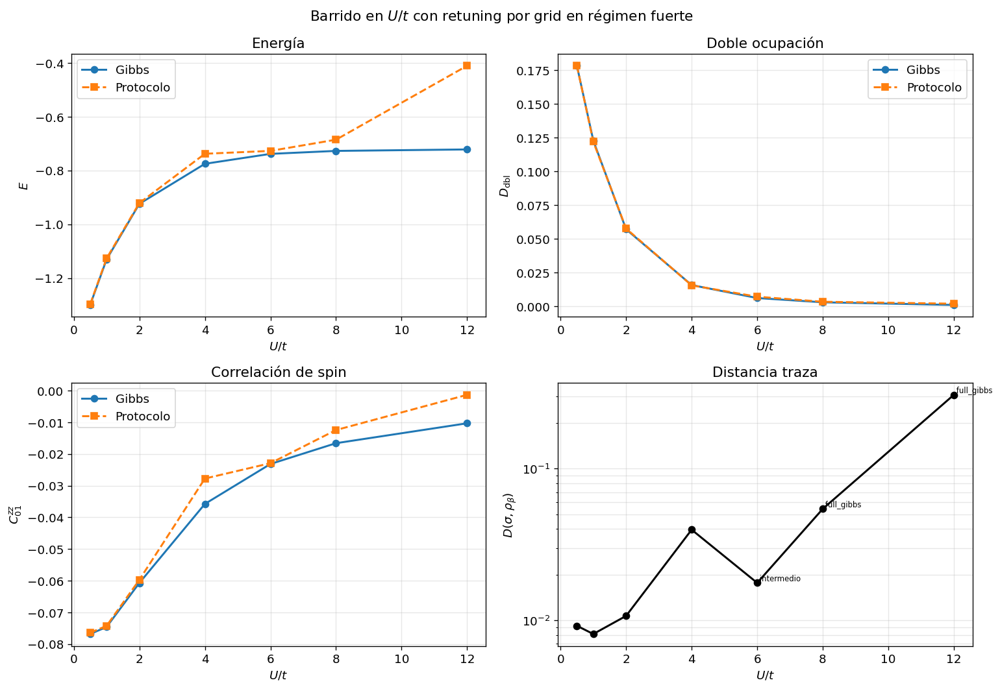

In [19]:
cols_plot = [
    "U/t",
    "h_choice",
    "h",
    "J_spin",
    "theta",
    "delta",
    "M_T",
    "D_trace",
    "E_Gibbs",
    "E_protocol",
    "|ΔE|",
    "Ddbl_Gibbs",
    "Ddbl_protocol",
    "|ΔDdbl|",
    "Czz_Gibbs",
    "Czz_protocol",
    "|ΔCzz|",
]

# Conservamos el barrido principal para U/t < 6
# y sustituimos U/t = 6,8,12 por los mejores candidatos del grid.
df_low = df_U[df_U["U/t"] < 6.0].copy()
df_low["h_choice"] = "full_gibbs"

for col in cols_plot:
    if col not in df_low.columns:
        df_low[col] = np.nan

df_plot_grid_best = pd.concat(
    [
        df_low[cols_plot],
        df_best_strong[cols_plot],
    ],
    ignore_index=True,
).sort_values("U/t")

display(df_plot_grid_best.round(6))


fig, axes = plt.subplots(2, 2, figsize=(13, 9))

axes[0, 0].plot(
    df_plot_grid_best["U/t"],
    df_plot_grid_best["E_Gibbs"],
    "o-",
    label="Gibbs",
)

axes[0, 0].plot(
    df_plot_grid_best["U/t"],
    df_plot_grid_best["E_protocol"],
    "s--",
    label="Protocolo",
)

axes[0, 0].set(
    xlabel="$U/t$",
    ylabel="$E$",
    title="Energía",
)
axes[0, 0].legend()
axes[0, 0].grid(alpha=0.3)


axes[0, 1].plot(
    df_plot_grid_best["U/t"],
    df_plot_grid_best["Ddbl_Gibbs"],
    "o-",
    label="Gibbs",
)

axes[0, 1].plot(
    df_plot_grid_best["U/t"],
    df_plot_grid_best["Ddbl_protocol"],
    "s--",
    label="Protocolo",
)

axes[0, 1].set(
    xlabel="$U/t$",
    ylabel="$D_{\\rm dbl}$",
    title="Doble ocupación",
)
axes[0, 1].legend()
axes[0, 1].grid(alpha=0.3)


axes[1, 0].plot(
    df_plot_grid_best["U/t"],
    df_plot_grid_best["Czz_Gibbs"],
    "o-",
    label="Gibbs",
)

axes[1, 0].plot(
    df_plot_grid_best["U/t"],
    df_plot_grid_best["Czz_protocol"],
    "s--",
    label="Protocolo",
)

axes[1, 0].set(
    xlabel="$U/t$",
    ylabel="$C^{zz}_{01}$",
    title="Correlación de spin",
)
axes[1, 0].legend()
axes[1, 0].grid(alpha=0.3)


axes[1, 1].semilogy(
    df_plot_grid_best["U/t"],
    df_plot_grid_best["D_trace"],
    "ko-",
)

axes[1, 1].set(
    xlabel="$U/t$",
    ylabel="$D(\\sigma,\\rho_\\beta)$",
    title="Distancia traza",
)

for _, row in df_plot_grid_best.iterrows():
    if row["U/t"] in U_strong:
        axes[1, 1].text(
            row["U/t"],
            row["D_trace"],
            f" {row['h_choice']}",
            fontsize=7,
            va="bottom",
        )

axes[1, 1].grid(alpha=0.3, which="both")

plt.suptitle(
    "Barrido en $U/t$ con retuning por grid en régimen fuerte",
    fontsize=13,
)

plt.tight_layout()
plt.show()

### Lectura del barrido en $U/t$

El barrido muestra que el protocolo tipo Paper funciona bien para $U/t$ pequeño e intermedio, pero pierde precisión al entrar en régimen fuerte.

Esto no debe interpretarse como un fallo accidental del código. En régimen Mott-like aparecen escalas separadas: la escala de carga $U$ y la escala efectiva de spin $J_{\rm spin}=4t^2/U$. El canal con acoplos locales simples no resuelve automáticamente ambas.

El retuning usado en el barrido principal ajusta $h$, $\theta$, $\delta$ y $M_T$ en cada punto. Aun así, para $U/t\ge 6$ la distancia traza crece. El diagnóstico adicional muestra si apuntar el baño a la escala de spin, a una escala intermedia o a la escala de carga mejora el resultado. Si ninguna opción recupera una distancia traza pequeña, la conclusión es que el régimen fuerte requiere más que un simple retuning: harían falta otros acoplos, sectorización, filtros más específicos o un protocolo diseñado para la física efectiva de spin.

El barrido muestra que el protocolo tipo Paper reproduce bien el Gibbs exacto para $U/t$ pequeño e intermedio. En ese régimen, la energía, la doble ocupación y la correlación de spin siguen de cerca los valores térmicos.

A partir de $U/t\gtrsim 6$, la distancia traza aumenta claramente. La doble ocupación puede seguir siendo razonable, pero la energía y las correlaciones muestran que el estado completo ya no coincide bien con Gibbs.

Esto es esperable en régimen fuertemente correlacionado. Para $U/t$ grande aparecen dos escalas separadas: la escala de carga $U$ y la escala efectiva de spin $J_{\rm spin}=4t^2/U$. El acoplo local tipo Paper y un único filtro no resuelven automáticamente ambas escalas.

Por tanto, no lo interpretamos como un error del código, sino como una limitación física del protocolo simple en régimen fuerte.

### A.4.2 Barrido en temperatura

En este barrido mantenemos fijo el Hamiltoniano del dímero, con $t=1$ y $U=4$, y cambiamos la temperatura objetivo.

Usamos $\beta=1/T$:

$$
\rho_\beta=\frac{e^{-\beta H}}{Z}.
$$

Valores grandes de $\beta$ corresponden a baja temperatura. A baja temperatura, Gibbs concentra más peso en los autoestados de menor energía y la preparación se vuelve más difícil.

Comparamos dos elecciones de $h$:

- `benchmark_h1`: usa $h=1$, el valor que funcionaba bien en el benchmark inicial del dímero.
- `full_gibbs`: usa $h=\max(2t,U)=4$, siguiendo la escala de carga del Hamiltoniano.

El objetivo es ver cómo cambia la calidad del protocolo al bajar la temperatura.

In [ ]:
betas = [0.3, 0.5, 1.0, 2.0, 3.0, 5.0]
strategies_T = ["benchmark_h1", "full_gibbs"]

dimer_T = FermiHubbardJW(n_sites=2, bonds=[(0, 1)], t=1.0, U=4.0)
A_T, _ = build_coupling_ops_paper(dimer_T)

rows_beta = []
res_beta = {}

for beta in betas:
    rho_g_T = dimer_T.gibbs_state(beta)
    rho0_T = np.eye(dimer_T.dim) / dimer_T.dim

    for strategy in strategies_T:
        np.random.seed(42)

        p = params_temperature_sweep(
            beta=beta,
            strategy=strategy,
            t=1.0,
            U=4.0,
        )

        prot_T = ThermalProtocolSequential(
            dimer_T,
            A_T,
            h_bath=p["h"],
            beta=beta,
            theta=p["theta"],
            delta=p["delta"],
            M_T=p["M_T"],
            random_order=True,
            random_evolution=True,
        )

        n_cycles = max(500, int(180 * beta))

        out_T = prot_T.run(
            n_cycles=n_cycles,
            rho_init=rho0_T,
            verbose=False,
            record_every=25,
        )

        rho_f_T = out_T["rho_final"]
        res_beta[(beta, strategy)] = out_T

        rows_beta.append({
            "beta": beta,
            "T": 1.0 / beta,
            "strategy": strategy,
            "h": p["h"],
            "theta": p["theta"],
            "delta": p["delta"],
            "M_T": p["M_T"],
            "n_cycles": n_cycles,

            "D_trace": trace_distance(rho_f_T, rho_g_T),

            "E_Gibbs": dimer_T.energy(rho_g_T),
            "E_protocol": dimer_T.energy(rho_f_T),
            "|ΔE|": abs(dimer_T.energy(rho_f_T) - dimer_T.energy(rho_g_T)),

            "Ddbl_Gibbs": dimer_T.avg_double_occupancy(rho_g_T),
            "Ddbl_protocol": dimer_T.avg_double_occupancy(rho_f_T),
            "|ΔDdbl|": abs(
                dimer_T.avg_double_occupancy(rho_f_T)
                - dimer_T.avg_double_occupancy(rho_g_T)
            ),

            "Czz_Gibbs": dimer_T.spin_correlation(rho_g_T, 0, 1),
            "Czz_protocol": dimer_T.spin_correlation(rho_f_T, 0, 1),
            "|ΔCzz|": abs(
                dimer_T.spin_correlation(rho_f_T, 0, 1)
                - dimer_T.spin_correlation(rho_g_T, 0, 1)
            ),
        })

df_beta_compare = pd.DataFrame(rows_beta)

display(
    df_beta_compare[
        [
            "beta", "T", "strategy", "h", "theta", "delta", "M_T",
            "D_trace", "|ΔE|", "|ΔDdbl|", "|ΔCzz|",
        ]
    ].round(6)
)

,beta,T,strategy,h,theta,delta,M_T,D_trace,|ΔE|,|ΔDdbl|,|ΔCzz|
0,0.3,3.333333,benchmark_h1,1.0,0.350000,0.300,8,0.012831,0.023400,0.002803,0.000269
1,0.3,3.333333,full_gibbs,4.0,0.200000,0.125,8,0.005305,0.002810,0.000116,0.000083
2,0.5,2.000000,benchmark_h1,1.0,0.350000,0.300,8,0.016550,0.031460,0.003716,0.000391
3,0.5,2.000000,full_gibbs,4.0,0.188030,0.125,8,0.007963,0.003828,0.000061,0.000156
4,1.0,1.000000,benchmark_h1,1.0,0.350000,0.300,9,0.017523,0.024766,0.002391,0.000485
5,1.0,1.000000,full_gibbs,4.0,0.158114,0.125,10,0.010574,0.003130,0.000738,0.000559
6,2.0,0.500000,benchmark_h1,1.0,0.350000,0.300,12,0.024390,0.013281,0.001296,0.000602
7,2.0,0.500000,full_gibbs,4.0,0.132957,0.125,15,0.071573,0.067973,0.000361,0.012776
8,3.0,0.333333,benchmark_h1,1.0,0.350000,0.300,15,0.058002,0.194488,0.023096,0.002447
9,3.0,0.333333,full_gibbs,4.0,0.120141,0.125,18,0.229855,0.203137,0.003279,0.025685


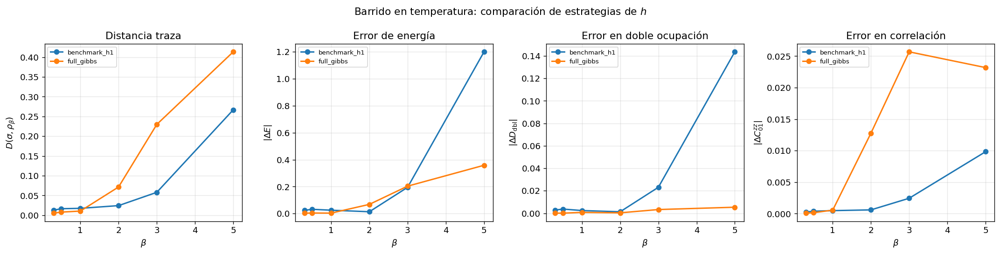

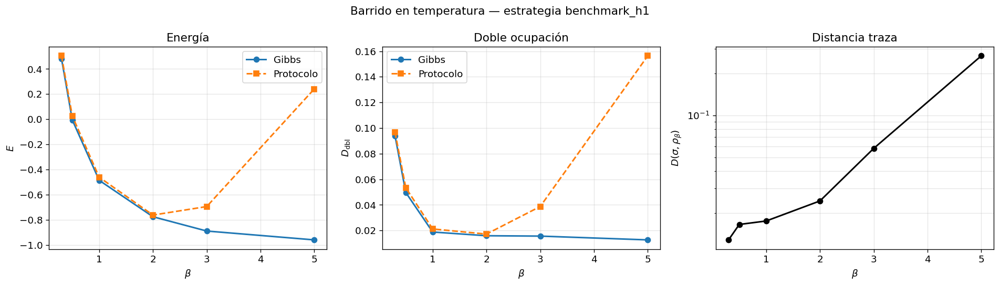

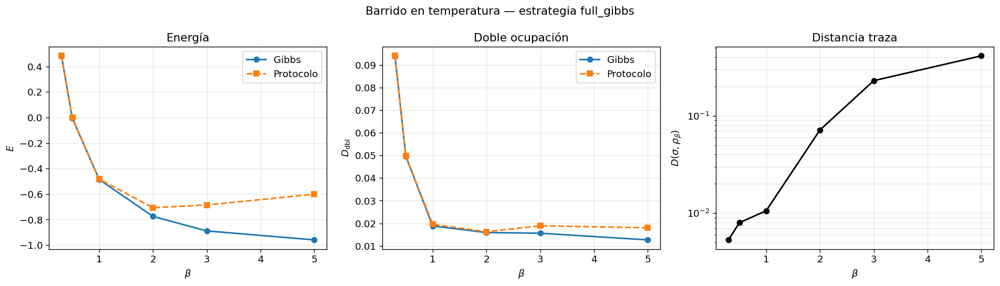

In [23]:
fig, axes = plt.subplots(1, 4, figsize=(18, 4.6))

for strategy in strategies_T:
    sub = df_beta_compare[df_beta_compare["strategy"] == strategy].copy()

    axes[0].plot(
        sub["beta"],
        sub["D_trace"],
        "o-",
        label=strategy,
    )

    axes[1].plot(
        sub["beta"],
        sub["|ΔE|"],
        "o-",
        label=strategy,
    )

    axes[2].plot(
        sub["beta"],
        sub["|ΔDdbl|"],
        "o-",
        label=strategy,
    )

    axes[3].plot(
        sub["beta"],
        sub["|ΔCzz|"],
        "o-",
        label=strategy,
    )

axes[0].set(
    xlabel="$\\beta$",
    ylabel="$D(\\sigma,\\rho_\\beta)$",
    title="Distancia traza",
)

axes[1].set(
    xlabel="$\\beta$",
    ylabel="$|\\Delta E|$",
    title="Error de energía",
)

axes[2].set(
    xlabel="$\\beta$",
    ylabel="$|\\Delta D_{\\rm dbl}|$",
    title="Error en doble ocupación",
)

axes[3].set(
    xlabel="$\\beta$",
    ylabel="$|\\Delta C^{zz}_{01}|$",
    title="Error en correlación",
)

for ax in axes:
    ax.grid(alpha=0.3)
    ax.legend(fontsize=8)

plt.suptitle("Barrido en temperatura: comparación de estrategias de $h$", fontsize=13)
plt.tight_layout()
plt.show()


# Plots Gibbs vs protocolo para cada estrategia
for strategy in strategies_T:
    df_beta = (
        df_beta_compare[df_beta_compare["strategy"] == strategy]
        .copy()
        .sort_values("beta")
    )

    fig, axes = plt.subplots(1, 3, figsize=(16, 4.6))

    axes[0].plot(df_beta["beta"], df_beta["E_Gibbs"], "o-", label="Gibbs")
    axes[0].plot(df_beta["beta"], df_beta["E_protocol"], "s--", label="Protocolo")
    axes[0].set(
        xlabel="$\\beta$",
        ylabel="$E$",
        title="Energía",
    )
    axes[0].legend()
    axes[0].grid(alpha=0.3)

    axes[1].plot(df_beta["beta"], df_beta["Ddbl_Gibbs"], "o-", label="Gibbs")
    axes[1].plot(df_beta["beta"], df_beta["Ddbl_protocol"], "s--", label="Protocolo")
    axes[1].set(
        xlabel="$\\beta$",
        ylabel="$D_{\\rm dbl}$",
        title="Doble ocupación",
    )
    axes[1].legend()
    axes[1].grid(alpha=0.3)

    axes[2].semilogy(df_beta["beta"], df_beta["D_trace"], "ko-")
    axes[2].set(
        xlabel="$\\beta$",
        ylabel="$D(\\sigma,\\rho_\\beta)$",
        title="Distancia traza",
    )
    axes[2].grid(alpha=0.3, which="both")

    plt.suptitle(f"Barrido en temperatura — estrategia {strategy}", fontsize=13)
    plt.tight_layout()
    plt.show()

La comparación muestra que no hay un ganador universal.

`benchmark_h1` puede dar menor distancia traza en parte del barrido, pero a baja temperatura produce errores grandes en energía y doble ocupación. `full_gibbs` no siempre minimiza la distancia traza, pero mantiene observables físicos más razonables en el régimen de baja temperatura.

Por tanto, el barrido en temperatura se interpreta como un test de robustez: al aumentar $\beta$, la preparación se vuelve más difícil. La elección de $h$ afecta de forma distinta a la distancia traza y a observables físicos concretos.

### A.4.3 Barrido en $h$

El parámetro $h$ fija la escala energética del baño. Aunque una regla natural podría ser usar una escala del Hamiltoniano, como $h\sim U$, el protocolo depende de las transiciones que tienen peso bajo los operadores de acoplo $A_\mu$.

Por eso hacemos un barrido directo en $h$ para el dímero con $U/t=4$ y $\beta=2$.

En esta sección solo medimos el rendimiento del protocolo. La interpretación espectral de por qué ciertos valores de $h$ funcionan mejor se mueve a la sección A.5 de resonancias y espectro.

,h,D_trace,E,|ΔE|,D_dbl,|ΔD_dbl|,Czz,|ΔCzz|
0,0.10,0.441354,1.402929,2.178074,0.251279,0.235367,-0.013377,0.022379
1,0.30,0.437073,1.237456,2.012602,0.258507,0.242595,-0.020617,0.015139
2,0.50,0.403425,1.071850,1.846996,0.238359,0.222447,-0.021095,0.014660
3,0.75,0.113546,-0.302656,0.472490,0.072695,0.056783,-0.030719,0.005036
4,1.00,0.024390,-0.761865,0.013281,0.017208,0.001296,-0.035154,0.000602
5,1.25,0.024867,-0.768422,0.006723,0.016402,0.000490,-0.035207,0.000548
6,1.50,0.025932,-0.768527,0.006619,0.016339,0.000427,-0.035158,0.000597
7,2.00,0.028581,-0.767741,0.007405,0.016313,0.000401,-0.035042,0.000713
8,3.00,0.034900,-0.766270,0.008876,0.016299,0.000387,-0.034842,0.000913
9,4.00,0.040962,-0.764968,0.010178,0.016272,0.000360,-0.034810,0.000945


Mejor h por distancia traza: h=1.0


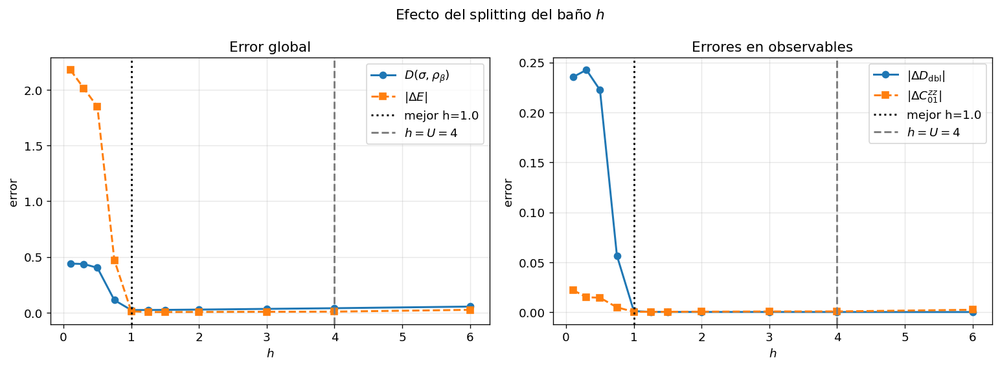

In [24]:
h_values = [0.1, 0.3, 0.5, 0.75, 1.0, 1.25, 1.5, 2.0, 3.0, 4.0, 6.0]

beta_h = 2.0
theta_h = 0.35
delta_h = 0.30
M_T_h = 12

rho_g_h = dimer.gibbs_state(beta_h)
A_h, _ = build_coupling_ops_paper(dimer)

rows_h = []
res_h = {}

for h in h_values:
    np.random.seed(42)

    prot_h = ThermalProtocolSequential(
        dimer,
        A_h,
        h_bath=h,
        beta=beta_h,
        theta=theta_h,
        delta=delta_h,
        M_T=M_T_h,
        random_order=True,
        random_evolution=True,
    )

    out_h = prot_h.run(
        n_cycles=500,
        verbose=False,
        record_every=25,
    )

    rho_f_h = out_h["rho_final"]
    res_h[h] = out_h

    rows_h.append({
        "h": h,
        "D_trace": trace_distance(rho_f_h, rho_g_h),

        "E": dimer.energy(rho_f_h),
        "|ΔE|": abs(dimer.energy(rho_f_h) - dimer.energy(rho_g_h)),

        "D_dbl": dimer.avg_double_occupancy(rho_f_h),
        "|ΔD_dbl|": abs(
            dimer.avg_double_occupancy(rho_f_h)
            - dimer.avg_double_occupancy(rho_g_h)
        ),

        "Czz": dimer.spin_correlation(rho_f_h, 0, 1),
        "|ΔCzz|": abs(
            dimer.spin_correlation(rho_f_h, 0, 1)
            - dimer.spin_correlation(rho_g_h, 0, 1)
        ),
    })

df_h = pd.DataFrame(rows_h)
display(df_h.round(6))

h_best = float(df_h.loc[df_h["D_trace"].idxmin(), "h"])
print(f"Mejor h por distancia traza: h={h_best}")


fig, axes = plt.subplots(1, 2, figsize=(13, 4.8))

axes[0].plot(
    df_h["h"],
    df_h["D_trace"],
    "o-",
    label="$D(\\sigma,\\rho_\\beta)$",
)

axes[0].plot(
    df_h["h"],
    df_h["|ΔE|"],
    "s--",
    label="$|\\Delta E|$",
)

axes[0].axvline(
    h_best,
    color="k",
    ls=":",
    label=f"mejor h={h_best}",
)

axes[0].axvline(
    4.0,
    color="gray",
    ls="--",
    label="$h=U=4$",
)

axes[0].set(
    xlabel="$h$",
    ylabel="error",
    title="Error global",
)

axes[0].legend()
axes[0].grid(alpha=0.3)


axes[1].plot(
    df_h["h"],
    df_h["|ΔD_dbl|"],
    "o-",
    label="$|\\Delta D_{\\rm dbl}|$",
)

axes[1].plot(
    df_h["h"],
    df_h["|ΔCzz|"],
    "s--",
    label="$|\\Delta C^{zz}_{01}|$",
)

axes[1].axvline(
    h_best,
    color="k",
    ls=":",
    label=f"mejor h={h_best}",
)

axes[1].axvline(
    4.0,
    color="gray",
    ls="--",
    label="$h=U=4$",
)

axes[1].set(
    xlabel="$h$",
    ylabel="error",
    title="Errores en observables",
)

axes[1].legend()
axes[1].grid(alpha=0.3)

plt.suptitle("Efecto del splitting del baño $h$", fontsize=13)
plt.tight_layout()
plt.show()

El barrido muestra que $h=U=4$ no es necesariamente la mejor elección para el dímero. Los errores mínimos aparecen para valores de $h$ de orden $t$, cercanos al benchmark $h=1$.

Esto no contradice el barrido en $U/t$: $h=U$ es una regla razonable para seguir la escala de carga, pero no garantiza que el filtro esté sintonizado con las transiciones que realmente pesan bajo los operadores $A_\mu$.

La interpretación espectral de este resultado se estudia en A.5.

  h=0.1: D=0.486874
  h=0.3: D=0.437085
  h=0.5: D=0.403695
  h=1.0: D=0.023916
  h=2.0: D=0.029660
  h=4.0: D=0.034872


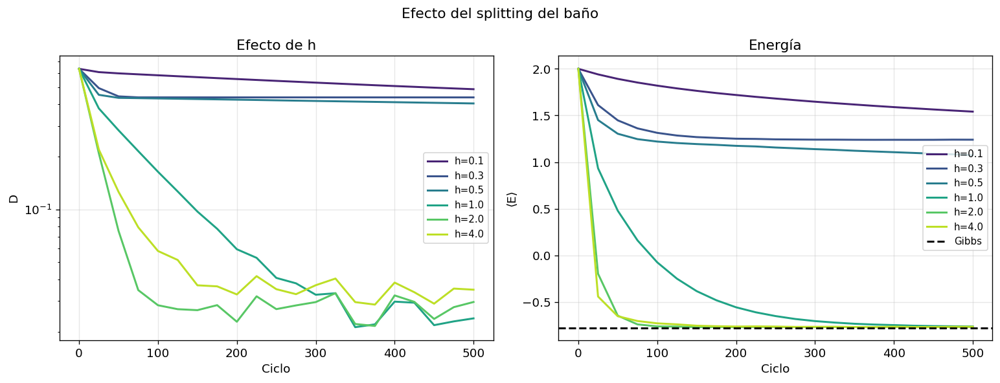

In [27]:
res_h = {}
for h in [0.1, 0.3, 0.5, 1.0, 2.0, 4.0]:
    np.random.seed(42)
    res_h[h] = ThermalProtocolSequential(dimer, A_paper, h_bath=h, beta=2.0, theta=0.35,
                                delta=0.3, M_T=15).run(500, verbose=False)
    print(f"  h={h:.1f}: D={res_h[h]['trace_dist'][-1]:.6f}")

cols_h=plt.cm.viridis(np.linspace(.1,.9,len(res_h)))
fig,ax=plt.subplots(1,2,figsize=(13,5))
for (h,r),c in zip(res_h.items(),cols_h):
    ax[0].semilogy(r['cycles'],r['trace_dist'],'-',color=c,label=f'h={h}')
    ax[1].plot(r['cycles'],r['energies'],'-',color=c,label=f'h={h}')
ax[1].axhline(E_gibbs,color='k',ls='--',label='Gibbs')
for a in ax: a.legend(fontsize=9); a.grid(alpha=.3)
ax[0].set(xlabel='Ciclo',ylabel='D',title='Efecto de h')
ax[1].set(xlabel='Ciclo',ylabel='⟨E⟩',title='Energía')
plt.suptitle('Efecto del splitting del baño',fontsize=13); plt.tight_layout(); plt.show()

### A.4.4 Barrido en $M_T$

El parámetro $M_T$ controla la longitud temporal del filtro. A mayor $M_T$, aumenta la resolución espectral, pero también el coste de cada ciclo.

En esta sección miramos el efecto básico de $M_T$ usando el dímero benchmark. Las resonancias discretas asociadas a $M_T\delta$ se estudian después en A.5.

,M_T,n_filter_layers,D_trace,E,|ΔE|,D_dbl,|ΔD_dbl|
0,3,7,0.150421,-0.565936,0.209209,0.020127,0.004215
1,5,11,0.024390,-0.747904,0.027241,0.017450,0.001538
2,8,17,0.026007,-0.761962,0.013183,0.017283,0.001371
3,12,25,0.024390,-0.761865,0.013281,0.017208,0.001296
4,18,37,0.020412,-0.761443,0.013703,0.017345,0.001433
5,25,51,0.018955,-0.759641,0.015504,0.017594,0.001682


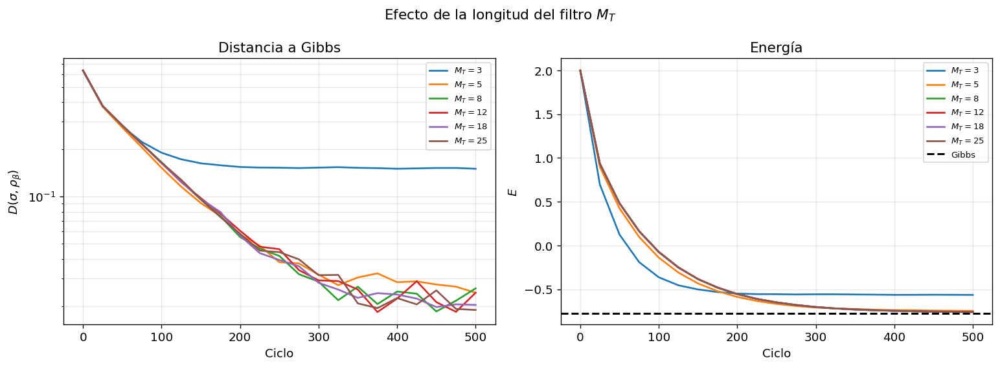

In [28]:
MT_values = [3, 5, 8, 12, 18, 25]

h_MT = 1.0
beta_MT = 2.0
theta_MT = 0.35
delta_MT = 0.30

rho_g_MT = dimer.gibbs_state(beta_MT)
A_MT, _ = build_coupling_ops_paper(dimer)

rows_MT = []
res_MT = {}

for MT in MT_values:
    np.random.seed(42)

    prot_MT = ThermalProtocolSequential(
        dimer,
        A_MT,
        h_bath=h_MT,
        beta=beta_MT,
        theta=theta_MT,
        delta=delta_MT,
        M_T=MT,
        random_order=True,
        random_evolution=True,
    )

    out_MT = prot_MT.run(
        n_cycles=500,
        verbose=False,
        record_every=25,
    )

    rho_f_MT = out_MT["rho_final"]
    res_MT[MT] = out_MT

    rows_MT.append({
        "M_T": MT,
        "n_filter_layers": 2 * MT + 1,
        "D_trace": trace_distance(rho_f_MT, rho_g_MT),
        "E": dimer.energy(rho_f_MT),
        "|ΔE|": abs(dimer.energy(rho_f_MT) - dimer.energy(rho_g_MT)),
        "D_dbl": dimer.avg_double_occupancy(rho_f_MT),
        "|ΔD_dbl|": abs(
            dimer.avg_double_occupancy(rho_f_MT)
            - dimer.avg_double_occupancy(rho_g_MT)
        ),
    })

df_MT = pd.DataFrame(rows_MT)

display(df_MT.round(6))


fig, axes = plt.subplots(1, 2, figsize=(13, 4.8))

for MT, out in res_MT.items():
    axes[0].semilogy(
        out["cycles"],
        out["trace_dist"],
        "-",
        lw=1.6,
        label=f"$M_T={MT}$",
    )

    axes[1].plot(
        out["cycles"],
        out["energies"],
        "-",
        lw=1.6,
        label=f"$M_T={MT}$",
    )

axes[1].axhline(
    dimer.energy(rho_g_MT),
    color="k",
    ls="--",
    label="Gibbs",
)

axes[0].set(
    xlabel="Ciclo",
    ylabel="$D(\\sigma,\\rho_\\beta)$",
    title="Distancia a Gibbs",
)

axes[1].set(
    xlabel="Ciclo",
    ylabel="$E$",
    title="Energía",
)

for ax in axes:
    ax.grid(alpha=0.3, which="both")
    ax.legend(fontsize=8)

plt.suptitle("Efecto de la longitud del filtro $M_T$", fontsize=13)
plt.tight_layout()
plt.show()

### A.4.5 Mapa en $\theta$ y $M_T$

En esta sección estudiamos el punto fijo del protocolo en el dímero Fermi-Hubbard variando la intensidad de acoplo $\theta$ y la longitud del filtro $M_T$.

El objetivo no es simular una trayectoria finita, sino localizar ventanas de parámetros donde el punto fijo del canal queda cerca del Gibbs objetivo. Para interpretar las ventanas usamos como guía la condición de fase

$$
M_T\delta\omega_\star \approx k\pi,
$$

donde $\omega_\star$ es una frecuencia de Bohr dominante ponderada por los operadores de acoplo. Estas líneas son solo guías: el dímero tiene varios gaps relevantes y los mínimos reales pueden desplazarse.

In [44]:
model_regime = make_fh_dimer(t=1.0, U=4.0)
A_ops, labels = build_coupling_ops_paper(model_regime)

omega_ref_fh, df_bohr_fh = dominant_bohr_frequency_fh(model_regime, A_ops)

display(df_bohr_fh.head(10))
print(f"omega_ref dominante FH = {omega_ref_fh:.6f}")

beta_fh = 2.0
h_fh = 1.0
delta_fh = 0.30

theta_grid_fh = [0.03, 0.05, 0.08, 0.12, 0.18, 0.25]
MT_grid_fh = [4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 42, 44, 46, 48, 50, 52]

# Recomendado para FH físico: energía por sitio.
energy_norm_fh = model_regime.n_sites
ylabel_norm_fh = r"N_{sites}"

df_theta_MT_full = compute_theta_MT_map(
    protocol_cls=ThermalProtocolFullBath,
    model=model_regime,
    A_ops=A_ops,
    labels=labels,
    beta=beta_fh,
    h_bath=h_fh,
    delta=delta_fh,
    thetas=theta_grid_fh,
    MTs=MT_grid_fh,
    energy_norm=energy_norm_fh,
)

display(df_theta_MT_full.sort_values("err_E_density").head(10))

,omega,weight
0,1.000000,12.000000
1,2.000000,8.000000
2,0.828427,6.828427
3,5.000000,6.000000
4,3.000000,6.000000
5,0.171573,2.000000
6,3.828427,2.000000
7,1.828427,2.000000
8,5.828427,2.000000
9,4.828427,1.171573


omega_ref dominante FH = 1.000000
M_T = 4
M_T = 6
M_T = 8
M_T = 10
M_T = 12
M_T = 14
M_T = 16
M_T = 18
M_T = 20
M_T = 22
M_T = 24
M_T = 26
M_T = 28
M_T = 30
M_T = 32
M_T = 34
M_T = 36
M_T = 38
M_T = 40
M_T = 42
M_T = 44
M_T = 46
M_T = 48
M_T = 50
M_T = 52
Tiempo total: 11.10 min


,theta,M_T,E_fp,E_g,err_E_density,Dtr,D_avg,D_g
84,0.03,32,-0.775144,-0.775146,8.780681e-07,0.000117,0.015911,0.015912
54,0.03,22,-0.775148,-0.775146,9.426701e-07,0.000104,0.015912,0.015912
55,0.05,22,-0.775151,-0.775146,2.411054e-06,0.000290,0.015913,0.015912
85,0.05,32,-0.775140,-0.775146,2.849839e-06,0.000325,0.015910,0.015912
62,0.08,24,-0.775155,-0.775146,4.418026e-06,0.000623,0.015914,0.015912
57,0.12,22,-0.775155,-0.775146,4.854430e-06,0.001678,0.015917,0.015912
56,0.08,22,-0.775156,-0.775146,4.868821e-06,0.000744,0.015914,0.015912
60,0.03,24,-0.775156,-0.775146,5.092788e-06,0.000087,0.015911,0.015912
39,0.12,16,-0.775157,-0.775146,5.552533e-06,0.001505,0.015954,0.015912
90,0.03,34,-0.775157,-0.775146,5.761744e-06,0.000153,0.015912,0.015912


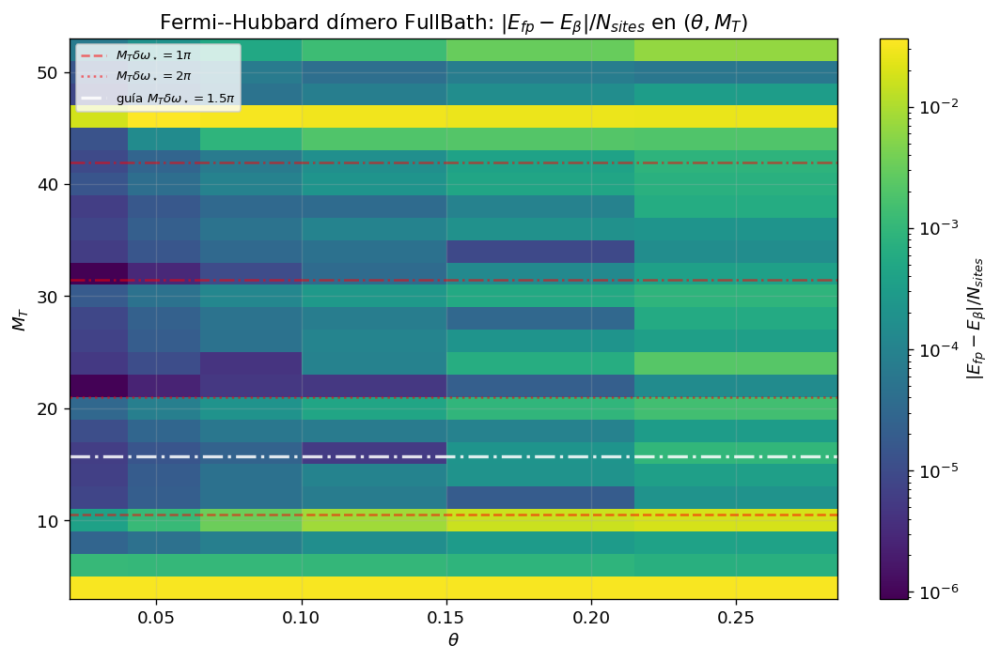

In [45]:
plot_theta_MT_heatmap(
    df_theta_MT_full,
    theta_grid_fh,
    MT_grid_fh,
    title=r"Fermi--Hubbard dímero FullBath: $|E_{fp}-E_\beta|/N_{sites}$ en $(\theta,M_T)$",
    omega_ref=omega_ref_fh,
    delta=delta_fh,
    ylabel_norm=ylabel_norm_fh,
    kmax=4,
)

In [49]:
df_theta_MT_seq = compute_theta_MT_map(
    protocol_cls=ThermalProtocolSequential,
    model=model_regime,
    A_ops=A_ops,
    labels=labels,
    beta=beta_fh,
    h_bath=h_fh,
    delta=delta_fh,
    thetas=theta_grid_fh,
    MTs=MT_grid_fh,
    energy_norm=energy_norm_fh,
)

display(df_theta_MT_seq.sort_values("err_E_density").head(10))

M_T = 4
M_T = 6
M_T = 8
M_T = 10
M_T = 12
M_T = 14
M_T = 16
M_T = 18
M_T = 20
M_T = 22
M_T = 24
M_T = 26
M_T = 28
M_T = 30
M_T = 32
M_T = 34
M_T = 36
M_T = 38
M_T = 40
M_T = 42
M_T = 44
M_T = 46
M_T = 48
M_T = 50
M_T = 52
Tiempo total: 0.94 min


,theta,M_T,E_fp,E_g,err_E_density,Dtr,D_avg,D_g
84,0.03,32,-0.775146,-0.775146,1.471403e-07,0.000082,0.015913,0.015912
85,0.05,32,-0.775146,-0.775146,1.937129e-07,0.000227,0.015914,0.015912
86,0.08,32,-0.775144,-0.775146,8.367572e-07,0.000583,0.015917,0.015912
114,0.03,42,-0.775143,-0.775146,1.176819e-06,0.000068,0.015912,0.015912
48,0.03,20,-0.775151,-0.775146,2.515548e-06,0.000139,0.015912,0.015912
49,0.05,20,-0.775152,-0.775146,3.147479e-06,0.000388,0.015912,0.015912
115,0.05,42,-0.775139,-0.775146,3.515598e-06,0.000190,0.015913,0.015912
132,0.03,48,-0.775154,-0.775146,4.211233e-06,0.000245,0.015915,0.015912
36,0.03,16,-0.775158,-0.775146,5.966441e-06,0.000071,0.015911,0.015912
78,0.03,30,-0.775132,-0.775146,6.714670e-06,0.000827,0.015924,0.015912


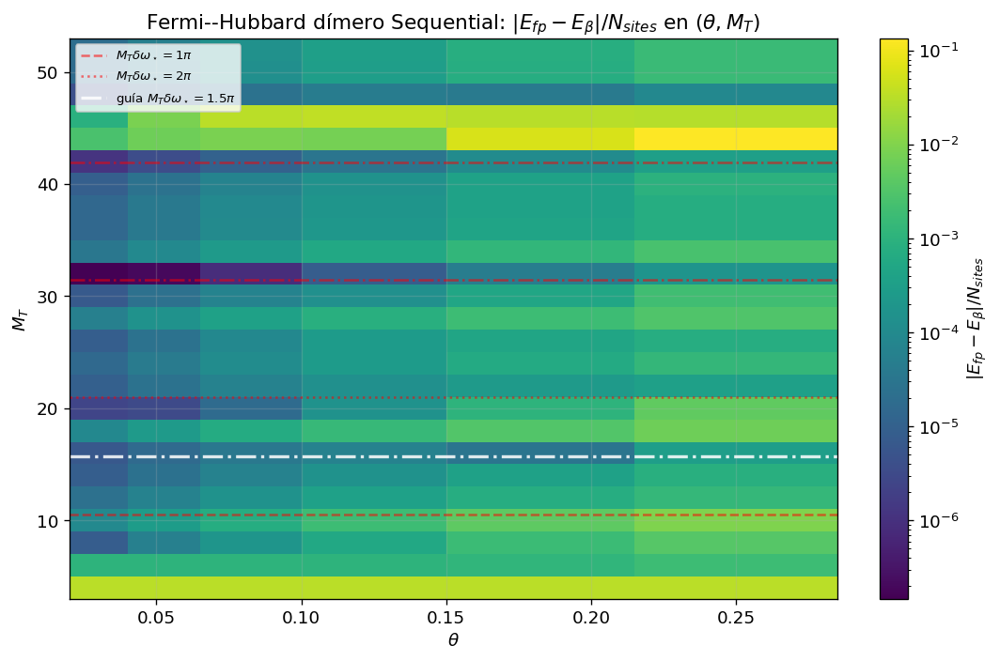

In [50]:
plot_theta_MT_heatmap(
    df_theta_MT_seq,
    theta_grid_fh,
    MT_grid_fh,
    title=r"Fermi--Hubbard dímero Sequential: $|E_{fp}-E_\beta|/N_{sites}$ en $(\theta,M_T)$",
    omega_ref=omega_ref_fh,
    delta=delta_fh,
    ylabel_norm=ylabel_norm_fh,
    kmax=4,
)

#### Refinamiento en $M_T$

Después del mapa grueso, fijamos un valor pequeño de $\theta$ y refinamos el barrido en $M_T$. Esto permite ver con más resolución las ventanas favorables asociadas a la fase acumulada del filtro.

In [51]:
theta_fixed_fh = 0.05
MT_fine_fh = np.arange(4, 56, 2)

rows_fine_full = []

for MT_v in MT_fine_fh:
    out = fixed_point_error_protocol(
        protocol_cls=ThermalProtocolFullBath,
        model=model_regime,
        A_ops=A_ops,
        labels=labels,
        beta=beta_fh,
        h_bath=h_fh,
        theta=theta_fixed_fh,
        delta=delta_fh,
        M_T=int(MT_v),
        energy_norm=energy_norm_fh,
    )
    rows_fine_full.append(out)
    print(f"FullBath MT={MT_v:3d} -> bias={out['err_E_density']:.3e}")

df_fine_full = pd.DataFrame(rows_fine_full)

FullBath MT=  4 -> bias=3.335e-02
FullBath MT=  6 -> bias=1.059e-03
FullBath MT=  8 -> bias=4.426e-05
FullBath MT= 10 -> bias=1.164e-03
FullBath MT= 12 -> bias=2.067e-05
FullBath MT= 14 -> bias=1.834e-05
FullBath MT= 16 -> bias=1.457e-05
FullBath MT= 18 -> bias=2.833e-05
FullBath MT= 20 -> bias=8.415e-05
FullBath MT= 22 -> bias=2.411e-06
FullBath MT= 24 -> bias=1.056e-05
FullBath MT= 26 -> bias=1.958e-05
FullBath MT= 28 -> bias=2.273e-05
FullBath MT= 30 -> bias=4.845e-05
FullBath MT= 32 -> bias=2.850e-06
FullBath MT= 34 -> bias=1.496e-05
FullBath MT= 36 -> bias=2.100e-05
FullBath MT= 38 -> bias=1.552e-05
FullBath MT= 40 -> bias=3.947e-05
FullBath MT= 42 -> bias=2.729e-05
FullBath MT= 44 -> bias=1.428e-04
FullBath MT= 46 -> bias=3.671e-02
FullBath MT= 48 -> bias=2.234e-05
FullBath MT= 50 -> bias=3.891e-05
FullBath MT= 52 -> bias=1.958e-04
FullBath MT= 54 -> bias=1.340e-06


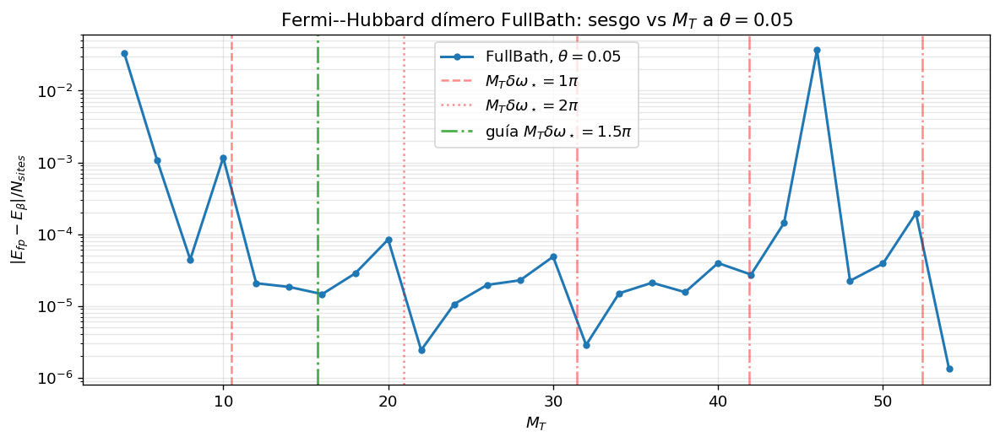

In [52]:
fig, ax = plt.subplots(figsize=(10, 4.5))

ax.semilogy(
    df_fine_full["M_T"],
    df_fine_full["err_E_density"],
    "o-",
    ms=4,
    label=fr"FullBath, $\theta={theta_fixed_fh}$",
)

for k in range(1, 6):
    mt_k = k * np.pi / (delta_fh * omega_ref_fh)

    if k == 1:
        ls = "--"
    elif k == 2:
        ls = ":"
    else:
        ls = "-."

    ax.axvline(
        mt_k,
        color="red",
        ls=ls,
        alpha=0.45,
        lw=1.5,
        label=fr"$M_T\delta\omega_\star={k}\pi$" if k <= 2 else None,
    )

mt_valley_fh = 1.5 * np.pi / (delta_fh * omega_ref_fh)

ax.axvline(
    mt_valley_fh,
    color="tab:green",
    ls="-.",
    alpha=0.8,
    label=fr"guía $M_T\delta\omega_\star=1.5\pi$",
)

ax.set_xlabel(r"$M_T$")
ax.set_ylabel(r"$|E_{fp}-E_\beta|/N_{sites}$")
ax.set_title(
    rf"Fermi--Hubbard dímero FullBath: sesgo vs $M_T$ a $\theta={theta_fixed_fh}$"
)

ax.legend()
ax.grid(alpha=0.3, which="both")
plt.tight_layout()
plt.show()

In [53]:
rows_fine_seq = []

for MT_v in MT_fine_fh:
    out = fixed_point_error_protocol(
        protocol_cls=ThermalProtocolSequential,
        model=model_regime,
        A_ops=A_ops,
        labels=labels,
        beta=beta_fh,
        h_bath=h_fh,
        theta=theta_fixed_fh,
        delta=delta_fh,
        M_T=int(MT_v),
        energy_norm=energy_norm_fh,
    )
    rows_fine_seq.append(out)
    print(f"Sequential MT={MT_v:3d} -> bias={out['err_E_density']:.3e}")

df_fine_seq = pd.DataFrame(rows_fine_seq)

Sequential MT=  4 -> bias=3.330e-02
Sequential MT=  6 -> bias=1.069e-03
Sequential MT=  8 -> bias=5.614e-05
Sequential MT= 10 -> bias=2.749e-04
Sequential MT= 12 -> bias=6.348e-05
Sequential MT= 14 -> bias=2.405e-05
Sequential MT= 16 -> bias=1.588e-05
Sequential MT= 18 -> bias=2.520e-04
Sequential MT= 20 -> bias=3.147e-06
Sequential MT= 22 -> bias=2.569e-05
Sequential MT= 24 -> bias=4.300e-05
Sequential MT= 26 -> bias=2.659e-05
Sequential MT= 28 -> bias=1.499e-04
Sequential MT= 30 -> bias=2.338e-05
Sequential MT= 32 -> bias=1.937e-07
Sequential MT= 34 -> bias=9.474e-05
Sequential MT= 36 -> bias=3.889e-05
Sequential MT= 38 -> bias=3.865e-05
Sequential MT= 40 -> bias=2.538e-05
Sequential MT= 42 -> bias=3.516e-06
Sequential MT= 44 -> bias=6.392e-03
Sequential MT= 46 -> bias=8.746e-03
Sequential MT= 48 -> bias=1.122e-05
Sequential MT= 50 -> bias=5.072e-05
Sequential MT= 52 -> bias=5.553e-05
Sequential MT= 54 -> bias=7.858e-05


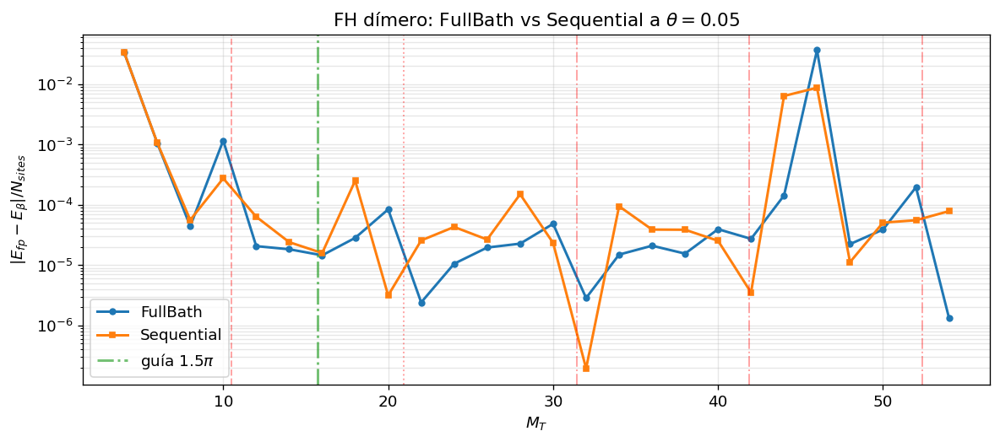

In [54]:
fig, ax = plt.subplots(figsize=(10, 4.5))

ax.semilogy(
    df_fine_full["M_T"],
    df_fine_full["err_E_density"],
    "o-",
    ms=4,
    label="FullBath",
)

ax.semilogy(
    df_fine_seq["M_T"],
    df_fine_seq["err_E_density"],
    "s-",
    ms=4,
    label="Sequential",
)

for k in range(1, 6):
    mt_k = k * np.pi / (delta_fh * omega_ref_fh)

    if k == 1:
        ls = "--"
    elif k == 2:
        ls = ":"
    else:
        ls = "-."

    ax.axvline(
        mt_k,
        color="red",
        ls=ls,
        alpha=0.35,
        lw=1.2,
    )

ax.axvline(
    mt_valley_fh,
    color="tab:green",
    ls="-.",
    alpha=0.65,
    label=fr"guía $1.5\pi$",
)

ax.set_xlabel(r"$M_T$")
ax.set_ylabel(r"$|E_{fp}-E_\beta|/N_{sites}$")
ax.set_title(
    rf"FH dímero: FullBath vs Sequential a $\theta={theta_fixed_fh}$"
)

ax.legend()
ax.grid(alpha=0.3, which="both")
plt.tight_layout()
plt.show()

In [55]:
def best_row(df, name):
    i = df["err_E_density"].idxmin()
    row = df.loc[i].copy()
    return {
        "protocol": name,
        "best_theta": row["theta"],
        "best_M_T": row["M_T"],
        "best_err_E_density": row["err_E_density"],
        "Dtr": row["Dtr"],
        "E_fp": row["E_fp"],
        "E_g": row["E_g"],
        "D_avg": row["D_avg"],
        "D_g": row["D_g"],
    }

df_best = pd.DataFrame([
    best_row(df_theta_MT_full, "FullBath"),
    best_row(df_theta_MT_seq, "Sequential"),
])

display(df_best)

,protocol,best_theta,best_M_T,best_err_E_density,Dtr,E_fp,E_g,D_avg,D_g
0,FullBath,0.03,32.0,8.780681e-07,0.000117,-0.775144,-0.775146,0.015911,0.015912
1,Sequential,0.03,32.0,1.471403e-07,0.000082,-0.775146,-0.775146,0.015913,0.015912


#### Comparación relativa FullBath vs Sequential

Para comparar ambos canales representamos

$$
\log_{10}
\left(
\frac{\mathrm{error}_{seq}}
{\mathrm{error}_{full}}
\right).
$$

Valores negativos indican que Sequential da menor error que FullBath; valores positivos indican que FullBath es mejor. Esta comparación no mide coste de circuito, solo calidad del punto fijo.

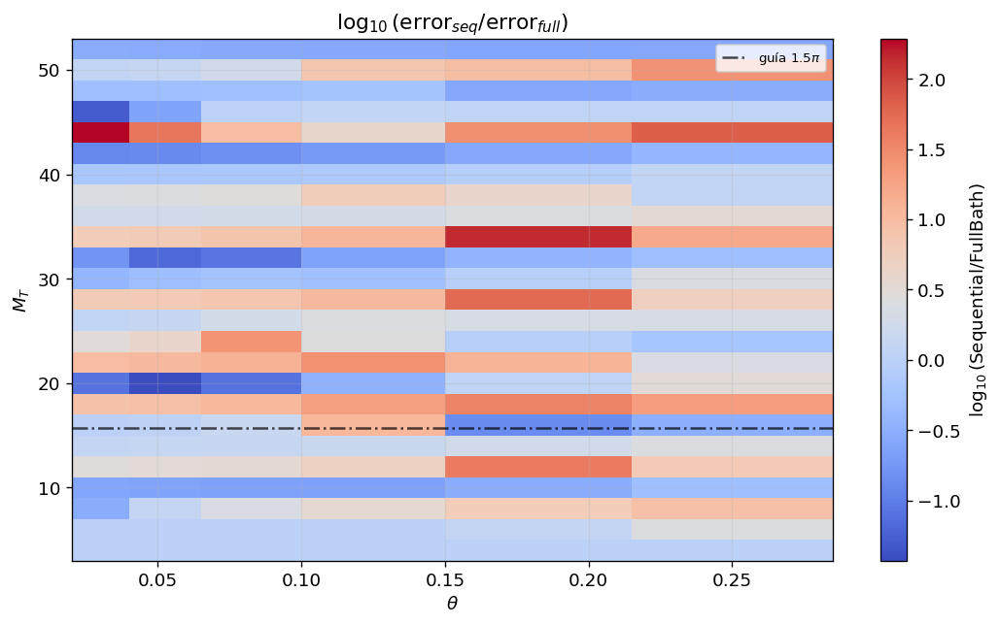

In [56]:
pivot_full = df_theta_MT_full.pivot(
    index="M_T",
    columns="theta",
    values="err_E_density",
)

pivot_seq = df_theta_MT_seq.pivot(
    index="M_T",
    columns="theta",
    values="err_E_density",
)

ratio = pivot_seq / pivot_full
log_ratio = np.log10(ratio)

theta_edges = grid_edges(theta_grid_fh)
MT_edges = grid_edges(MT_grid_fh)

fig, ax = plt.subplots(figsize=(9, 5.5))

im = ax.pcolormesh(
    theta_edges,
    MT_edges,
    log_ratio.loc[MT_grid_fh, theta_grid_fh].values,
    shading="auto",
    cmap="coolwarm",
)

ax.axhline(
    1.5 * np.pi / (delta_fh * omega_ref_fh),
    color="black",
    ls="-.",
    lw=1.5,
    alpha=0.7,
    label=r"guía $1.5\pi$",
)

ax.set_xlabel(r"$\theta$")
ax.set_ylabel(r"$M_T$")
ax.set_title(r"$\log_{10}(\mathrm{error}_{seq}/\mathrm{error}_{full})$")

cbar = plt.colorbar(im, ax=ax)
cbar.set_label(r"$\log_{10}(\mathrm{Sequential}/\mathrm{FullBath})$")

ax.legend(fontsize=8)
plt.tight_layout()
plt.show()

In [ ]:
rho_g = model_regime.gibbs_state(beta_fh)

best_full = df_theta_MT_full.loc[df_theta_MT_full["err_E_density"].idxmin()]
best_seq = df_theta_MT_seq.loc[df_theta_MT_seq["err_E_density"].idxmin()]

rho_full_best = rho_fp_for_point(
    ThermalProtocolFullBath,
    model_regime,
    A_ops,
    labels,
    beta_fh,
    h_fh,
    best_full["theta"],
    delta_fh,
    best_full["M_T"],
)

rho_seq_best = rho_fp_for_point(
    ThermalProtocolSequential,
    model_regime,
    A_ops,
    labels,
    beta_fh,
    h_fh,
    best_seq["theta"],
    delta_fh,
    best_seq["M_T"],
)

df_obs_best = pd.DataFrame([
    model_regime.summary_row(rho_g, label="Gibbs"),
    model_regime.summary_row(rho_full_best, label="FullBath best"),
    model_regime.summary_row(rho_seq_best, label="Sequential best"),
])

df_obs_best["Dtr"] = [
    0.0,
    trace_distance(rho_full_best, rho_g),
    trace_distance(rho_seq_best, rho_g),
]

display(df_obs_best[[
    "label", "E", "K", "U_D", "D_avg", "N", "Sz", "Czz_01", "MI_01", "Dtr"
]])

,label,E,K,U_D,D_avg,N,Sz,Czz_01,MI_01,Dtr
0,Gibbs,-0.775146,-0.902442,0.127296,0.015912,1.298526,-1.665335e-16,-0.035756,0.678845,0.000000
1,FullBath best,-0.775144,-0.902434,0.127290,0.015911,1.298513,-6.272760e-14,-0.035747,0.678835,0.000117
2,Sequential best,-0.775146,-0.902447,0.127301,0.015913,1.298523,5.717629e-05,-0.035755,0.678849,0.000082


Los mapas muestran que el error no depende monótonamente de $M_T$. Esto es coherente con la naturaleza discreta del filtro: al cambiar $M_T\delta$ cambian las fases acumuladas frente a los gaps de Bohr del sistema.

`FullBath` es la versión más fiel al protocolo original, porque acopla todos los baños simultáneamente. `Sequential` reutiliza un baño y aplica los acoplos uno a uno, por lo que cambia el canal efectivo. Aun así, en el dímero reproduce parte de las ventanas favorables y puede alcanzar puntos fijos comparables.

La conclusión práctica es que `Sequential` sirve como proxy numérico barato, pero los resultados principales deben contrastarse con `FullBath`.

### A.4.6 Validación dinámica de candidatos

El punto fijo puede ser muy bueno pero la relajación puede ser lenta. Por eso validamos varios candidatos mediante trayectorias finitas. Comparamos un candidato base, una escala tipo $U$ con $h=4$, y el mejor candidato encontrado en el mapa de puntos fijos.

In [80]:
model_dyn = make_fh_dimer(t=1.0, U=4.0)
A_dyn, labels_dyn = build_coupling_ops_paper(model_dyn)

beta_dyn = 2.0
rho_g_dyn = model_dyn.gibbs_state(beta_dyn)

# Si existe df_theta_MT_full de los heatmaps, usamos su mejor punto.
# Si no existe, usamos un candidato razonable.
try:
    best_dyn = df_theta_MT_full.loc[df_theta_MT_full["err_E_density"].idxmin()]
    best_theta_dyn = float(best_dyn["theta"])
    best_MT_dyn = int(best_dyn["M_T"])
except NameError:
    best_theta_dyn = 0.05
    best_MT_dyn = 22

candidates_dyn = [
    {
        "label": "base h=1, theta=0.35",
        "protocol_cls": ThermalProtocolFullBath,
        "h_bath": 1.0,
        "theta": 0.35,
        "delta": 0.30,
        "M_T": 12,
        "random": True,
        "seed": 101,
    },
    {
        "label": "escala tipo U, h=4",
        "protocol_cls": ThermalProtocolFullBath,
        "h_bath": 4.0,
        "theta": 0.35,
        "delta": 0.30,
        "M_T": 12,
        "random": True,
        "seed": 202,
    },
    {
        "label": "mejor candidato determinista",
        "protocol_cls": ThermalProtocolFullBath,
        "h_bath": 1.0,
        "theta": best_theta_dyn,
        "delta": 0.30,
        "M_T": best_MT_dyn,
        "random": False,
        "seed": 303,
    },
]

rows_dyn = []
outs_dyn = {}

for cand in candidates_dyn:
    out, proto = protocol_run(
        cand["protocol_cls"],
        model_dyn,
        A_dyn,
        labels_dyn,
        beta=beta_dyn,
        h_bath=cand["h_bath"],
        theta=cand["theta"],
        delta=cand["delta"],
        M_T=cand["M_T"],
        n_cycles=500,
        seed=cand["seed"],
        record_every=25,
        random=cand["random"],
    )

    outs_dyn[cand["label"]] = out

    rows_dyn.append({
        "label": cand["label"],
        "h_bath": cand["h_bath"],
        "theta": cand["theta"],
        "M_T": cand["M_T"],
        "random": cand["random"],
        "Dtr_final": out["trace_dist"][-1],
        "E_final": out["energies"][-1],
        "Delta_E_final": out["energies"][-1] - model_dyn.energy(rho_g_dyn),
    })

df_dyn_candidates = pd.DataFrame(rows_dyn)
display(df_dyn_candidates)

,label,h_bath,theta,M_T,random,Dtr_final,E_final,Delta_E_final
0,"base h=1, theta=0.35",1.0,0.35,12,True,0.018772,-0.766444,0.008702
1,"escala tipo U, h=4",4.0,0.35,12,True,0.022475,-0.766096,0.009050
2,mejor candidato determinista,1.0,0.03,32,False,0.536029,1.680781,2.455927


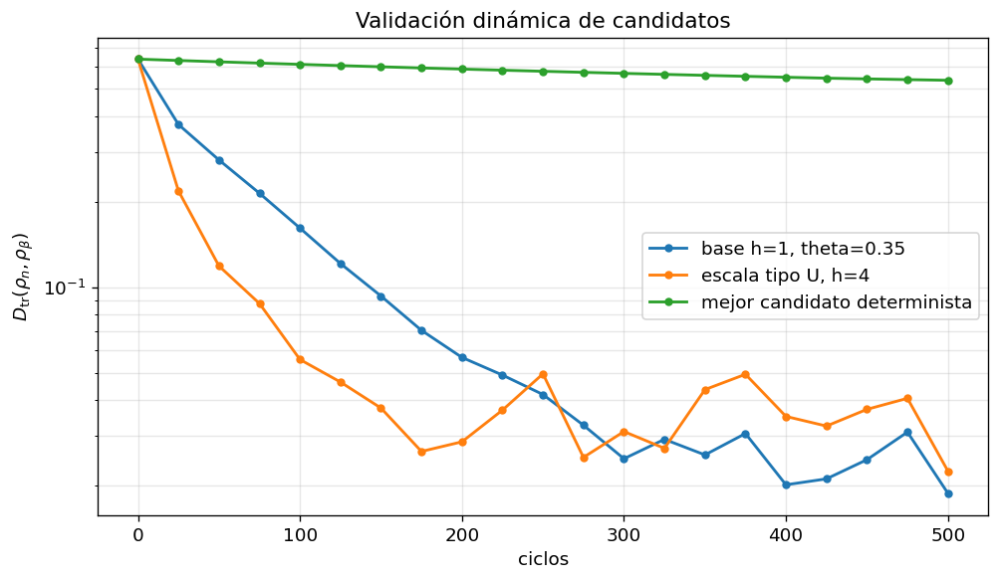

In [81]:
fig, ax = plt.subplots(figsize=(8.5, 5))

for label, out in outs_dyn.items():
    ax.semilogy(
        out["cycles"],
        out["trace_dist"],
        "o-",
        ms=4,
        lw=1.7,
        label=label,
    )

ax.set_xlabel("ciclos")
ax.set_ylabel(r"$D_{\rm tr}(\rho_n,\rho_\beta)$")
ax.set_title("Validación dinámica de candidatos")
ax.grid(alpha=0.3, which="both")
ax.legend()

plt.tight_layout()
plt.show()

## A.5 Resonancias, randomización y rewind

Aquí estudiamos efectos dinámicos del canal, no nueva física del Hamiltoniano.

Como el protocolo usa un filtro temporal discreto, el resultado puede depender de dos escalas:

- $h$, que selecciona qué transiciones de Bohr acopla mejor el baño;
- $M_T\delta$, que fija el tiempo efectivo de la ventana del filtro.

La randomización se usa para reducir sensibilidad a resonancias discretas y fases coherentes, no como garantía de mejora en todos los parámetros.

### A.5.1 Espectro y filtro

Para interpretar la elección del splitting del baño $h$, comparamos el filtro efectivo del protocolo con las frecuencias de Bohr del dímero Fermi-Hubbard.

Este análisis no depende de si después usamos `ThermalProtocolFullBath` o `ThermalProtocolSequential`. Solo depende de:

1. el Hamiltoniano del sistema $H_{\rm FH}$,
2. los operadores de acoplo $A_\mu$,
3. la temperatura inversa $\beta$.

Usamos los acoplos tipo Paper,

$$
A_\mu = \frac{Z_\mu + Y_\mu}{\sqrt{2}},
$$

y pesamos cada transición por

$$
w_{n\to m}
=
p_n
\sum_\mu
|\langle m|A_\mu|n\rangle|^2,
\qquad
p_n=
\frac{e^{-\beta E_n}}{Z}.
$$

Representamos las frecuencias positivas $|\omega|=|E_m-E_n|$ y comparamos su peso efectivo con filtros gaussianos centrados en distintos valores de $h$.

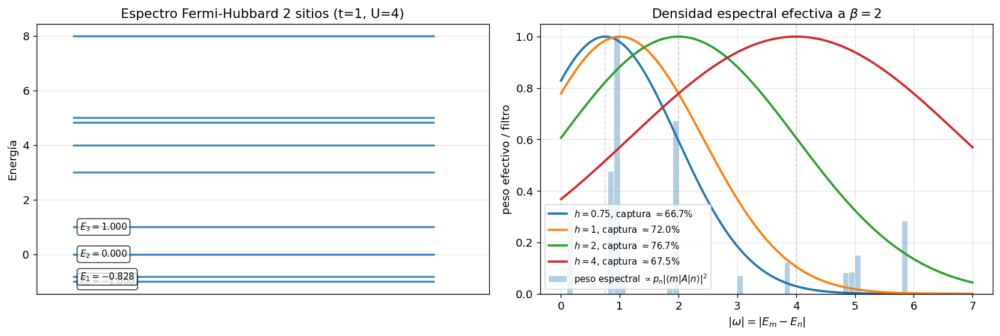

Fracción del peso espectral capturada por cada filtro:


,h,a=sqrt(4h/beta),fracción capturada
0,0.75,1.224745,0.667256
1,1.00,1.414214,0.719852
2,2.00,2.000000,0.767254
3,4.00,2.828427,0.675481


Transiciones espectrales dominantes:


,n inicial,m final,E_n,E_m,omega,|omega|,p_n,matrix_weight,peso,peso_normalizado
0,2,4,-0.828427,0.000000,0.828427,0.828427,0.215779,1.707107,0.368358,0.117556
1,0,8,-1.000000,1.000000,2.000000,2.000000,0.304114,1.000000,0.304114,0.097053
2,1,7,-1.000000,1.000000,2.000000,2.000000,0.304114,1.000000,0.304114,0.097053
3,0,6,-1.000000,0.000000,1.000000,1.000000,0.304114,0.500000,0.152057,0.048526
4,0,3,-1.000000,0.000000,1.000000,1.000000,0.304114,0.500000,0.152057,0.048526
5,1,3,-1.000000,0.000000,1.000000,1.000000,0.304114,0.500000,0.152057,0.048526
6,1,5,-1.000000,0.000000,1.000000,1.000000,0.304114,0.500000,0.152057,0.048526
7,0,11,-1.000000,4.000000,5.000000,5.000000,0.304114,0.250000,0.076028,0.024263
8,0,12,-1.000000,4.828427,5.828427,5.828427,0.304114,0.250000,0.076028,0.024263
9,1,2,-1.000000,-0.828427,0.171573,0.171573,0.304114,0.250000,0.076028,0.024263


In [41]:
# ============================================================
# A.5.1 — Espectro y filtros del dímero Fermi-Hubbard
# ============================================================

fh_spec_model = FermiHubbardJW(
    n_sites=2,
    bonds=[(0, 1)],
    t=1.0,
    U=4.0,
)

beta_spec = 2.0

A_spec, labels_spec = build_coupling_ops_paper(fh_spec_model)

h_values_spec = [
    0.75,
    1.0,
    2.0,
    4.0,
]

spec_fh = fh_spectral_data(
    model=fh_spec_model,
    A_ops=A_spec,
    beta=beta_spec,
)

fh_plot_spectrum_and_filters(
    model=fh_spec_model,
    spec=spec_fh,
    beta=beta_spec,
    h_values=h_values_spec,
    bins=70,
    w_max=7.0,
)

print("Fracción del peso espectral capturada por cada filtro:")
display(
    fh_spectral_capture_table(
        spec=spec_fh,
        h_values=h_values_spec,
        beta=beta_spec,
    ).round(6)
)

print("Transiciones espectrales dominantes:")
display(
    fh_top_spectral_transitions(
        spec=spec_fh,
        k=20,
    ).round(6)
)

La densidad espectral ponderada indica qué gaps de Bohr tienen más peso para los operadores de acoplo tipo Paper.

Por eso $h=U=4$ no tiene por qué ser óptimo: el baño debe acoplar transiciones relevantes del canal, no simplemente la mayor escala energética del Hamiltoniano. En el dímero, valores de $h$ de orden $t$ pueden ser más efectivos.

### A.5.2 Resonancias discretas en $M_T\delta$

Barrenos el tiempo efectivo del filtro,

$$
T = M_T\delta,
$$

y comparamos el protocolo determinista con el randomizado.

En Fermi-Hubbard hay varios gaps de Bohr relevantes, así que no esperamos una única resonancia limpia, sino una sensibilidad irregular a ciertos valores discretos de $M_T\delta$.

Medimos energía final, coherencia en la base de energía y distancia traza al Gibbs exacto.

,modo,M_T,T_eff,E_mean,E_std,coh_mean,coh_std,D_mean,D_std
0,OFF,5,1.0,-0.472008,0.000000,0.020413,0.000000,0.155637,0.000000
1,OFF,7,1.4,-0.380384,0.000000,0.014940,0.000000,0.105084,0.000000
2,OFF,9,1.8,-0.298143,0.000000,0.012455,0.000000,0.112477,0.000000
3,OFF,12,2.4,-0.272389,0.000000,0.011771,0.000000,0.119966,0.000000
4,OFF,15,3.0,-0.267313,0.000000,0.027138,0.000000,0.118681,0.000000
5,OFF,18,3.6,-0.284416,0.000000,0.014513,0.000000,0.115262,0.000000
6,OFF,22,4.4,-0.281935,0.000000,0.015229,0.000000,0.115777,0.000000
7,OFF,27,5.4,-0.258487,0.000000,0.084706,0.000000,0.161192,0.000000
8,OFF,32,6.4,-0.257957,0.000000,0.011611,0.000000,0.121432,0.000000
9,OFF,38,7.6,-0.276303,0.000000,0.016325,0.000000,0.117128,0.000000


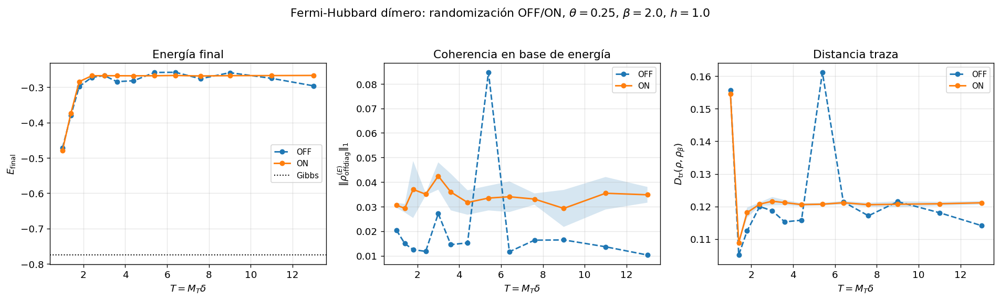

In [ ]:
# ============================================================
# A.5.2 — Resonancias: randomización OFF vs ON
# ============================================================

# ------------------------------------------------------------
# Modelo y parámetros base
# ------------------------------------------------------------

dimer_a5 = FermiHubbardJW(
    n_sites=2,
    bonds=[(0, 1)],
    t=1.0,
    U=4.0,
)

A_paper_a5, labels_paper_a5 = build_coupling_ops_paper(dimer_a5)

beta_a5 = 2.0
h_a5 = 1.0
theta_a5 = 0.25
delta_a5 = 0.20
n_cycles_a5 = 250

rho_g_a5 = dimer_a5.gibbs_state(beta_a5)
E_g_a5 = dimer_a5.energy(rho_g_a5)

ProtocolSeq = (
    globals().get("ThermalProtocolSequential")
    or globals().get("ThermalProtocolSequentialBath")
    or globals().get("ThermalProtocol")
)


def project_dm_fh(rho, tol=1e-14):
    """Hermitiza, elimina autovalores negativos numéricos y normaliza."""
    rho = 0.5 * (rho + rho.conj().T)
    vals, vecs = np.linalg.eigh(rho)
    vals = np.clip(np.real(vals), 0.0, None)

    if vals.sum() < tol:
        return np.eye(rho.shape[0], dtype=complex) / rho.shape[0]

    rho = (vecs * vals) @ vecs.conj().T
    rho = rho / np.trace(rho)
    return 0.5 * (rho + rho.conj().T)


def coherence_energy_basis_fh(rho, model):
    """
    Norma 1 de la parte off-diagonal de rho en la base propia de H.
    """
    evals, evecs = model.eigensystem()
    idx = np.argsort(np.real(evals))
    V = evecs[:, idx]

    rho_E = V.conj().T @ rho @ V
    rho_off = rho_E - np.diag(np.diag(rho_E))

    return float(np.sum(np.linalg.svd(rho_off, compute_uv=False)))


def run_fh_seq_case(
    M_T,
    randomize=False,
    rewind=False,
    beta=beta_a5,
    h_bath=h_a5,
    theta=theta_a5,
    delta=delta_a5,
    n_cycles=n_cycles_a5,
    seed=42,
    record_every=None,
):
    """
    Protocolo secuencial usado en el notebook.

    randomize=True:
        random_order=True y random_evolution=True.

    rewind=True:
        aplica U_S^{-(2M_T+1)} después de cada ciclo.
        Es un diagnóstico comparativo, no el protocolo principal.
    """
    np.random.seed(seed)

    prot = ProtocolSeq(
        dimer_a5,
        A_paper_a5,
        h_bath=h_bath,
        beta=beta,
        theta=theta,
        delta=delta,
        M_T=int(M_T),
        random_order=randomize,
        random_evolution=randomize,
    )

    rho = np.eye(dimer_a5.dim, dtype=complex) / dimer_a5.dim

    if record_every is None:
        record_every = max(1, n_cycles // 25)

    U_rewind = expm(
        +1j * delta * (2 * int(M_T) + 1) * dimer_a5.H
    )

    rows = []

    def record(n, rho_now):
        rows.append({
            "cycle": n,
            "D_trace": trace_distance(rho_now, rho_g_a5),
            "E": dimer_a5.energy(rho_now),
            "|ΔE|": abs(dimer_a5.energy(rho_now) - E_g_a5),
            "coh_E": coherence_energy_basis_fh(rho_now, dimer_a5),
            "D_dbl": dimer_a5.avg_double_occupancy(rho_now),
            "Czz": dimer_a5.spin_correlation(rho_now, 0, 1),
        })

    record(0, rho)

    for n in range(1, n_cycles + 1):
        rho = prot.apply_channel(rho)

        if rewind:
            rho = U_rewind @ rho @ U_rewind.conj().T

        rho = project_dm_fh(rho)

        if n % record_every == 0 or n == n_cycles:
            record(n, rho)

    return {
        "rho_final": rho,
        "history": pd.DataFrame(rows),
        "metadata": {
            "M_T": int(M_T),
            "T_eff": float(M_T * delta),
            "randomize": bool(randomize),
            "rewind": bool(rewind),
            "theta": float(theta),
            "delta": float(delta),
            "beta": float(beta),
            "h_bath": float(h_bath),
        }
    }


# ------------------------------------------------------------
# Barrido en M_T
# ------------------------------------------------------------

MT_grid_a52 = np.array([5, 7, 9, 12, 15, 18, 22, 27, 32, 38, 45, 55, 65])
seeds_on = [101, 202, 303]

rows_a52 = []

for MT in MT_grid_a52:
    # OFF determinista
    out_off = run_fh_seq_case(
        M_T=MT,
        randomize=False,
        rewind=False,
        seed=42,
    )

    h_off = out_off["history"].iloc[-1]

    rows_a52.append({
        "modo": "OFF",
        "M_T": int(MT),
        "T_eff": MT * delta_a5,
        "seed": 42,
        "E": h_off["E"],
        "coh_E": h_off["coh_E"],
        "D_trace": h_off["D_trace"],
    })

    # ON randomizado: promedio sobre semillas
    for sd in seeds_on:
        out_on = run_fh_seq_case(
            M_T=MT,
            randomize=True,
            rewind=False,
            seed=sd,
        )

        h_on = out_on["history"].iloc[-1]

        rows_a52.append({
            "modo": "ON",
            "M_T": int(MT),
            "T_eff": MT * delta_a5,
            "seed": sd,
            "E": h_on["E"],
            "coh_E": h_on["coh_E"],
            "D_trace": h_on["D_trace"],
        })

df_a52_raw = pd.DataFrame(rows_a52)

df_a52 = (
    df_a52_raw
    .groupby(["modo", "M_T", "T_eff"], as_index=False)
    .agg(
        E_mean=("E", "mean"),
        E_std=("E", "std"),
        coh_mean=("coh_E", "mean"),
        coh_std=("coh_E", "std"),
        D_mean=("D_trace", "mean"),
        D_std=("D_trace", "std"),
    )
    .fillna(0.0)
)

display(df_a52.round(6))


# ------------------------------------------------------------
# Figura tipo Fig. 2b-like
# ------------------------------------------------------------

fig, axes = plt.subplots(1, 3, figsize=(16, 4.6))

plot_specs = [
    ("E_mean", "E_std", r"$E_{\rm final}$", "Energía final"),
    ("coh_mean", "coh_std", r"$\|\rho_{\rm offdiag}^{(E)}\|_1$", "Coherencia en base de energía"),
    ("D_mean", "D_std", r"$D_{\rm tr}(\rho,\rho_\beta)$", "Distancia traza"),
]

for ax, (mean_col, std_col, ylabel, title) in zip(axes, plot_specs):
    for modo, style in [("OFF", "o--"), ("ON", "o-")]:
        sub = df_a52[df_a52["modo"] == modo]

        ax.plot(
            sub["T_eff"],
            sub[mean_col],
            style,
            ms=5,
            lw=1.7,
            label=modo,
        )

        if modo == "ON":
            ax.fill_between(
                sub["T_eff"],
                sub[mean_col] - sub[std_col],
                sub[mean_col] + sub[std_col],
                alpha=0.18,
            )

    if mean_col == "E_mean":
        ax.axhline(E_g_a5, color="black", ls=":", lw=1.2, label="Gibbs")

    ax.set_xlabel(r"$T=M_T\delta$")
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    ax.grid(alpha=0.3)

axes[0].legend(fontsize=9)
axes[1].legend(fontsize=9)
axes[2].legend(fontsize=9)

plt.suptitle(
    rf"Fermi-Hubbard dímero: randomización OFF/ON, "
    rf"$\theta={theta_a5}$, $\beta={beta_a5}$, $h={h_a5}$",
    y=1.03,
)

plt.tight_layout()
plt.show()

 La dependencia con $M_T\delta$ no es monótona. Algunos valores producen picos de error, coherencia residual o sesgo energético, lo que indica interferencias del canal discreto.

Como guía, si una transición de Bohr tiene gap $\Delta$, pueden aparecer huellas cerca de

$$
M_T\delta \sim \frac{2\pi n}{\Delta}.
$$

Para el dímero con $U=4$, aparecen escalas relevantes alrededor de $\Delta\approx 0.828$ y $\Delta\approx 1$. Esto sugiere posibles estructuras cerca de

$$
M_T\delta \sim 7.6
\qquad
\text{y}
\qquad
M_T\delta \sim 6.3.
$$

Estas líneas no predicen exactamente el mínimo o máximo del error, porque el canal combina muchas transiciones y varios operadores $A_\mu$. Sirven solo como guía para interpretar por qué ciertos tiempos discretos son peores que otros.

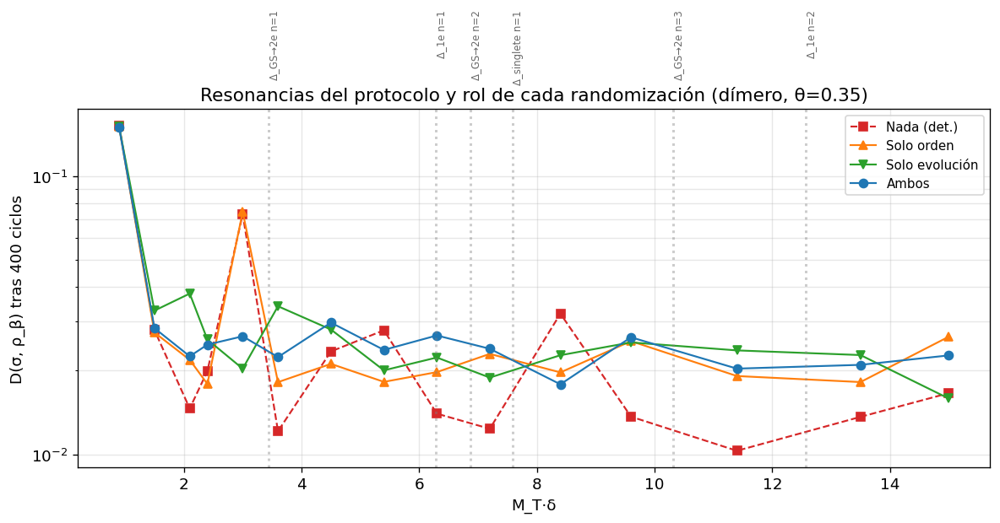

Rango de variación (max/min) por configuración:
  Nada (det.)         : 0.0103 – 0.1527  (factor 14.8×)
  Solo orden          : 0.0179 – 0.1512  (factor 8.4×)
  Solo evolución      : 0.0159 – 0.1511  (factor 9.5×)
  Ambos               : 0.0179 – 0.1505  (factor 8.4×)


In [47]:
dimer_a = FermiHubbardJW(2, [(0,1)], 1.0, 4.0)
A_p, _ = build_coupling_ops_paper(dimer_a)

M_T_grid = np.array([3, 5, 7, 8, 10, 12, 15, 18, 21, 24, 28, 32, 38, 45, 50])
T_axis = M_T_grid * 0.3

configs_M = [
    ('Nada (det.)',    False, False, 'tab:red',    's--'),
    ('Solo orden',     True,  False, 'tab:orange', '^-'),
    ('Solo evolución', False, True,  'tab:green',  'v-'),
    ('Ambos',          True,  True,  'tab:blue',   'o-'),
]

results_M = {lab: [] for lab,_,_,_,_ in configs_M}
for MT in M_T_grid:
    for lab, ro, re_, _, _ in configs_M:
        np.random.seed(42)
        p = ThermalProtocolSequential(dimer_a, A_p, h_bath=1.0, beta=2.0, theta=0.35,
                            delta=0.3, M_T=int(MT),
                            random_order=ro, random_evolution=re_)
        results_M[lab].append(p.run(400, verbose=False)['trace_dist'][-1])

fig, ax = plt.subplots(figsize=(10, 5.5))
for lab, _, _, c, ms in configs_M:
    ax.plot(T_axis, results_M[lab], ms, color=c, ms=6, lw=1.3, label=lab)

gaps_relevantes = [(1.828, 'Δ_GS→2e'), (1.0, 'Δ_1e'), (0.828, 'Δ_singlete')]
for Delta, lab in gaps_relevantes:
    for n in [1, 2, 3]:
        T_res = 2*np.pi*n/Delta
        if T_axis[0] <= T_res <= T_axis[-1]:
            ax.axvline(T_res, color='gray', ls=':', alpha=.4)
            ax.text(T_res, 0.4, f'{lab} n={n}', rotation=90,
                    fontsize=7, alpha=.6, va='top')

ax.set(xlabel='M_T·δ', ylabel='D(σ, ρ_β) tras 400 ciclos', yscale='log',
       title='Resonancias del protocolo y rol de cada randomización (dímero, θ=0.35)')
ax.legend(fontsize=9, loc='upper right'); ax.grid(alpha=.3, which='both')
plt.tight_layout(); plt.show()

print("Rango de variación (max/min) por configuración:")
for lab, _, _, _, _ in configs_M:
    arr = np.array(results_M[lab])
    print(f"  {lab:20s}: {arr.min():.4f} – {arr.max():.4f}  (factor {arr.max()/arr.min():.1f}×)")

Comparamos cuatro variantes del protocolo secuencial:

- `Nada`: orden fijo de operadores y evolución determinista.
- `Solo orden`: se cambia aleatoriamente el orden de aplicación de los operadores $A_\mu$ en cada ciclo.
- `Solo evolución`: se mantiene el orden, pero se randomiza la evolución libre, rompiendo fases coherentes entre ciclos.
- `Ambos`: se randomizan las dos cosas.

La randomización no busca necesariamente mejorar el mejor punto, sino suavizar la dependencia con $M_T\delta$. En la figura, el protocolo determinista puede ser el mejor en algunos valores concretos, pero también muestra picos de fallo. Las variantes randomizadas tienden a ser más regulares, aunque no siempre alcanzan la menor distancia final.

Las líneas verticales indican tiempos compatibles con gaps de Bohr relevantes. No predicen exactamente los máximos o mínimos, pero ayudan a interpretar por qué algunos valores de $M_T\delta$ son más sensibles que otros.

### A.5.3 Papel de la randomización

Comparamos cuatro variantes del protocolo secuencial:

- sin randomización;
- randomización solo del orden de los operadores $A_\mu$;
- randomización solo de la evolución libre;
- ambas randomizaciones.

El objetivo es ver si la randomización cambia la convergencia hacia Gibbs y si reduce la sensibilidad a fases coherentes del canal discreto. Repetimos la comparación para varios valores de $\theta$, porque la intensidad de acoplo controla cuánto perturba cada ciclo al sistema.

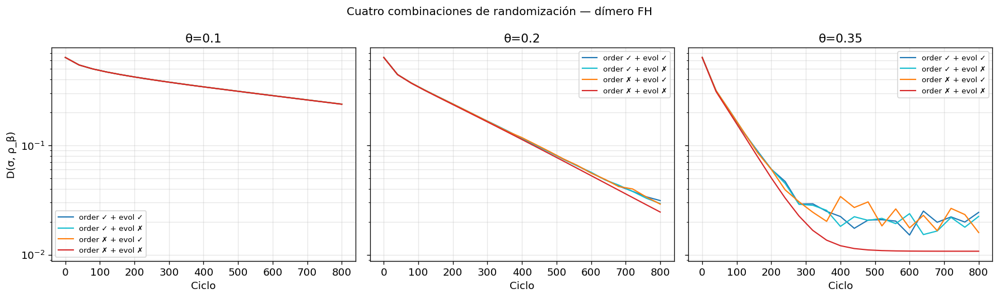

In [48]:
dimer_a = FermiHubbardJW(2, [(0,1)], 1.0, 4.0)
A_p, _ = build_coupling_ops_paper(dimer_a)

configs = [
    ('order ✓ + evol ✓', True,  True,  'tab:blue'),
    ('order ✓ + evol ✗', True,  False, 'tab:cyan'),
    ('order ✗ + evol ✓', False, True,  'tab:orange'),
    ('order ✗ + evol ✗', False, False, 'tab:red'),
]
fig, axes = plt.subplots(1, 3, figsize=(15, 4.5), sharey=True)
for ax, th in zip(axes, [0.10, 0.20, 0.35]):
    for lab, ro, re_, c in configs:
        np.random.seed(42)
        p = ThermalProtocolSequential(dimer_a, A_p, h_bath=1.0, beta=2.0, theta=th,
                            delta=0.3, M_T=12,
                            random_order=ro, random_evolution=re_)
        r = p.run(800, verbose=False)
        ax.semilogy(r['cycles'], r['trace_dist'], '-', color=c, lw=1.3, label=lab)
    ax.set(xlabel='Ciclo', title=f'θ={th}'); ax.grid(alpha=.3, which='both')
    ax.legend(fontsize=8)
axes[0].set_ylabel('D(σ, ρ_β)')
plt.suptitle('Cuatro combinaciones de randomización — dímero FH', fontsize=12)
plt.tight_layout(); plt.show()

En este barrido la randomización no mejora necesariamente el mejor caso determinista. Su efecto principal es reducir la sensibilidad fina a resonancias del protocolo discreto.

Cuando el valor de $M_T\delta$ está bien elegido, el canal determinista puede alcanzar menor distancia al Gibbs. En cambio, cerca de puntos resonantes, randomizar el orden o la evolución puede suavizar picos de error.

Por tanto, no usamos la randomización como receta universal, sino como diagnóstico de robustez frente a interferencias coherentes del canal.

### A.5.4. Randomización y rewind

Aquí no comparamos estados transitorios, sino el régimen estacionario. Para las variantes deterministas usamos el punto fijo exacto del canal. Para las variantes con randomización usamos un promedio de trayectoria después de un burn-in.

El objetivo no es optimizar el protocolo, sino comprobar si la randomización ayuda a estabilizar el punto fijo y si el rewind mejora o deforma los observables en el dímero Fermi--Hubbard.

In [38]:
model = make_fh_dimer(t=1.0, U=4.0)
A_ops, labels = build_coupling_ops_paper(model)

beta = 2.0
h_bath = 1.0
theta = 0.35
delta = 0.30
M_T = 12

rho_g = model.gibbs_state(beta)

proto = fullbath_proto_base(
    model,
    A_ops,
    labels,
    beta=beta,
    h_bath=h_bath,
    theta=theta,
    delta=delta,
    M_T=M_T,
)

Q_no = fullbath_Q_variant(proto, use_rewind=False)
Q_rw = fullbath_Q_variant(proto, use_rewind=True)

rho_no = fullbath_fixed_point_from_Q(proto, Q_no)
rho_rw = fullbath_fixed_point_from_Q(proto, Q_rw)

rho_rand_list = []
rho_both_list = []

for seed in [101, 202, 303, 404, 505]:
    rho_rand_list.append(
        run_fullbath_random_stationary(
            proto,
            use_rewind=False,
            n_cycles=700,
            burn=450,
            keep=120,
            seed=seed,
        )
    )

    rho_both_list.append(
        run_fullbath_random_stationary(
            proto,
            use_rewind=True,
            n_cycles=700,
            burn=450,
            keep=120,
            seed=seed,
        )
    )

rho_rand = project_density(np.mean(rho_rand_list, axis=0))
rho_both = project_density(np.mean(rho_both_list, axis=0))

variants = {
    "Gibbs": rho_g,
    "sin nada": rho_no,
    "solo random": rho_rand,
    "solo rewind": rho_rw,
    "ambos": rho_both,
}

In [39]:
def variant_row(model, rho, rho_g, label):
    row = model.summary_row(rho, label=label)

    row["E_g"] = model.energy(rho_g)
    row["Delta_E"] = row["E"] - row["E_g"]
    row["abs_Delta_E"] = abs(row["Delta_E"])

    row["Dtr"] = trace_distance(rho, rho_g)

    row["D_avg_g"] = model.avg_double_occupancy(rho_g)
    row["Delta_D"] = row["D_avg"] - row["D_avg_g"]
    row["abs_Delta_D"] = abs(row["Delta_D"])

    row["Czz_01_g"] = model.spin_correlation(rho_g, 0, 1)
    row["Delta_Czz_01"] = row["Czz_01"] - row["Czz_01_g"]
    row["abs_Delta_Czz_01"] = abs(row["Delta_Czz_01"])

    row["MI_01_g"] = model.site_mutual_information(rho_g, 0, 1)
    row["Delta_MI_01"] = row["MI_01"] - row["MI_01_g"]
    row["abs_Delta_MI_01"] = abs(row["Delta_MI_01"])

    return row


df_rewind = pd.DataFrame([
    variant_row(model, rho, rho_g, label)
    for label, rho in variants.items()
])

display(df_rewind[[
    "label",
    "E", "E_g", "Delta_E", "abs_Delta_E", "Dtr",
    "D_avg", "D_avg_g", "Delta_D",
    "Czz_01", "Czz_01_g", "Delta_Czz_01",
    "MI_01", "MI_01_g", "Delta_MI_01",
]])

,label,E,E_g,Delta_E,abs_Delta_E,Dtr,D_avg,D_avg_g,Delta_D,Czz_01,Czz_01_g,Delta_Czz_01,MI_01,MI_01_g,Delta_MI_01
0,Gibbs,-0.775146,-0.775146,0.000000,0.000000,0.000000,0.015912,0.015912,0.000000,-0.035756,-0.035756,0.000000,0.678845,0.678845,0.000000
1,sin nada,-0.773677,-0.775146,0.001468,0.001468,0.015404,0.016237,0.015912,0.000325,-0.035659,-0.035756,0.000097,0.678841,0.678845,-0.000004
2,solo random,-0.766342,-0.775146,0.008804,0.008804,0.005487,0.016973,0.015912,0.001061,-0.034756,-0.035756,0.000999,0.671395,0.678845,-0.007450
3,solo rewind,-0.684779,-0.775146,0.090366,0.090366,0.165043,0.024765,0.015912,0.008853,-0.035234,-0.035756,0.000521,0.679582,0.678845,0.000737
4,ambos,-0.766106,-0.775146,0.009040,0.009040,0.006253,0.016966,0.015912,0.001055,-0.034729,-0.035756,0.001027,0.670851,0.678845,-0.007994


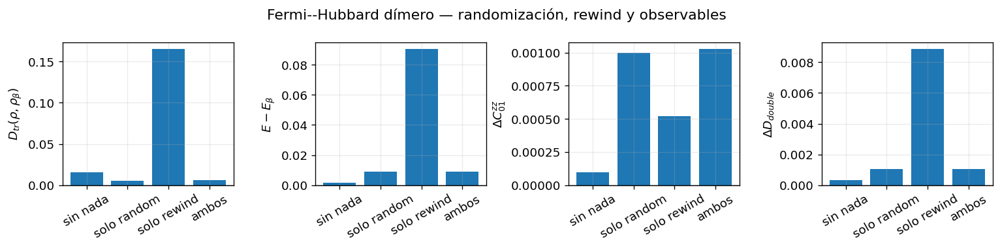

In [40]:
df_plot = df_rewind[df_rewind["label"] != "Gibbs"].copy()

fig, axes = plt.subplots(1, 4, figsize=(13, 3.2))

cols = [
    ("Dtr", "$D_{tr}(\\rho,\\rho_\\beta)$"),
    ("Delta_E", "$E - E_\\beta$"),
    ("Delta_Czz_01", "$\\Delta C^{zz}_{01}$"),
    ("Delta_D", "$\\Delta D_{double}$"),
]

for ax, (col, ylabel) in zip(axes, cols):
    ax.bar(df_plot["label"], df_plot[col])
    ax.axhline(0, color="black", lw=0.8)
    ax.set_ylabel(ylabel)
    ax.tick_params(axis="x", rotation=30)
    ax.grid(alpha=0.25, axis="y")

fig.suptitle("Fermi--Hubbard dímero — randomización, rewind y observables")
plt.tight_layout()
plt.show()

### A.5.5 Sequential: randomización y rewind

En el protocolo `Sequential`, los operadores $A_\mu$ se aplican uno a uno reutilizando un único qubit de baño. Por eso podemos estudiar dos modificaciones dinámicas:

- `random`: randomiza el orden de los operadores y la evolución libre entre subpasos;
- `rewind`: aplica una evolución libre inversa aproximada para reducir fases acumuladas durante la ventana del filtro.

Comparamos dos valores de $M_T$:

- $M_T=12$, que cae en una zona donde el protocolo determinista funciona bien;
- $M_T=10$, cercano a una zona resonante observada en el barrido de $M_T\delta$.

Así comprobamos si randomización y rewind ayudan solo en puntos resonantes o si mejoran el canal de forma general.

In [2]:
import sys
import importlib

seq_cases, df_seq_stationary = fhm.run_sequential_random_rewind_cases(
    MT_values=(12, 10),
    delta=0.30,
    theta=0.35,
    U=4.0,
    beta=2.0,
    h=1.0,
    n_cycles=700,
    burn=450,
    keep=150,
    record_every=25,
)

display(
    df_seq_stationary[
        [
            "case",
            "M_T",
            "M_T_delta",
            "variant",
            "D_trace",
            "abs_Delta_E",
            "abs_Delta_D_avg",
            "Delta_Czz",
            "Delta_MI_01",
            "offdiag_E",
        ]
    ].round(6)
)

M_T=12 | running: sin nada
M_T=12 | running: solo random
M_T=12 | running: solo rewind
M_T=12 | running: ambos
M_T=10 | running: sin nada
M_T=10 | running: solo random
M_T=10 | running: solo rewind
M_T=10 | running: ambos


,case,M_T,M_T_delta,variant,D_trace,abs_Delta_E,abs_Delta_D_avg,Delta_Czz,Delta_MI_01,offdiag_E
0,M_T=12,12,3.6,sin nada,0.010952,0.000310,0.000814,-0.001668,0.008048,0.006653
1,M_T=12,12,3.6,solo random,0.004358,0.012779,0.001297,0.000373,-0.012697,0.001037
2,M_T=12,12,3.6,solo rewind,0.168995,0.111621,0.010711,0.000974,-0.010322,0.138707
3,M_T=12,12,3.6,ambos,0.004640,0.013027,0.001306,0.000441,-0.013041,0.001184
4,M_T=10,10,3.0,sin nada,0.071954,0.037369,0.001666,0.003207,-0.050410,0.063733
5,M_T=10,10,3.0,solo random,0.004753,0.013093,0.001282,0.000474,-0.013433,0.001182
6,M_T=10,10,3.0,solo rewind,0.168993,0.111619,0.011457,0.001347,-0.008141,0.138704
7,M_T=10,10,3.0,ambos,0.004862,0.013514,0.001330,0.000476,-0.013713,0.001266


In [21]:
# ============================================================
# A.5.5 — Ejecutar dos puntos: favorable y resonante
# ============================================================

seq_cases = {}

# Opción 1: punto favorable visto antes
seq_cases["M_T=12"] = run_sequential_random_rewind_case(
    MT=12,
    delta=0.30,
    theta=0.35,
    U=4.0,
    beta=2.0,
    h=1.0,
    n_cycles=700,
    burn=450,
    keep=150,
    record_every=25,
)

# Opción 2: punto cercano a resonancia, M_T delta = 3.0
seq_cases["M_T=10"] = run_sequential_random_rewind_case(
    MT=10,
    delta=0.30,
    theta=0.35,
    U=4.0,
    beta=2.0,
    h=1.0,
    n_cycles=700,
    burn=450,
    keep=150,
    record_every=25,
)

df_seq_stationary = pd.concat(
    [
        res["df_summary"].assign(case=case_name)
        for case_name, res in seq_cases.items()
    ],
    ignore_index=True,
)

display(
    df_seq_stationary[
        [
            "case",
            "M_T",
            "M_T_delta",
            "variant",
            "D_trace",
            "abs_Delta_E",
            "abs_Delta_D_avg",
            "Delta_Czz",
            "Delta_MI_01",
            "offdiag_E",
        ]
    ].round(6)
)

M_T=12 | running: sin nada
M_T=12 | running: solo random
M_T=12 | running: solo rewind
M_T=12 | running: ambos
M_T=10 | running: sin nada
M_T=10 | running: solo random
M_T=10 | running: solo rewind
M_T=10 | running: ambos


,case,M_T,M_T_delta,variant,D_trace,abs_Delta_E,abs_Delta_D_avg,Delta_Czz,Delta_MI_01,offdiag_E
0,M_T=12,12,3.6,sin nada,0.010952,0.000310,0.000814,-0.001668,0.008048,0.006653
1,M_T=12,12,3.6,solo random,0.004358,0.012779,0.001297,0.000373,-0.012697,0.001037
2,M_T=12,12,3.6,solo rewind,0.168995,0.111621,0.010711,0.000974,-0.010322,0.138707
3,M_T=12,12,3.6,ambos,0.004640,0.013027,0.001306,0.000441,-0.013041,0.001184
4,M_T=10,10,3.0,sin nada,0.071954,0.037369,0.001666,0.003207,-0.050410,0.063733
5,M_T=10,10,3.0,solo random,0.004753,0.013093,0.001282,0.000474,-0.013433,0.001182
6,M_T=10,10,3.0,solo rewind,0.168993,0.111619,0.011457,0.001347,-0.008141,0.138704
7,M_T=10,10,3.0,ambos,0.004862,0.013514,0.001330,0.000476,-0.013713,0.001266


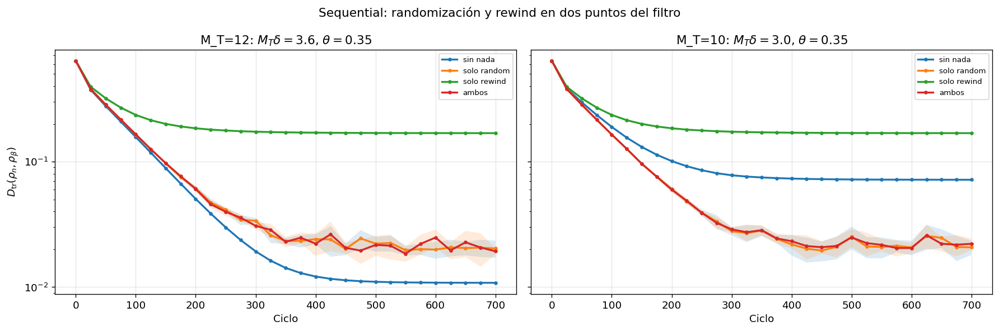

In [22]:
# ============================================================
# A.5.5 — Convergencia: M_T=12 vs M_T=10
# ============================================================

fig, axes = plt.subplots(1, 2, figsize=(15, 5), sharey=True)

for ax, (case_name, res) in zip(axes, seq_cases.items()):

    for variant, outs in res["outs"].items():

        histories = []
        for out in outs:
            hdf = out["history"][["cycle", "D_trace"]].copy()
            hdf["seed_id"] = len(histories)
            histories.append(hdf)

        hcat = pd.concat(histories, ignore_index=True)

        hmean = (
            hcat
            .groupby("cycle")["D_trace"]
            .mean()
            .reset_index()
        )

        hstd = (
            hcat
            .groupby("cycle")["D_trace"]
            .std()
            .fillna(0.0)
            .reset_index()
        )

        ax.semilogy(
            hmean["cycle"],
            hmean["D_trace"],
            marker="o",
            ms=3,
            lw=2,
            label=variant,
        )

        if len(outs) > 1:
            lower = np.maximum(
                hmean["D_trace"].to_numpy() - hstd["D_trace"].to_numpy(),
                1e-12,
            )
            upper = hmean["D_trace"].to_numpy() + hstd["D_trace"].to_numpy()

            ax.fill_between(
                hmean["cycle"],
                lower,
                upper,
                alpha=0.15,
            )

    MT = res["params"]["M_T"]
    delta = res["params"]["delta"]
    theta = res["params"]["theta"]

    ax.set(
        xlabel="Ciclo",
        title=f"{case_name}: $M_T\\delta={MT * delta:.1f}$, $\\theta={theta}$",
    )
    ax.grid(alpha=0.3)
    ax.legend(fontsize=8)

axes[0].set_ylabel("$D_{\\rm tr}(\\rho_n,\\rho_\\beta)$")

plt.suptitle(
    "Sequential: randomización y rewind en dos puntos del filtro",
    fontsize=13,
)

plt.tight_layout()
plt.show()

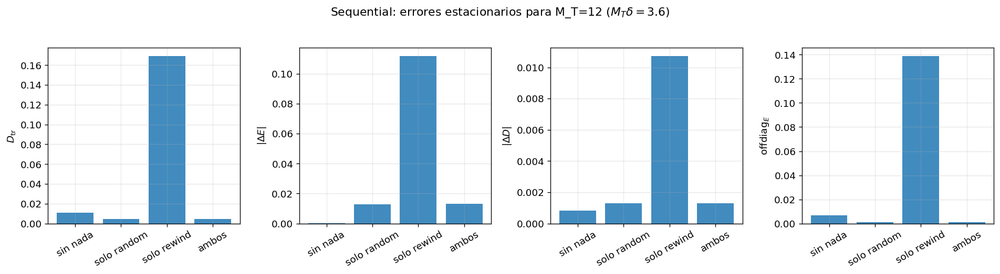

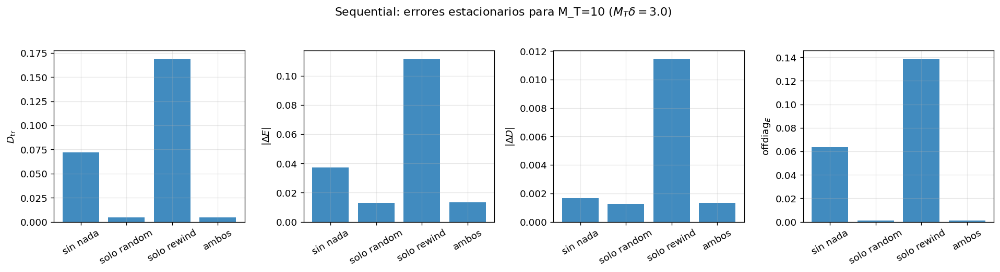

In [23]:
# ============================================================
# A.5.5 — Resumen estacionario de observables
# ============================================================

metrics = [
    ("D_trace", "$D_{\\rm tr}$"),
    ("abs_Delta_E", "$|\\Delta E|$"),
    ("abs_Delta_D_avg", "$|\\Delta D|$"),
    ("offdiag_E", "offdiag$_E$"),
]

for case_name in ["M_T=12", "M_T=10"]:

    df_case = (
        df_seq_stationary
        .query("case == @case_name")
        .copy()
    )

    fig, axes = plt.subplots(1, 4, figsize=(16, 4.2))

    for ax, (col, ylabel) in zip(axes, metrics):
        ax.bar(
            df_case["variant"].astype(str),
            df_case[col],
            alpha=0.85,
        )
        ax.set_ylabel(ylabel)
        ax.tick_params(axis="x", rotation=30)
        ax.grid(alpha=0.3, axis="y")

    MT = int(df_case["M_T"].iloc[0])
    MT_delta = float(df_case["M_T_delta"].iloc[0])

    plt.suptitle(
        f"Sequential: errores estacionarios para {case_name} "
        f"($M_T\\delta={MT_delta:.1f}$)",
        y=1.03,
    )

    plt.tight_layout()
    plt.show()

Los dos valores de $M_T$ ilustran dos regímenes distintos.

Para $M_T=12$, el protocolo determinista ya cae en un punto favorable del filtro. En ese caso, `sin nada` puede ser la mejor opción: la randomización introduce fluctuaciones y el `rewind` cambia el canal estacionario sin aportar mejora.

Para $M_T=10$, el valor $M_T\delta$ está más cerca de una zona resonante. Ahí la randomización puede ser más útil, porque rompe parte de la acumulación coherente de fases entre ciclos. Si mejora la curva, debe interpretarse como una ganancia de robustez frente al punto resonante, no como una mejora universal.

El `rewind` es más delicado: puede reducir fases libres acumuladas, pero también modifica el punto fijo del canal. Por eso no basta mirar la distancia traza; comparamos también energía, doble ocupación, coherencia en base de energía y correlaciones.

La conclusión práctica es que `random` y `rewind` no son recetas automáticas. Para parámetros bien elegidos, el canal secuencial simple puede ser superior. Cerca de resonancias, la randomización puede estabilizar la dinámica.

## A.6 Escalado del protocolo

### A.6.1 Escalado perturbativo en $\theta$

En el régimen perturbativo esperamos que el error del punto fijo respecto al Gibbs exacto escale aproximadamente como

$$
\mathrm{error} \sim \theta^2.
$$

Para comprobarlo calculamos el punto fijo exacto del canal determinista para varios valores de $\theta$ y ajustamos la pendiente en escala log-log.

Usamos el dímero Hubbard con parámetros fijos y comparamos `FullBath` y `Sequential`.

In [ ]:
# ============================================================
# A.6.1 — Escalado perturbativo en theta
# ============================================================

# ------------------------------------------------------------
# Setup físico
# ------------------------------------------------------------

m_theta = fhm.FermiHubbardJW(
    n_sites=2,
    bonds=[(0, 1)],
    t=1.0,
    U=4.0,
    mu=0.0,
)

A_theta, labs_theta = fhm.build_coupling_ops_paper(m_theta)

beta_theta = 2.0
h_theta = 1.0
delta_theta = 0.30
MT_theta = 12

rho_g_theta = m_theta.gibbs_state(beta_theta)

E_g_theta = m_theta.energy(rho_g_theta)
D_g_theta = m_theta.avg_double_occupancy(rho_g_theta)
Czz_g_theta = m_theta.spin_correlation(rho_g_theta, 0, 1)

theta_grid = np.array(
    [0.025, 0.035, 0.050, 0.070, 0.100, 0.140, 0.180, 0.250, 0.350],
    dtype=float,
)


# ------------------------------------------------------------
# Helpers
# ------------------------------------------------------------

def offdiag_energy_norm(model, rho):
    evals, evecs = model.eigensystem()
    rho_e = evecs.conj().T @ rho @ evecs
    off = rho_e - np.diag(np.diag(rho_e))
    return float(np.linalg.norm(off, ord="fro"))


def protocol_fixed_point_row(protocol_name, theta):
    if protocol_name == "FullBath":
        cls = fhm.ThermalProtocolFullBath
        kwargs = dict(random_evolution=False)
    elif protocol_name == "Sequential":
        cls = fhm.ThermalProtocolSequential
        kwargs = dict(random_order=False, random_evolution=False)
    else:
        raise ValueError(protocol_name)

    t0 = time.time()

    prot = cls(
        m_theta,
        A_ops=A_theta,
        labels=labs_theta,
        h_bath=h_theta,
        beta=beta_theta,
        theta=float(theta),
        delta=delta_theta,
        M_T=MT_theta,
        **kwargs,
    )

    rho_fp = prot.fixed_point()

    elapsed = time.time() - t0

    E_fp = m_theta.energy(rho_fp)
    D_fp = m_theta.avg_double_occupancy(rho_fp)
    Czz_fp = m_theta.spin_correlation(rho_fp, 0, 1)

    return {
        "protocol": protocol_name,
        "theta": float(theta),
        "D_trace": float(fhm.trace_distance(rho_fp, rho_g_theta)),
        "abs_Delta_E": float(abs(E_fp - E_g_theta)),
        "abs_Delta_D": float(abs(D_fp - D_g_theta)),
        "abs_Delta_Czz": float(abs(Czz_fp - Czz_g_theta)),
        "offdiag_E": offdiag_energy_norm(m_theta, rho_fp),
        "build_plus_fp_sec": float(elapsed),
    }


# ------------------------------------------------------------
# Ejecutar barrido
# ------------------------------------------------------------

rows_theta = []

for protocol_name in ["FullBath", "Sequential"]:
    print(f"\n=== {protocol_name} ===")

    for theta in theta_grid:
        row = protocol_fixed_point_row(protocol_name, theta)
        rows_theta.append(row)

        print(
            f"theta={theta:.3f} | "
            f"D={row['D_trace']:.4e} | "
            f"|ΔE|={row['abs_Delta_E']:.4e} | "
            f"time={row['build_plus_fp_sec']:.2f}s"
        )

df_theta_scaling = pd.DataFrame(rows_theta)

display(df_theta_scaling.round(8))


=== FullBath ===
theta=0.025 | D=9.1513e-05 | |ΔE|=1.0865e-05 | time=2.96s
theta=0.035 | D=1.7908e-04 | |ΔE|=2.0969e-05 | time=6.71s
theta=0.050 | D=3.6430e-04 | |ΔE|=4.1338e-05 | time=5.12s
theta=0.070 | D=7.1015e-04 | |ΔE|=7.5408e-05 | time=5.21s
theta=0.100 | D=1.4392e-03 | |ΔE|=1.2773e-04 | time=6.25s
theta=0.140 | D=2.8571e-03 | |ΔE|=1.4749e-04 | time=5.94s
theta=0.180 | D=4.9845e-03 | |ΔE|=3.7692e-05 | time=6.63s
theta=0.250 | D=9.8506e-03 | |ΔE|=4.1978e-04 | time=9.46s
theta=0.350 | D=1.5404e-02 | |ΔE|=1.4685e-03 | time=8.14s

=== Sequential ===
theta=0.025 | D=5.5063e-05 | |ΔE|=3.1884e-05 | time=0.63s
theta=0.035 | D=1.0788e-04 | |ΔE|=6.2401e-05 | time=0.94s
theta=0.050 | D=2.1997e-04 | |ΔE|=1.2695e-04 | time=3.02s
theta=0.070 | D=4.3046e-04 | |ΔE|=2.4739e-04 | time=4.18s
theta=0.100 | D=8.7567e-04 | |ΔE|=4.9889e-04 | time=1.07s
theta=0.140 | D=1.7076e-03 | |ΔE|=9.5696e-04 | time=3.54s
theta=0.180 | D=2.8093e-03 | |ΔE|=1.5381e-03 | time=0.64s
theta=0.250 | D=5.4014e-03 | |ΔE|=

,protocol,theta,D_trace,abs_Delta_E,abs_Delta_D,abs_Delta_Czz,offdiag_E,build_plus_fp_sec
0,FullBath,0.025,0.000092,0.000011,1.180000e-06,0.000008,0.000083,2.958383
1,FullBath,0.035,0.000179,0.000021,2.250000e-06,0.000016,0.000162,6.710156
2,FullBath,0.050,0.000364,0.000041,4.340000e-06,0.000031,0.000330,5.115505
3,FullBath,0.070,0.000710,0.000075,7.490000e-06,0.000057,0.000643,5.210153
4,FullBath,0.100,0.001439,0.000128,1.051000e-05,0.000098,0.001301,6.249537
5,FullBath,0.140,0.002857,0.000147,1.540000e-06,0.000118,0.002584,5.937902
6,FullBath,0.180,0.004985,0.000038,3.574000e-05,0.000054,0.004523,6.625034
7,FullBath,0.250,0.009851,0.000420,1.501300e-04,0.000125,0.008784,9.464895
8,FullBath,0.350,0.015404,0.001468,3.246500e-04,0.000097,0.012560,8.139986
9,Sequential,0.025,0.000055,0.000032,2.000000e-08,0.000007,0.000032,0.630904


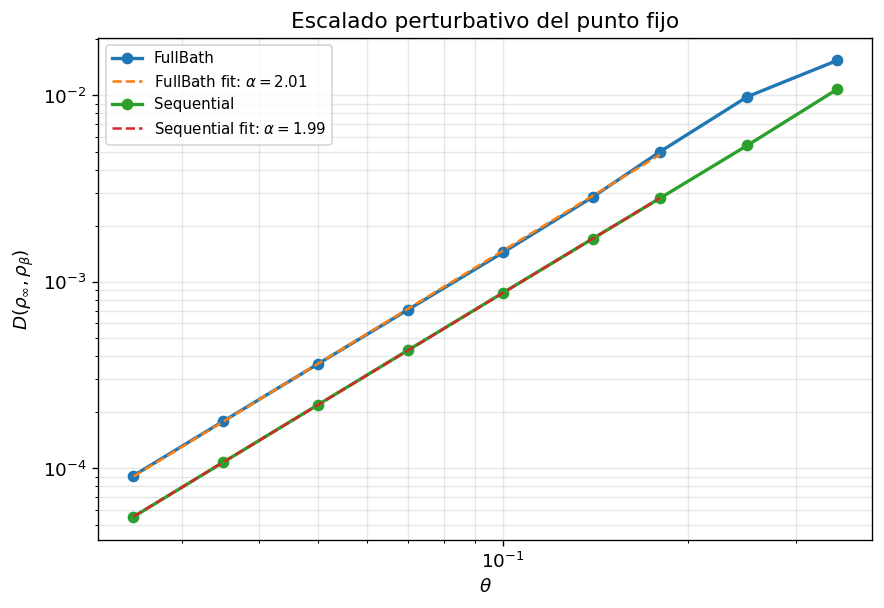

,protocol,metric,theta_fit_max,alpha_fit,prefactor,n_fit_points
0,FullBath,D_trace,0.18,2.012782,0.151742,7
1,Sequential,D_trace,0.18,1.992193,0.085821,7


In [3]:
# ============================================================
# A.6.1 — Ajuste log-log del escalado en theta
# ============================================================

metric_main = "D_trace"

# Rango perturbativo usado para el ajuste.
# Evitamos theta demasiado grande porque puede salir del régimen cuadrático.
theta_fit_max = 0.18

fit_rows = []

fig, ax = plt.subplots(figsize=(7.5, 5.2))

for protocol_name, dfp in df_theta_scaling.groupby("protocol"):
    dfp = dfp.sort_values("theta").copy()

    ax.loglog(
        dfp["theta"],
        dfp[metric_main],
        "o-",
        lw=2,
        label=protocol_name,
    )

    fit_mask = (
        (dfp["theta"] <= theta_fit_max)
        &
        (dfp[metric_main] > 0)
    )

    x = np.log(dfp.loc[fit_mask, "theta"].to_numpy())
    y = np.log(dfp.loc[fit_mask, metric_main].to_numpy())

    slope, intercept = np.polyfit(x, y, deg=1)

    theta_line = np.linspace(
        dfp.loc[fit_mask, "theta"].min(),
        dfp.loc[fit_mask, "theta"].max(),
        200,
    )

    y_line = np.exp(intercept) * theta_line ** slope

    ax.loglog(
        theta_line,
        y_line,
        "--",
        lw=1.5,
        label=f"{protocol_name} fit: $\\alpha={slope:.2f}$",
    )

    fit_rows.append({
        "protocol": protocol_name,
        "metric": metric_main,
        "theta_fit_max": theta_fit_max,
        "alpha_fit": slope,
        "prefactor": np.exp(intercept),
        "n_fit_points": int(fit_mask.sum()),
    })

df_theta_fit = pd.DataFrame(fit_rows)

ax.set(
    xlabel="$\\theta$",
    ylabel="$D(\\rho_\\infty,\\rho_\\beta)$",
    title="Escalado perturbativo del punto fijo",
)

ax.grid(alpha=0.3, which="both")
ax.legend(fontsize=9)

plt.tight_layout()
plt.show()

display(df_theta_fit.round(6))

### A.6.2 Escalado con tamaño del sistema

Ahora comparamos el coste y la convergencia exacta de `Sequential` al aumentar el tamaño del sistema.

Para que la comparación sea justa usamos:

- los mismos parámetros del protocolo;
- el mismo número de ciclos;
- el mismo intervalo de registro;
- el mismo target Gibbs global.

No optimizamos parámetros para cada sistema. El objetivo es ver cómo se degrada la convergencia con tamaño bajo un presupuesto fijo.

In [ ]:
# ============================================================
# A.6.2 — Casos y coste dimensional
# ============================================================
cases_scaling = ["dimer", "chain3", "plaquette2x2"]

cost_rows = []

for case in cases_scaling:
    m = make_fh_case(case)
    A_ops, labels = fhm.build_coupling_ops_paper(m)

    dim_S = m.dim
    n_ops = len(A_ops)

    dim_full_bath = 2 ** n_ops
    dim_total_full = dim_S * dim_full_bath

    dim_total_seq = dim_S * 2

    cost_rows.append({
        "case": case,
        "n_sites": m.n_sites,
        "n_qubits_system": m.n_qubits,
        "dim_S": dim_S,
        "n_ops": n_ops,

        "FullBath_dim_B": dim_full_bath,
        "FullBath_dim_total": dim_total_full,
        "FullBath_one_dense_matrix_MB": dense_complex_matrix_mb(dim_total_full),

        "Sequential_dim_B": 2,
        "Sequential_dim_total": dim_total_seq,
        "Sequential_one_dense_matrix_MB": dense_complex_matrix_mb(dim_total_seq),
    })

df_scaling_cost = pd.DataFrame(cost_rows)

display(df_scaling_cost.round(3))

,case,n_sites,n_qubits_system,dim_S,n_ops,FullBath_dim_B,FullBath_dim_total,FullBath_one_dense_matrix_MB,Sequential_dim_B,Sequential_dim_total,Sequential_one_dense_matrix_MB
0,dimer,2,4,16,4,16,256,1.0,2,32,0.016
1,chain3,3,6,64,6,64,4096,256.0,2,128,0.250
2,plaquette2x2,4,8,256,8,256,65536,65536.0,2,512,4.000


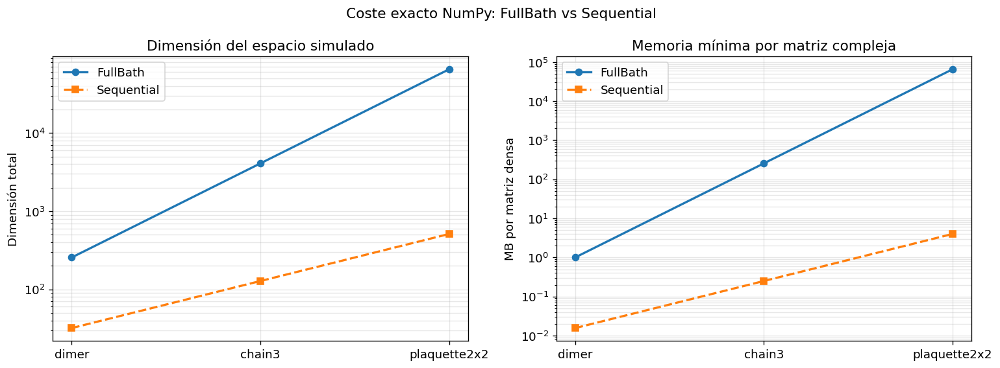

In [7]:
# ============================================================
# A.6.2 — Figura de coste dimensional
# ============================================================

fig, axes = plt.subplots(1, 2, figsize=(13, 4.8))

x = np.arange(len(df_scaling_cost))
labels_cases = df_scaling_cost["case"].tolist()

axes[0].semilogy(
    x,
    df_scaling_cost["FullBath_dim_total"],
    "o-",
    lw=2,
    label="FullBath",
)

axes[0].semilogy(
    x,
    df_scaling_cost["Sequential_dim_total"],
    "s--",
    lw=2,
    label="Sequential",
)

axes[0].set(
    xticks=x,
    xticklabels=labels_cases,
    ylabel="Dimensión total",
    title="Dimensión del espacio simulado",
)

axes[0].grid(alpha=0.3, which="both")
axes[0].legend()


axes[1].semilogy(
    x,
    df_scaling_cost["FullBath_one_dense_matrix_MB"],
    "o-",
    lw=2,
    label="FullBath",
)

axes[1].semilogy(
    x,
    df_scaling_cost["Sequential_one_dense_matrix_MB"],
    "s--",
    lw=2,
    label="Sequential",
)

axes[1].set(
    xticks=x,
    xticklabels=labels_cases,
    ylabel="MB por matriz densa",
    title="Memoria mínima por matriz compleja",
)

axes[1].grid(alpha=0.3, which="both")
axes[1].legend()

plt.suptitle("Coste exacto NumPy: FullBath vs Sequential", fontsize=13)
plt.tight_layout()
plt.show()

In [8]:
# ============================================================
# A.6.2 — Sequential con presupuesto común de ciclos
# ============================================================

beta_scale = 2.0
h_scale = 1.0
theta_scale = 0.10
delta_scale = 0.30
MT_scale = 12

n_cycles_common = 80
record_every_common = 5

seq_scale_results = {}
seq_scale_rows = []

for case in cases_scaling:
    print("\n" + "=" * 72)
    print(f"Sequential scaling case: {case}")
    print("=" * 72)

    m = make_fh_case(case)
    A_ops, labels = fhm.build_coupling_ops_paper(m)

    rho_g = m.gibbs_state(beta_scale)
    E_g = m.energy(rho_g)

    t0 = time.time()

    proto = fhm.ThermalProtocolSequential(
        m,
        A_ops=A_ops,
        labels=labels,
        h_bath=h_scale,
        beta=beta_scale,
        theta=theta_scale,
        delta=delta_scale,
        M_T=MT_scale,
        random_order=False,
        random_evolution=False,
    )

    build_time = time.time() - t0

    t1 = time.time()

    out = proto.run(
        n_cycles=n_cycles_common,
        verbose=False,
        record_every=record_every_common,
        seed=1,
    )

    run_time = time.time() - t1

    cycles = np.asarray(out["cycles"])
    trace_dist = np.asarray(out["trace_dist"])
    energies = np.asarray(out["energies"])

    abs_delta_E_per_site = np.abs(energies - E_g) / m.n_sites

    seq_scale_results[case] = {
        "model": m,
        "rho_g": rho_g,
        "E_g": E_g,
        "out": out,
        "cycles": cycles,
        "trace_dist": trace_dist,
        "abs_delta_E_per_site": abs_delta_E_per_site,
        "build_time": build_time,
        "run_time": run_time,
    }

    seq_scale_rows.append({
        "case": case,
        "n_sites": m.n_sites,
        "dim_S": m.dim,
        "dim_total_seq": proto.dT,
        "build_time_sec": build_time,
        "run_time_sec": run_time,
        "D_initial": trace_dist[0],
        "D_final": trace_dist[-1],
        "D_drop": trace_dist[0] - trace_dist[-1],
        "abs_Delta_E_per_site_final": abs_delta_E_per_site[-1],
    })

df_seq_scaling = pd.DataFrame(seq_scale_rows)

display(df_seq_scaling.round(6))


Sequential scaling case: dimer

Sequential scaling case: chain3

Sequential scaling case: plaquette2x2


,case,n_sites,dim_S,dim_total_seq,build_time_sec,run_time_sec,D_initial,D_final,D_drop,abs_Delta_E_per_site_final
0,dimer,2,16,32,0.067579,0.639237,0.636506,0.499151,0.137355,1.145342
1,chain3,3,64,128,2.928319,1.290358,0.775804,0.644942,0.130863,1.214348
2,plaquette2x2,4,256,512,51.518186,35.697608,0.873970,0.766120,0.107850,1.345602


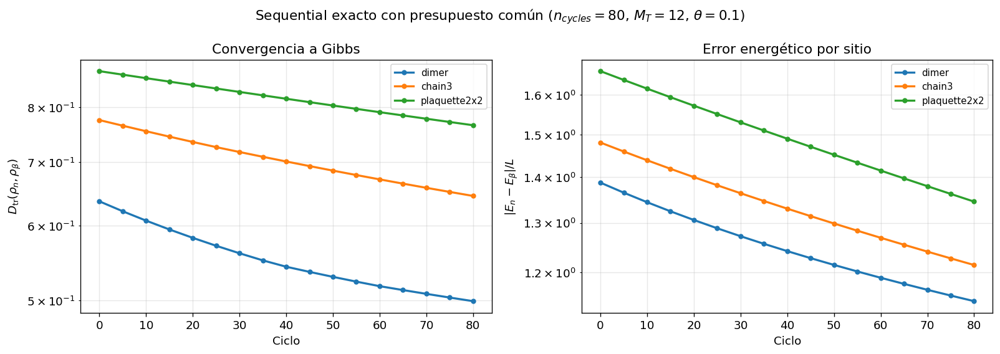

In [9]:
# ============================================================
# A.6.2 — Figura rigurosa: mismo presupuesto para todos
# ============================================================

fig, axes = plt.subplots(1, 2, figsize=(13.5, 4.8))

for case, res in seq_scale_results.items():
    axes[0].semilogy(
        res["cycles"],
        res["trace_dist"],
        "o-",
        lw=2,
        ms=4,
        label=case,
    )

    axes[1].semilogy(
        res["cycles"],
        res["abs_delta_E_per_site"],
        "o-",
        lw=2,
        ms=4,
        label=case,
    )

axes[0].set(
    xlabel="Ciclo",
    ylabel="$D_{\\rm tr}(\\rho_n,\\rho_\\beta)$",
    title="Convergencia a Gibbs",
)

axes[1].set(
    xlabel="Ciclo",
    ylabel="$|E_n-E_\\beta|/L$",
    title="Error energético por sitio",
)

for ax in axes:
    ax.grid(alpha=0.3, which="both")
    ax.legend(fontsize=9)

plt.suptitle(
    "Sequential exacto con presupuesto común "
    f"($n_{{cycles}}={n_cycles_common}$, $M_T={MT_scale}$, $\\theta={theta_scale}$)",
    fontsize=13,
)

plt.tight_layout()
plt.show()

## A.7 Termodinámica de referencia y régimen de validez


### A.7.1  Diagrama de fases exacto $(U/t, T)$

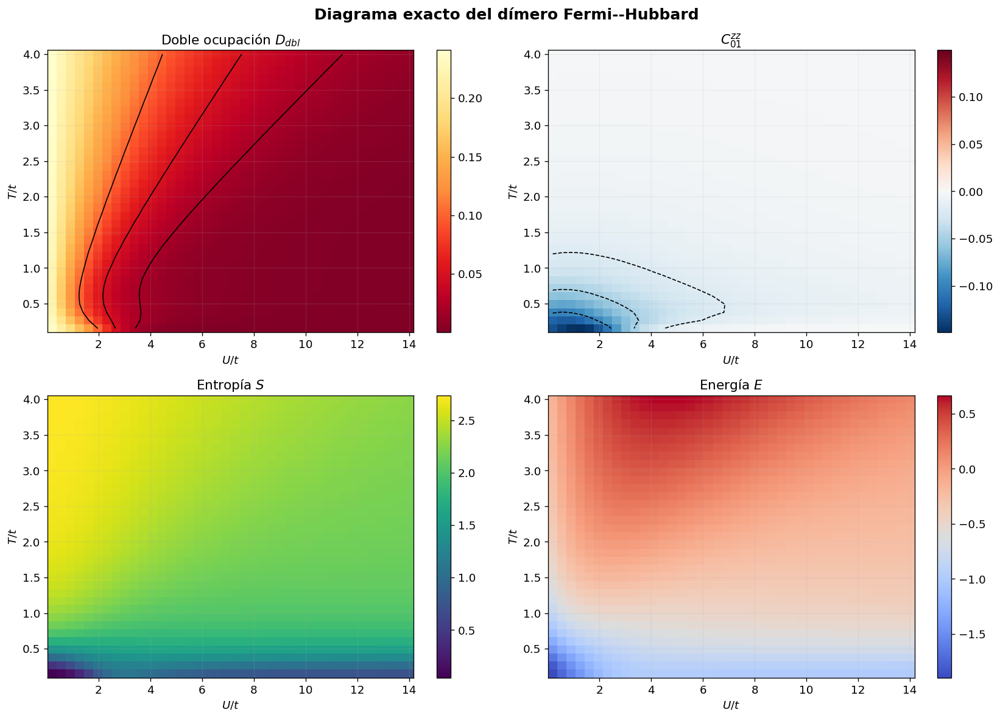

In [98]:
from matplotlib.colors import TwoSlopeNorm

U_grid = np.linspace(0.2, 14, 40)
T_grid = np.linspace(0.15, 4.0, 35)

D_map = np.zeros((len(T_grid), len(U_grid)))
Czz_map = np.zeros_like(D_map)
S_map = np.zeros_like(D_map)
E_map = np.zeros_like(D_map)

for j, U in enumerate(U_grid):
    m = FermiHubbardJW(n_sites=2, bonds=[(0, 1)], t=1.0, U=float(U))

    for i, T in enumerate(T_grid):
        beta = 1.0 / float(T)
        rho_g = m.gibbs_state(beta)

        D_map[i, j] = m.avg_double_occupancy(rho_g)
        Czz_map[i, j] = m.spin_correlation(rho_g, 0, 1)
        S_map[i, j] = von_neumann_entropy(rho_g)
        E_map[i, j] = m.energy(rho_g)

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Doble ocupación: cantidad positiva. Alto claro, bajo rojo oscuro.
im0 = axes[0, 0].pcolormesh(
    U_grid,
    T_grid,
    D_map,
    cmap="YlOrRd_r",
    shading="auto",
)
axes[0, 0].contour(
    U_grid,
    T_grid,
    D_map,
    levels=[0.02, 0.05, 0.10],
    colors="k",
    linewidths=1,
)
axes[0, 0].set_title("Doble ocupación $D_{dbl}$")
axes[0, 0].set_xlabel("$U/t$")
axes[0, 0].set_ylabel("$T/t$")
axes[0, 0].grid(alpha=0.15)
plt.colorbar(im0, ax=axes[0, 0])

# Correlador firmado: centrado en cero.
czz_abs = max(abs(np.nanmin(Czz_map)), abs(np.nanmax(Czz_map)), 1e-12)
norm_czz = TwoSlopeNorm(vmin=-czz_abs, vcenter=0.0, vmax=czz_abs)

im1 = axes[0, 1].pcolormesh(
    U_grid,
    T_grid,
    Czz_map,
    cmap="RdBu_r",
    norm=norm_czz,
    shading="auto",
)
axes[0, 1].contour(
    U_grid,
    T_grid,
    Czz_map,
    levels=[-0.10, -0.05, -0.02],
    colors="k",
    linewidths=1,
    linestyles="--",
)
axes[0, 1].set_title("$C^{zz}_{01}$")
axes[0, 1].set_xlabel("$U/t$")
axes[0, 1].set_ylabel("$T/t$")
axes[0, 1].grid(alpha=0.15)
plt.colorbar(im1, ax=axes[0, 1])

# Entropía: cantidad positiva.
im2 = axes[1, 0].pcolormesh(
    U_grid,
    T_grid,
    S_map,
    cmap="viridis",
    shading="auto",
)
axes[1, 0].set_title("Entropía $S$")
axes[1, 0].set_xlabel("$U/t$")
axes[1, 0].set_ylabel("$T/t$")
axes[1, 0].grid(alpha=0.15)
plt.colorbar(im2, ax=axes[1, 0])

# Energía firmada: centrada en cero.
E_abs = max(abs(np.nanmin(E_map)), abs(np.nanmax(E_map)), 1e-12)
norm_E = TwoSlopeNorm(vmin=-E_abs, vcenter=0.0, vmax=E_abs)

im3 = axes[1, 1].pcolormesh(
    U_grid,
    T_grid,
    E_map,
    cmap="coolwarm",
    shading="auto",
)
axes[1, 1].set_title("Energía $E$")
axes[1, 1].set_xlabel("$U/t$")
axes[1, 1].set_ylabel("$T/t$")
axes[1, 1].grid(alpha=0.15)
plt.colorbar(im3, ax=axes[1, 1])


plt.suptitle("Diagrama exacto del dímero Fermi--Hubbard", fontsize=15, fontweight="bold")
plt.tight_layout()
plt.show()

El diagrama exacto sirve como referencia física. No evalúa el protocolo, sino el Gibbs exacto del dímero. La doble ocupación disminuye con $U/t$, las correlaciones de spin aparecen a baja temperatura y la entropía crece al poblar estados excitados.

### A.7.2 Calor específico 

Calculamos $C(T)$ desde fluctuaciones exactas de Gibbs, $C=\beta^2(\langle H^2\rangle-\langle H\rangle^2)$. Esto evita errores numéricos por derivadas ruidosas.

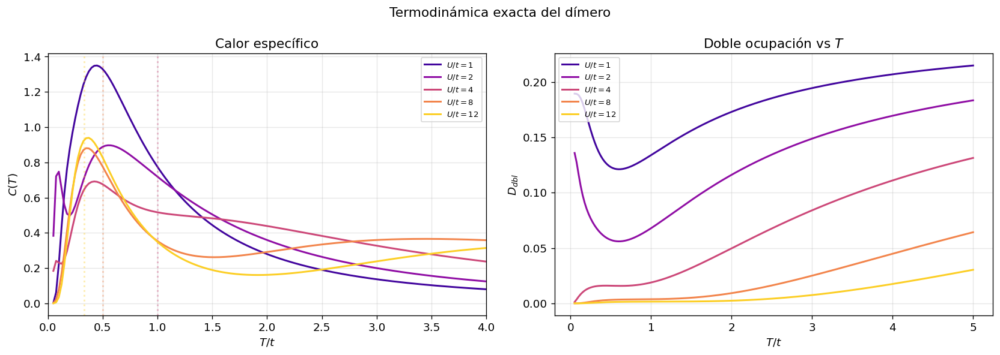

In [99]:
T_grid_exact = np.linspace(0.05, 5.0, 200)
U_values_exact = [1, 2, 4, 8, 12]

colors = plt.cm.plasma(np.linspace(0.1, 0.9, len(U_values_exact)))

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

for U, col in zip(U_values_exact, colors):
    m = FermiHubbardJW(n_sites=2, bonds=[(0, 1)], t=1.0, U=float(U))

    C_vals = []
    D_vals = []

    for T in T_grid_exact:
        beta = 1.0 / float(T)
        rho_g = m.gibbs_state(beta)

        C_vals.append(exact_heat_capacity(m, T))
        D_vals.append(m.avg_double_occupancy(rho_g))

    axes[0].plot(
        T_grid_exact,
        C_vals,
        "-",
        color=col,
        label=f"$U/t={U}$",
    )

    axes[1].plot(
        T_grid_exact,
        D_vals,
        "-",
        color=col,
        label=f"$U/t={U}$",
    )

    if U >= 4:
        axes[0].axvline(
            4.0 / U,
            color=col,
            ls=":",
            alpha=0.35,
        )

axes[0].set_xlabel("$T/t$")
axes[0].set_ylabel("$C(T)$")
axes[0].set_title("Calor específico")
axes[0].set_xlim(0, 4)
axes[0].grid(alpha=0.3)
axes[0].legend(fontsize=8)

axes[1].set_xlabel("$T/t$")
axes[1].set_ylabel("$D_{dbl}$")
axes[1].set_title("Doble ocupación vs $T$")
axes[1].grid(alpha=0.3)
axes[1].legend(fontsize=8)

plt.suptitle("Termodinámica exacta del dímero", fontsize=13)
plt.tight_layout()
plt.show()

Los máximos del calor específico marcan escalas térmicas donde el espectro empieza a poblar nuevos niveles. Estas escalas cambian con $U/t$ y ayudan a interpretar por qué un único conjunto de parámetros del protocolo no es igualmente eficiente en todo el plano.

### A.7.3 Mapa de fidelidad del protocolo  $(U/t,T)$

Este mapa muestra dónde el punto fijo del protocolo queda cerca de Gibbs. Es más limpio presentar los fallos aquí, como regiones de mayor distancia, y no mezclarlos con comparaciones de observables saturadas.

In [6]:
U_pr = np.array([0.5, 1, 2, 3, 4, 6, 8, 10, 12], dtype=float)
T_pr = np.array([0.3, 0.5, 0.8, 1.0, 1.5, 2.0, 3.0], dtype=float)

protocol_cls_pr = ThermalProtocolFullBath

theta_pr = 0.10
h_pr = 1.0
delta_pr = 0.30
MT_pr = 22

D_pr = np.zeros((len(T_pr), len(U_pr)))

for j, U in enumerate(U_pr):
    print("U =", U)

    m = FermiHubbardJW(n_sites=2, bonds=[(0, 1)], t=1.0, U=float(U))
    A_ops, labels = build_coupling_ops_paper(m)

    for i, T in enumerate(T_pr):
        beta = 1.0 / float(T)
        rho_g = m.gibbs_state(beta)

        rho_fp, proto = protocol_fixed_point(
            protocol_cls_pr,
            m,
            A_ops,
            labels,
            beta=beta,
            h_bath=h_pr,
            theta=theta_pr,
            delta=delta_pr,
            M_T=MT_pr,
        )

        D_pr[i, j] = trace_distance(rho_fp, rho_g)

display(pd.DataFrame(D_pr, index=T_pr, columns=U_pr))

U = 0.5
U = 1.0
U = 2.0
U = 3.0
U = 4.0
U = 6.0
U = 8.0
U = 10.0
U = 12.0


,0.5,1.0,2.0,3.0,4.0,6.0,8.0,10.0,12.0
0.3,0.001333,0.001367,0.001273,0.001321,0.001349,0.001298,0.446315,0.056515,1.000139
0.5,0.002645,0.001430,0.001217,0.001010,0.001163,0.000950,0.050644,0.100557,0.998792
0.8,0.002779,0.001042,0.001039,0.000772,0.000811,0.000752,0.004727,0.177109,0.914609
1.0,0.002545,0.000902,0.000990,0.000771,0.000809,0.000967,0.002123,0.217512,0.892196
1.5,0.001952,0.000772,0.000903,0.000780,0.000869,0.002048,0.002102,0.160147,0.987208
2.0,0.001552,0.000677,0.000815,0.000748,0.000859,0.003121,0.003115,0.149329,0.993246
3.0,0.001068,0.000513,0.000638,0.000648,0.000749,0.004355,0.008476,0.215664,0.949285


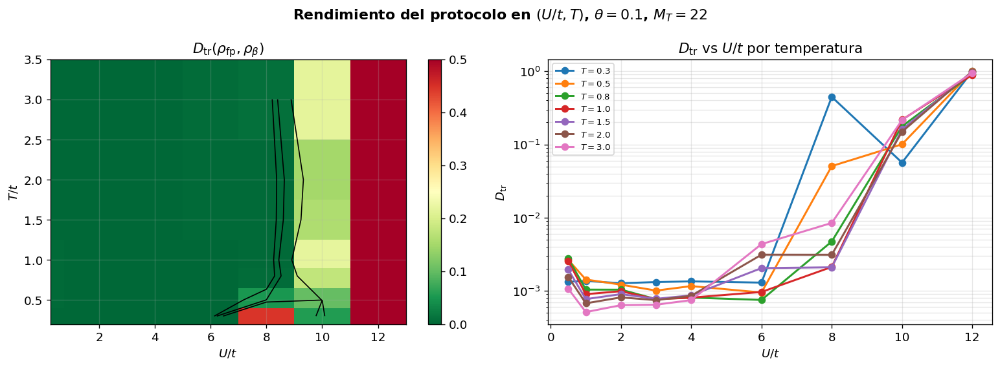

In [9]:
fig, axes = plt.subplots(1, 2, figsize=(13, 4.8))

im = axes[0].pcolormesh(
    U_pr,
    T_pr,
    D_pr,
    cmap="RdYlGn_r",
    shading="auto",
    vmin=0,
    vmax=min(0.5, np.nanmax(D_pr)),
)

axes[0].contour(U_pr, T_pr, D_pr, levels=[0.03, 0.05, 0.1], colors="k", linewidths=1)
axes[0].set_xlabel("$U/t$")
axes[0].set_ylabel("$T/t$")
axes[0].set_title(r"$D_{\rm tr}(\rho_{\rm fp},\rho_\beta)$")
plt.colorbar(im, ax=axes[0])

for i, T in enumerate(T_pr):
    axes[1].plot(U_pr, D_pr[i, :], "o-", label=f"$T={T}$")

axes[1].set_yscale("log")
axes[1].set_xlabel("$U/t$")
axes[1].set_ylabel(r"$D_{\rm tr}$")
axes[1].set_title(r"$D_{\rm tr}$ vs $U/t$ por temperatura")
axes[1].grid(alpha=0.3, which="both")
axes[1].legend(fontsize=8)

plt.suptitle(
    rf"Rendimiento del protocolo en $(U/t,T)$, $\theta={theta_pr}$, $M_T={MT_pr}$",
    fontweight="bold",
)
plt.tight_layout()
plt.show()

El mapa muestra el régimen de validez del protocolo con parámetros fijos. El error es pequeño para $U/t$ bajo e intermedio, pero crece en régimen fuerte. Esto sugiere que el filtro temporal debe reajustarse cuando las escalas dominantes del espectro cambian.

### A.7.4 Observables físicos en el régimen estable

El mapa anterior mide la distancia traza entre el punto fijo del protocolo y el Gibbs exacto global con $\mu=0$.

Como comprobación adicional, evaluamos observables físicos en una región donde el protocolo ya funciona razonablemente bien: $U/t=1,2,4$ y temperaturas moderadas.

No usamos esta sección para estudiar fallos extremos. Esos quedan resumidos en el mapa de rendimiento. Aquí comprobamos si, en el régimen estable, el protocolo reproduce también energía, doble ocupación y correlaciones de spin.

In [102]:
U_obs = [1.0, 2.0, 4.0]
T_obs = [0.5, 1.0, 2.0]

theta_obs = 0.10
h_obs = 1.0
delta_obs = 0.30
MT_obs = 22

protocols_obs = [
    (ThermalProtocolFullBath, "FullBath"),
    (ThermalProtocolSequential, "Sequential"),
]

rows_obs = []

for U in U_obs:
    m = FermiHubbardJW(n_sites=2, bonds=[(0, 1)], t=1.0, U=float(U))
    A_ops, labels = build_coupling_ops_paper(m)

    for T in T_obs:
        beta = 1.0 / float(T)
        rho_g = m.gibbs_state(beta)

        rows_obs.append({
            "kind": "Gibbs",
            "protocol": "Gibbs",
            "U": U,
            "T": T,
            **state_metrics(m, rho_g, rho_g, "Gibbs"),
        })

        for protocol_cls, pname in protocols_obs:
            rho_fp, proto = protocol_fixed_point(
                protocol_cls,
                m,
                A_ops,
                labels,
                beta=beta,
                h_bath=h_obs,
                theta=theta_obs,
                delta=delta_obs,
                M_T=MT_obs,
            )

            rows_obs.append({
                "kind": "Protocol",
                "protocol": pname,
                "U": U,
                "T": T,
                **state_metrics(m, rho_fp, rho_g, pname),
            })

df_obs = pd.DataFrame(rows_obs)

display(df_obs[[
    "protocol", "U", "T", "Dtr", "E", "E_g", "abs_Delta_E",
    "D_avg", "D_g", "abs_Delta_D", "Czz_01", "Czz_g", "abs_Delta_Czz",
    "MI_01", "MI_g", "abs_Delta_MI", "S", "S_g"
]].round(6))

,protocol,U,T,Dtr,E,E_g,abs_Delta_E,D_avg,D_g,abs_Delta_D,Czz_01,Czz_g,abs_Delta_Czz,MI_01,MI_g,abs_Delta_MI,S,S_g
0,Gibbs,1.0,0.5,0.000000,-1.130991,-1.130991,0.000000,0.123015,0.123015,0.000000,-0.074584,-0.074584,0.000000,1.151367,1.151367,0.000000,1.521339,1.521339
1,FullBath,1.0,0.5,0.001430,-1.130083,-1.130991,0.000908,0.122971,0.123015,0.000044,-0.074297,-0.074584,0.000287,1.149478,1.151367,0.001889,1.523148,1.521339
2,Sequential,1.0,0.5,0.005506,-1.130229,-1.130991,0.000762,0.123631,0.123015,0.000617,-0.074689,-0.074584,0.000105,1.151064,1.151367,0.000302,1.522700,1.521339
3,Gibbs,1.0,1.0,0.000000,-0.605179,-0.605179,0.000000,0.133850,0.133850,0.000000,-0.027970,-0.027970,0.000000,0.416912,0.416912,0.000000,2.273435,2.273435
4,FullBath,1.0,1.0,0.000902,-0.605593,-0.605179,0.000414,0.133914,0.133850,0.000064,-0.027814,-0.027970,0.000157,0.417422,0.416912,0.000510,2.273018,2.273435
5,Sequential,1.0,1.0,0.003328,-0.603957,-0.605179,0.001222,0.134378,0.133850,0.000528,-0.027945,-0.027970,0.000025,0.416556,0.416912,0.000356,2.274608,2.273435
6,Gibbs,1.0,2.0,0.000000,-0.134048,-0.134048,0.000000,0.172919,0.172919,0.000000,-0.007859,-0.007859,0.000000,0.118674,0.118674,0.000000,2.619575,2.619575
7,FullBath,1.0,2.0,0.000677,-0.135097,-0.134048,0.001049,0.172934,0.172919,0.000014,-0.007816,-0.007859,0.000044,0.119214,0.118674,0.000539,2.619049,2.619575
8,Sequential,1.0,2.0,0.001264,-0.133543,-0.134048,0.000505,0.173082,0.172919,0.000163,-0.007824,-0.007859,0.000035,0.118580,0.118674,0.000094,2.619820,2.619575
9,Gibbs,2.0,0.5,0.000000,-0.924058,-0.924058,0.000000,0.057231,0.057231,0.000000,-0.060700,-0.060700,0.000000,0.917315,0.917315,0.000000,1.592057,1.592057


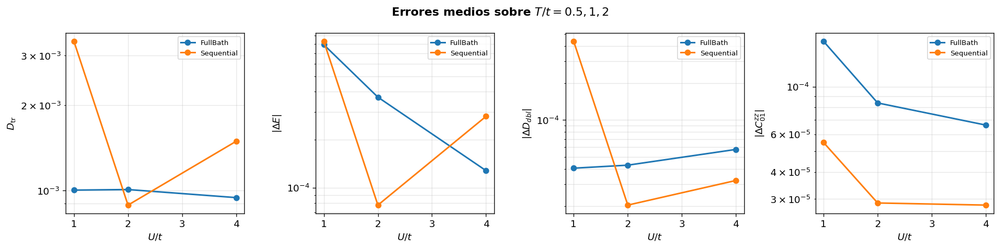

In [104]:
df_err = df_obs[df_obs["protocol"] != "Gibbs"].copy()

fig, axes = plt.subplots(1, 4, figsize=(16, 4))

err_specs = [
    ("Dtr", r"$D_{\rm tr}$"),
    ("abs_Delta_E", r"$|\Delta E|$"),
    ("abs_Delta_D", r"$|\Delta D_{dbl}|$"),
    ("abs_Delta_Czz", r"$|\Delta C^{zz}_{01}|$"),
]

for ax, (col, ylabel) in zip(axes, err_specs):
    for protocol in ["FullBath", "Sequential"]:
        dfp = df_err[df_err["protocol"] == protocol]
        grouped = dfp.groupby("U")[col].mean().reset_index()

        ax.plot(
            grouped["U"],
            grouped[col],
            "o-",
            label=protocol,
        )

    ax.set_yscale("log")
    ax.set_xlabel("$U/t$")
    ax.set_ylabel(ylabel)
    ax.grid(alpha=0.3, which="both")
    ax.legend(fontsize=8)

plt.suptitle("Errores medios sobre $T/t=0.5,1,2$", fontweight="bold")
plt.tight_layout()
plt.show()

La comparación debe interpretarse dentro del flujo global con $\mu=0$. Para observables específicamente asociados a half-filling o régimen Mott, usamos el análisis canónico de A.8.

## A.8 Variante canónica a half-filling

Hasta ahora el flujo principal ha usado el Gibbs global con $\mu=0$. Esa elección es natural para los acoplos tipo Paper, $$A_q=\frac{Z_q+Y_q}{\sqrt{2}}$$, porque no conservan necesariamente el número total de partículas.

En esta sección estudiamos una variante distinta: fijamos el sector canónico

$$
N=L,
$$

que corresponde a half-filling.

Esta variante permite analizar de forma más limpia operadores que conservan $N$ y rasgos físicos asociados al régimen Mott, como la supresión de doble ocupación y las correlaciones de spin.

### Proyección al sector $N=L$

Primero definimos las herramientas para trabajar dentro del sector de half-filling.

Usaremos el proyector $P_N$ para construir estados, operadores y diagnósticos restringidos al sector $N=L.$ También medimos el peso $\mathrm{Tr}(P_N\rho)$ para comprobar si la dinámica permanece dentro del sector canónico.

### A.8.1 Ensembles térmicos: $\mu=0$, $N=L$ y $\mu=U/2$

Comparamos tres referencias térmicas:

1. Gibbs global con $\mu=0$;
2. Gibbs canónico restringido a $N=L$;
3. Gibbs grand-canonical con $\mu=U/2$.

Estos tres estados no son equivalentes. El primero es el target del flujo principal. El segundo fija exactamente half-filling. El tercero aproxima half-filling en promedio, pero todavía permite fluctuaciones de número de partículas.

In [3]:
# A1b — Comparación de referencias térmicas: μ=0, canónico y μ=U/2

def reference_ensembles_fh(n_sites=2, t=1.0, U=4.0, beta=2.0, bonds=None):
    if bonds is None:
        bonds = [(i, i + 1) for i in range(n_sites - 1)]

    # 1) Modelo base usado en el notebook: μ=0
    model_mu0 = FermiHubbardJW(n_sites=n_sites, bonds=bonds, t=t, U=U, mu=0.0)
    rho_mu0 = model_mu0.gibbs_state(beta)

    # 2) Mismo Hamiltoniano, pero restringido a half-filling
    N_half = n_sites
    rho_can = model_mu0.gibbs_state(beta, N_sector=N_half)

    # 3) Grand-canonical con μ=U/2
    model_ph = FermiHubbardJW(n_sites=n_sites, bonds=bonds, t=t, U=U, mu=U / 2)
    rho_ph = model_ph.gibbs_state(beta)

    rows = []

    row = model_mu0.summary_row(rho_mu0, label="GC μ=0")
    row["target"] = "global"
    row["mu"] = 0.0
    rows.append(row)

    row = model_mu0.summary_row(rho_can, label=f"Canónico N={N_half}")
    row["target"] = "half-filling exacto"
    row["mu"] = 0.0
    rows.append(row)

    row = model_ph.summary_row(rho_ph, label="GC μ=U/2")
    row["target"] = "half-filling medio"
    row["mu"] = U / 2
    rows.append(row)

    df = pd.DataFrame(rows)

    return model_mu0, model_ph, rho_mu0, rho_can, rho_ph, df


model_mu0_ref, model_ph_ref, rho_mu0_ref, rho_can_ref, rho_ph_ref, df_refs = reference_ensembles_fh(
    n_sites=2,
    t=1.0,
    U=4.0,
    beta=2.0,
    bonds=[(0, 1)],
)

cols = [
    "label", "target", "mu",
    "E", "K", "U_D", "N", "Sz", "D_avg",
    "Czz_01", "Czz_01_conn", "Cnn_01_conn", "MI_01", "S",
]

display(df_refs[cols].round(6))

print("Distancias entre referencias, todas embebidas en el Hilbert del dímero:")
print(f"D(GC μ=0, canónico N=2) = {trace_distance(rho_mu0_ref, rho_can_ref):.6f}")

# Cuidado: rho_ph_ref pertenece al Hamiltoniano con μ=U/2, pero vive en el mismo Hilbert.
print(f"D(GC μ=0, GC μ=U/2)   = {trace_distance(rho_mu0_ref, rho_ph_ref):.6f}")
print(f"D(canónico, GC μ=U/2) = {trace_distance(rho_can_ref, rho_ph_ref):.6f}")

,label,target,mu,E,K,U_D,N,Sz,D_avg,Czz_01,Czz_01_conn,Cnn_01_conn,MI_01,S
0,GC μ=0,global,0.0,-0.775146,-0.902442,0.127296,1.298526,-0.0,0.015912,-0.035756,-0.035756,-0.113475,0.678845,1.640062
1,Canónico N=2,half-filling exacto,0.0,-0.526692,-0.899450,0.372758,2.000000,0.0,0.046595,-0.105390,-0.105390,-0.093190,0.950002,1.056004
2,GC μ=U/2,half-filling medio,2.0,-4.428402,-0.903429,0.475026,2.000000,-0.0,0.059378,-0.098777,-0.098777,-0.087265,0.797783,1.317392


Distancias entre referencias, todas embebidas en el Hilbert del dímero:
D(GC μ=0, canónico N=2) = 0.660732
D(GC μ=0, GC μ=U/2)   = 0.629148
D(canónico, GC μ=U/2) = 0.062754


### A.8.2 Operadores que conservan $N$

En el flujo global con $\mu=0$, los operadores tipo Paper son útiles porque mezclan sectores de número de partículas.

En half-filling canónico ocurre lo contrario: el target vive dentro de $N=L$, así que conviene usar operadores que no saquen al sistema de ese sector.

Comparamos familias físicas de Hubbard, como carga, spin y hopping, proyectadas al sector $N=L$. La familia `Hubbard: ALL` combina información diagonal y transiciones internas del sector, y por eso es la opción más natural para esta variante.

In [6]:
# ============================================================
# A1f — Diagnóstico de fuga fuera del sector half-filling
# ============================================================

dimer_op = FermiHubbardJW(n_sites=2, bonds=[(0, 1)], t=1.0, U=4.0, mu=0.0)
N_hf = half_filling_N(dimer_op)

operator_families_hf = {
    "Paper: (Z+Y)/√2": fhm.build_coupling_ops_paper(dimer_op),
    "Pauli: X": fhm.build_coupling_ops_pauli(dimer_op, "X"),
    "Pauli: Y": fhm.build_coupling_ops_pauli(dimer_op, "Y"),
    "Pauli: Z": fhm.build_coupling_ops_pauli(dimer_op, "Z"),
    "Pauli: ZY": fhm.build_coupling_ops_pauli(dimer_op, "ZY"),
    "Hubbard físico": fhm.build_coupling_operators(dimer_op),
    "Hubbard dressed": fhm.build_coupling_ops_dressed(dimer_op),
}

rows_leak = []

Nop = dimer_op.number_operator()

for fam_name, (A_ops, labels) in operator_families_hf.items():
    leaks = []
    comms_N = []
    projected_norms = []

    for A, lab in zip(A_ops, labels):
        leaks.append(leakage_from_sector(A, dimer_op, N_hf))
        comms_N.append(np.linalg.norm(A @ Nop - Nop @ A, ord="fro"))
        projected_norms.append(
            np.linalg.norm(project_operator_to_sector(A, dimer_op, N_hf), ord="fro")
        )

    rows_leak.append({
        "familia": fam_name,
        "n_ops": len(A_ops),
        "leakage_mean": np.mean(leaks),
        "leakage_max": np.max(leaks),
        "comm_N_mean": np.mean(comms_N),
        "projected_norm_sum": np.sum(projected_norms),
        "conserva_sector_N": np.max(leaks) < 1e-10,
    })

df_leak = pd.DataFrame(rows_leak)

display(df_leak.round(6).sort_values(["conserva_sector_N", "leakage_max"], ascending=[False, True]))

print("Lectura:")
print("  - leakage ≈ 0: la familia conserva el sector N=L.")
print("  - leakage grande: la familia saca población de half-filling.")
print("  - Paper funciona bien para Gibbs global, pero no es un acoplo canónico puro.")
print("  - Hubbard físico conserva N y es el candidato natural para análisis half-filling.")

,familia,n_ops,leakage_mean,leakage_max,comm_N_mean,projected_norm_sum,conserva_sector_N
3,Pauli: Z,4,0.000000,0.000000,0.000000,9.797959,True
5,Hubbard físico,6,0.000000,0.000000,0.000000,10.828427,True
0,Paper: (Z+Y)/√2,4,0.707107,0.707107,2.828427,6.928203,False
4,Pauli: ZY,4,0.707107,0.707107,2.828427,6.928203,False
6,Hubbard dressed,6,0.476417,0.774597,1.333333,8.828427,False
1,Pauli: X,4,1.000000,1.000000,4.000000,0.000000,False
2,Pauli: Y,4,1.000000,1.000000,4.000000,0.000000,False


Lectura:
  - leakage ≈ 0: la familia conserva el sector N=L.
  - leakage grande: la familia saca población de half-filling.
  - Paper funciona bien para Gibbs global, pero no es un acoplo canónico puro.
  - Hubbard físico conserva N y es el candidato natural para análisis half-filling.


Target canónico half-filling
N_hf      = 2
E_target  = -0.52669169
Ddbl_tgt  = 0.04659477
Czz_tgt   = -0.10539038
Tr(P_N rho0) = 1.00000000


,familia,n_ops_used,D_final,D_min,cycle_D_min,E_final,|ΔE|,Ddbl_final,|ΔDdbl|,Czz_final,|ΔCzz|,peso_N=2
3,Hubbard: ALL,6,0.090943,0.090864,400,-0.462886,0.063806,0.041741,0.004854,-0.062463,0.042928,1.0
4,Dressed: Hubbard+Y,6,0.091251,0.090837,825,-0.462253,0.064439,0.041522,0.005072,-0.062572,0.042818,1.0
0,Hubbard: charge,2,0.136654,0.136653,1475,-0.411321,0.115371,0.037507,0.009087,-0.064580,0.040811,1.0
1,Hubbard: spin,2,0.258597,0.257640,1450,0.321691,0.848383,0.112989,0.066394,-0.026839,0.078551,1.0
2,Hubbard: hop,2,0.303596,0.302981,1450,-0.272278,0.254414,0.023402,0.023193,-0.071632,0.033758,1.0


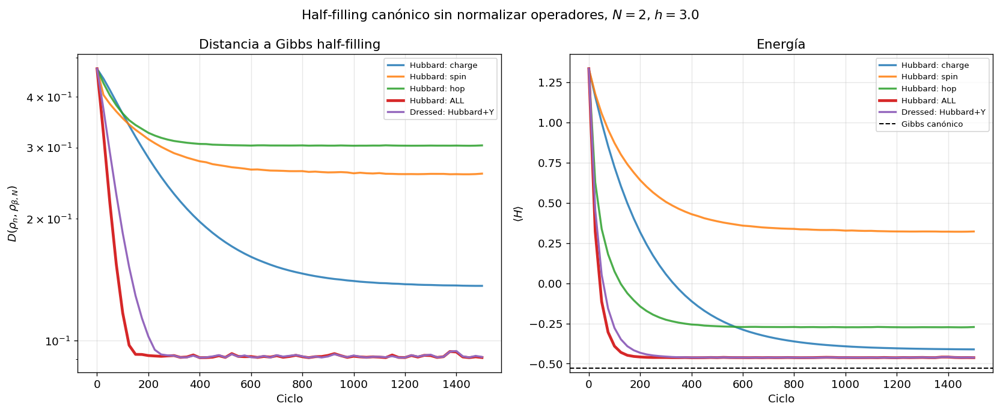

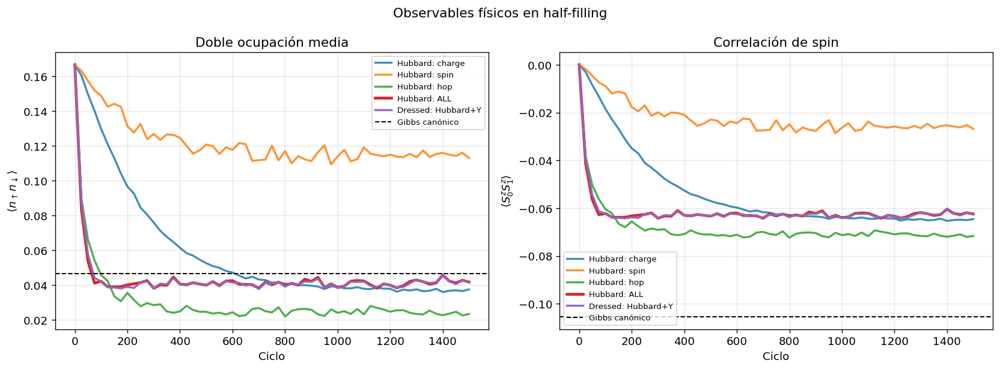

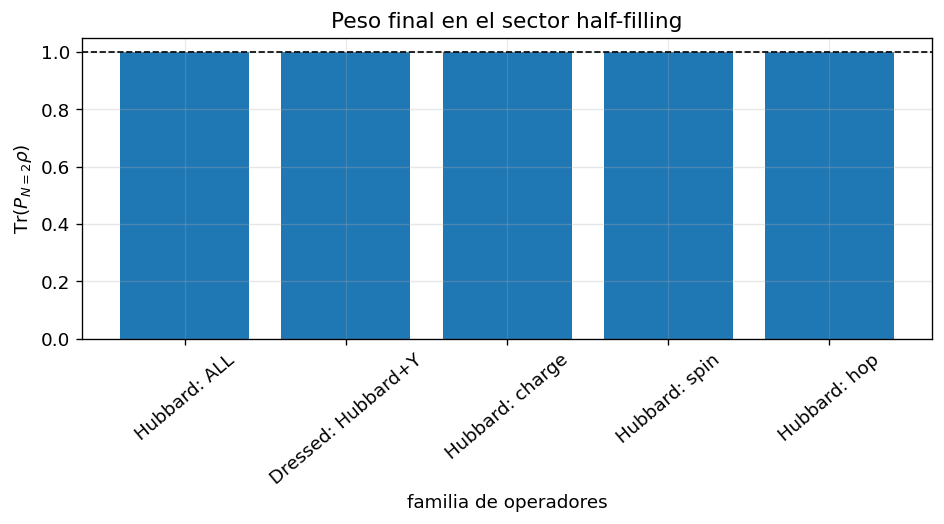

In [14]:
# ============================================================
# A3b definitivo — Comparación de familias half-filling sin normalizar
# ============================================================

# Parámetros físicos del dímero
beta_hf = 2.0
model_hf = FermiHubbardJW(
    n_sites=2,
    bonds=[(0, 1)],
    t=1.0,
    U=4.0,
    mu=0.0,
)

N_hf = hf_N(model_hf)

rho_target_hf = model_hf.gibbs_state(beta_hf, N_sector=N_hf)
rho0_hf = maximally_mixed_sector(model_hf, N_hf)

E_target_hf = model_hf.energy(rho_target_hf)
Ddbl_target_hf = model_hf.avg_double_occupancy(rho_target_hf)
Czz_target_hf = model_hf.spin_correlation(rho_target_hf, 0, 1)

print("Target canónico half-filling")
print(f"N_hf      = {N_hf}")
print(f"E_target  = {E_target_hf:.8f}")
print(f"Ddbl_tgt  = {Ddbl_target_hf:.8f}")
print(f"Czz_tgt   = {Czz_target_hf:.8f}")
print(f"Tr(P_N rho0) = {sector_weight(model_hf, rho0_hf, N_hf):.8f}")


# ------------------------------------------------------------
# Construcción de familias físicas
# ------------------------------------------------------------

ops_all_raw, labs_all_raw = fhm.build_coupling_operators(model_hf)

ops_charge_raw = [
    A for A, lab in zip(ops_all_raw, labs_all_raw)
    if lab.startswith("charge")
]
labs_charge_raw = [
    lab for lab in labs_all_raw
    if lab.startswith("charge")
]

ops_spin_raw = [
    A for A, lab in zip(ops_all_raw, labs_all_raw)
    if lab.startswith("spin")
]
labs_spin_raw = [
    lab for lab in labs_all_raw
    if lab.startswith("spin")
]

ops_hop_raw = [
    A for A, lab in zip(ops_all_raw, labs_all_raw)
    if lab.startswith("hop")
]
labs_hop_raw = [
    lab for lab in labs_all_raw
    if lab.startswith("hop")
]

ops_dressed_raw, labs_dressed_raw = fhm.build_coupling_ops_dressed(model_hf)

families_hf = {
    "Hubbard: charge": (ops_charge_raw, labs_charge_raw),
    "Hubbard: spin": (ops_spin_raw, labs_spin_raw),
    "Hubbard: hop": (ops_hop_raw, labs_hop_raw),
    "Hubbard: ALL": (ops_all_raw, labs_all_raw),
    "Dressed: Hubbard+Y": (ops_dressed_raw, labs_dressed_raw),
}


# ------------------------------------------------------------
# Parámetros definitivos para U/t=4, beta=2
# ------------------------------------------------------------

params_hf = dict(
    beta=beta_hf,
    h_bath=3.0,
    theta=0.18,
    delta=0.15,
    M_T=24,
    n_cycles=1500,
    record_every=25,
    seed=123,
)


# ------------------------------------------------------------
# Ejecución
# ------------------------------------------------------------

results_hf = {}
rows_hf = []

for fam_name, (A_raw, labs_raw) in families_hf.items():

    out = run_hf_protocol_no_norm(
        model_hf,
        A_raw,
        labs_raw,
        **params_hf,
    )

    results_hf[fam_name] = out

    rho_f = out["rho_final"]

    rows_hf.append({
        "familia": fam_name,
        "n_ops_used": len(out["A_labels_used"]),
        "D_final": out["D_can"][-1],
        "D_min": np.min(out["D_can"]),
        "cycle_D_min": out["cycles"][np.argmin(out["D_can"])],
        "E_final": out["E_hist"][-1],
        "|ΔE|": abs(out["E_hist"][-1] - E_target_hf),
        "Ddbl_final": out["Ddbl_hist"][-1],
        "|ΔDdbl|": abs(out["Ddbl_hist"][-1] - Ddbl_target_hf),
        "Czz_final": out["Czz_hist"][-1],
        "|ΔCzz|": abs(out["Czz_hist"][-1] - Czz_target_hf),
        f"peso_N={N_hf}": out["W_hist"][-1],
    })

df_hf_families = pd.DataFrame(rows_hf).sort_values("D_final")
display(df_hf_families.round(6))


# ------------------------------------------------------------
# Plot principal: distancia y energía
# ------------------------------------------------------------

fig, axes = plt.subplots(1, 2, figsize=(14, 5.8))

for fam_name, out in results_hf.items():

    lw = 2.8 if fam_name == "Hubbard: ALL" else 2.0
    alpha = 1.0 if fam_name in ["Hubbard: ALL", "Dressed: Hubbard+Y"] else 0.85

    axes[0].semilogy(
        out["cycles"],
        out["D_can"],
        lw=lw,
        alpha=alpha,
        label=fam_name,
    )

    axes[1].plot(
        out["cycles"],
        out["E_hist"],
        lw=lw,
        alpha=alpha,
        label=fam_name,
    )

axes[1].axhline(
    E_target_hf,
    color="k",
    ls="--",
    lw=1.2,
    label="Gibbs canónico",
)

axes[0].set(
    xlabel="Ciclo",
    ylabel="$D(\\rho_n,\\rho_{\\beta,N})$",
    title="Distancia a Gibbs half-filling",
)

axes[1].set(
    xlabel="Ciclo",
    ylabel="$\\langle H \\rangle$",
    title="Energía",
)

for ax in axes:
    ax.grid(alpha=0.3)
    ax.legend(fontsize=8)

plt.suptitle(
    f"Half-filling canónico sin normalizar operadores, $N={N_hf}$, $h={params_hf['h_bath']}$",
    fontsize=13,
)

plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# Plot de observables físicos: doble ocupación y spin
# ------------------------------------------------------------

fig, axes = plt.subplots(1, 2, figsize=(14, 5.2))

for fam_name, out in results_hf.items():

    lw = 2.8 if fam_name == "Hubbard: ALL" else 2.0
    alpha = 1.0 if fam_name in ["Hubbard: ALL", "Dressed: Hubbard+Y"] else 0.85

    axes[0].plot(
        out["cycles"],
        out["Ddbl_hist"],
        lw=lw,
        alpha=alpha,
        label=fam_name,
    )

    axes[1].plot(
        out["cycles"],
        out["Czz_hist"],
        lw=lw,
        alpha=alpha,
        label=fam_name,
    )

axes[0].axhline(
    Ddbl_target_hf,
    color="k",
    ls="--",
    lw=1.2,
    label="Gibbs canónico",
)

axes[1].axhline(
    Czz_target_hf,
    color="k",
    ls="--",
    lw=1.2,
    label="Gibbs canónico",
)

axes[0].set(
    xlabel="Ciclo",
    ylabel="$\\langle n_{\\uparrow}n_{\\downarrow}\\rangle$",
    title="Doble ocupación media",
)

axes[1].set(
    xlabel="Ciclo",
    ylabel="$\\langle S^z_0 S^z_1\\rangle$",
    title="Correlación de spin",
)

for ax in axes:
    ax.grid(alpha=0.3)
    ax.legend(fontsize=8)

plt.suptitle("Observables físicos en half-filling", fontsize=13)
plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# Peso en el sector
# ------------------------------------------------------------

fig, ax = plt.subplots(figsize=(8, 4.5))

df_plot = df_hf_families.copy()

ax.bar(
    df_plot["familia"],
    df_plot[f"peso_N={N_hf}"],
)

ax.axhline(1.0, color="k", ls="--", lw=1)

ax.set(
    xlabel="familia de operadores",
    ylabel=f"$\\mathrm{{Tr}}(P_{{N={N_hf}}}\\rho)$",
    title="Peso final en el sector half-filling",
)

ax.tick_params(axis="x", rotation=40)
ax.grid(alpha=0.3, axis="y")

plt.tight_layout()
plt.show()

En half-filling el target vive dentro del sector $N=L$, así que los operadores de acoplo deben respetar ese sector.

Las familias `charge`, `spin` y `hop` por separado no bastan: las dos primeras son principalmente diagonales y el hopping mezcla configuraciones, pero no captura toda la estructura del canal.

La combinación `Hubbard: ALL` es la opción más natural porque junta términos diagonales y transiciones físicas dentro de $N=L$. Por eso converge mejor.

`Dressed: Hubbard+Y` da un resultado muy parecido porque, al proyectar a $N=L$, los términos locales $Y$ que cambian el número de partículas pierden efecto directo. En esta sección se usa como control, no como una mejora independiente.

El peso en $N=L$ permanece cercano a $1$, así que la dinámica no fuga fuera del sector canónico.


El acoplo Paper es natural para Gibbs global, pero no para Gibbs canónico half-filling porque rompe $N$.

Comparamos dos casos:

- `Paper`, como control que rompe el número de partículas y puede sacar al sistema del sector $N=L$.
- `Hubbard: ALL` proyectado, como familia física que mantiene la dinámica dentro de half-filling.

El objetivo no es optimizar el protocolo, sino mostrar de forma clara por qué la preparación canónica debe hacerse con operadores proyectados al sector.



In [17]:
# ============================================================
# A7c — Diagnóstico mínimo actualizado de half-filling
# ============================================================

def run_half_filling_diagnostic_updated(
    U=4.0,
    beta=2.0,
    n_cycles=600,
    theta=0.18,
    h_bath=3.0,
    delta=0.15,
    M_T=24,
    seed=123,
):
    model = FermiHubbardJW(n_sites=2, bonds=[(0, 1)], t=1.0, U=U, mu=0.0)
    N_half = hf_N(model)

    rho_gc = model.gibbs_state(beta)
    rho_can = model.gibbs_state(beta, N_sector=N_half)
    rho_init_half = maximally_mixed_sector(model, N_half)

    # Control que rompe N
    ops_paper, labs_paper = fhm.build_coupling_ops_paper(model)

    # Familia física principal en half-filling
    ops_all_raw, labs_all_raw = fhm.build_coupling_operators(model)
    ops_all_proj, labs_all_proj, _ = project_family_no_norm(
        ops_all_raw, labs_all_raw, model, N_half
    )

    families = {
        "Paper (control, rompe N)": (ops_paper, labs_paper),
        "Hubbard: ALL proyectado": (ops_all_proj, labs_all_proj),
    }

    rows = []

    for fam_name, (A_ops, labels) in families.items():
        proto = ThermalProtocolSequential(
            model,
            A_ops=A_ops,
            labels=labels,
            h_bath=h_bath,
            beta=beta,
            theta=theta,
            delta=delta,
            M_T=M_T,
            random_order=True,
            random_evolution=True,
        )

        out = proto.run(
            n_cycles=n_cycles,
            rho_init=rho_init_half,
            verbose=False,
            record_every=max(1, n_cycles // 20),
            seed=seed,
        )

        rho_f = out["rho_final"]

        row = model.summary_row(rho_f, label=fam_name)
        row["U"] = U
        row["D_to_GC_mu0"] = trace_distance(rho_f, rho_gc)
        row["D_to_can_Nhalf"] = trace_distance(rho_f, rho_can)
        row["weight_half_filling"] = sector_weight(model, rho_f, N_half)
        row["|N-Nhalf|"] = abs(model.total_number(rho_f) - N_half)
        rows.append(row)

    return pd.DataFrame(rows)


df_half_diag = pd.concat([
    run_half_filling_diagnostic_updated(U=4.0, beta=2.0),
    run_half_filling_diagnostic_updated(U=8.0, beta=2.0),
], ignore_index=True)

display(
    df_half_diag[
        [
            "U", "label",
            "D_to_GC_mu0", "D_to_can_Nhalf",
            "weight_half_filling", "|N-Nhalf|",
            "E", "N", "D_avg", "Czz_01_conn"
        ]
    ].round(6)
)

,U,label,D_to_GC_mu0,D_to_can_Nhalf,weight_half_filling,|N-Nhalf|,E,N,D_avg,Czz_01_conn
0,4.0,"Paper (control, rompe N)",0.015269,0.659743,0.340448,0.700153,-0.771248,1.299847,0.015786,-0.035096
1,4.0,Hubbard: ALL proyectado,0.660732,0.091437,1.000000,0.000000,-0.462587,2.000000,0.042573,-0.062047
2,8.0,"Paper (control, rompe N)",0.122486,0.753890,0.257299,0.568177,0.224690,1.431823,0.062061,-0.012372
3,8.0,Hubbard: ALL proyectado,0.742321,0.211365,1.000000,0.000000,1.566336,2.000000,0.112450,-0.027108


### A.8.3 Barrido de $h$ para `Hubbard: ALL`

Una vez elegida la familia `Hubbard: ALL`, ajustamos la escala energética del baño.

El parámetro $h$ controla qué transiciones del sistema acopla mejor el filtro temporal. En half-filling, el target es el Gibbs canónico en $N=L$, así que no basta usar los parámetros del flujo global con $\mu=0$.

En este barrido mantenemos fijos $\theta$, $\delta$ y $M_T$, y variamos solo $h$. Los operadores se proyectan al sector $N=L$ sin renormalizarlos de nuevo, para conservar las escalas relativas de carga, spin y hopping.

,h,D_final,D_min,cycle_D_min,E_final,|ΔE|,Ddbl_final,|ΔDdbl|,Czz_final,|ΔCzz|,peso_N=2
2,2.0,0.091068,0.090813,825,-0.462901,0.063791,0.039664,0.006930,-0.063501,0.041889,1.0
3,3.0,0.091605,0.090864,400,-0.462413,0.064278,0.038644,0.007951,-0.064012,0.041379,1.0
4,4.0,0.091947,0.090824,825,-0.462322,0.064370,0.038970,0.007625,-0.063849,0.041542,1.0
5,6.0,0.092810,0.090758,825,-0.461493,0.065199,0.040639,0.005956,-0.063014,0.042377,1.0
6,8.0,0.097219,0.097094,975,-0.445850,0.080842,0.040689,0.005905,-0.062989,0.042402,1.0
1,1.0,0.274477,0.274477,1000,0.425026,0.951718,0.119269,0.072674,-0.023699,0.081691,1.0
0,0.5,0.423921,0.423921,1000,1.145160,1.671852,0.183237,0.136642,0.008285,0.113675,1.0


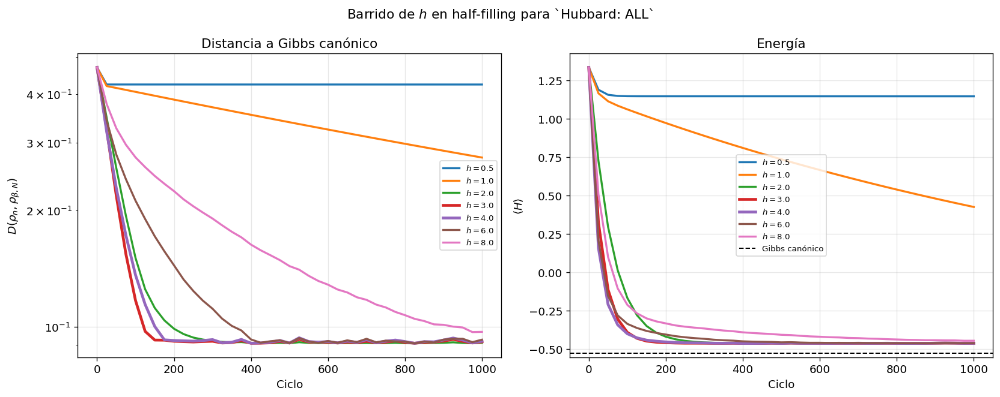

Mejor h por distancia final: h = 2.0


In [15]:
# ============================================================
# A3c definitivo — Barrido de h para Hubbard ALL sin normalizar
# ============================================================

h_grid_hf = [0.5, 1.0, 2.0, 3.0, 4.0, 6.0, 8.0]

scan_h_results = {}
scan_h_rows = []

for h_val in h_grid_hf:

    out = run_hf_protocol_no_norm(
        model_hf,
        ops_all_raw,
        labs_all_raw,
        beta=beta_hf,
        h_bath=float(h_val),
        theta=0.18,
        delta=0.15,
        M_T=24,
        n_cycles=1000,
        record_every=25,
        seed=123,
    )

    scan_h_results[h_val] = out

    scan_h_rows.append({
        "h": h_val,
        "D_final": out["D_can"][-1],
        "D_min": np.min(out["D_can"]),
        "cycle_D_min": out["cycles"][np.argmin(out["D_can"])],
        "E_final": out["E_hist"][-1],
        "|ΔE|": abs(out["E_hist"][-1] - E_target_hf),
        "Ddbl_final": out["Ddbl_hist"][-1],
        "|ΔDdbl|": abs(out["Ddbl_hist"][-1] - Ddbl_target_hf),
        "Czz_final": out["Czz_hist"][-1],
        "|ΔCzz|": abs(out["Czz_hist"][-1] - Czz_target_hf),
        f"peso_N={N_hf}": out["W_hist"][-1],
    })

df_h_scan_hf = pd.DataFrame(scan_h_rows).sort_values("D_final")
display(df_h_scan_hf.round(6))


fig, axes = plt.subplots(1, 2, figsize=(14, 5.6))

for h_val, out in scan_h_results.items():

    lw = 2.8 if h_val in [3.0, 4.0] else 2.0

    axes[0].semilogy(
        out["cycles"],
        out["D_can"],
        lw=lw,
        label=f"$h={h_val}$",
    )

    axes[1].plot(
        out["cycles"],
        out["E_hist"],
        lw=lw,
        label=f"$h={h_val}$",
    )

axes[1].axhline(
    E_target_hf,
    color="k",
    ls="--",
    lw=1.2,
    label="Gibbs canónico",
)

axes[0].set(
    xlabel="Ciclo",
    ylabel="$D(\\rho_n,\\rho_{\\beta,N})$",
    title="Distancia a Gibbs canónico",
)

axes[1].set(
    xlabel="Ciclo",
    ylabel="$\\langle H \\rangle$",
    title="Energía",
)

for ax in axes:
    ax.grid(alpha=0.3)
    ax.legend(fontsize=8)

plt.suptitle("Barrido de $h$ en half-filling para `Hubbard: ALL`", fontsize=13)
plt.tight_layout()
plt.show()


best_h = float(df_h_scan_hf.iloc[0]["h"])

print(f"Mejor h por distancia final: h = {best_h}")

 El valor de $h$ cambia mucho la velocidad de convergencia. Valores demasiado pequeños no resuelven bien las transiciones relevantes del sector canónico, mientras que valores intermedios producen una caída rápida de la distancia al Gibbs.

En este caso, $h=3$ y $h=4$ son los valores más eficaces. A partir de ahí la mejora se satura: aumentar $h$ no garantiza acercarse más al target.

### A.8.4 Régimen Mott en half-filling

Para discutir el régimen Mott usamos el Gibbs canónico en el sector $N=L$.

Al aumentar $U/t$, la doble ocupación se penaliza y el sistema tiende a formar momentos locales. En ese régimen la dinámica de spin queda controlada por la escala de superintercambio

$$
J_{\rm spin}=\frac{4t^2}{U}.
$$

En el dímero no hay transición de fase, sino un cruce hacia un régimen más correlacionado. Por eso comparamos el Gibbs global con $\mu=0$, el Gibbs grand-canonical con $\mu=U/2$ y el Gibbs canónico $N=L$.

,U/t,J_spin=4t²/U,E_mu0,E_ph,E_hf,N_mu0,N_ph,N_hf,D_mu0,D_ph,D_hf,Czz_mu0,Czz_ph,Czz_hf,MI_mu0,MI_ph,MI_hf,D_trace_mu0_vs_hf,D_trace_ph_vs_hf
0,0.5,8.000000,-1.300151,-1.787316,-1.601117,1.810299,2.0,2.0,0.178390,0.222881,0.204263,-0.076798,-0.080506,-0.121231,1.261491,1.300623,2.315725,0.366516,0.335931
1,1.0,4.000000,-1.130991,-2.080348,-1.366028,1.659352,2.0,2.0,0.123015,0.195551,0.169050,-0.074584,-0.088139,-0.126802,1.151367,1.269131,2.145261,0.411806,0.304909
2,2.0,2.000000,-0.924058,-2.757907,-0.982201,1.462288,2.0,2.0,0.057231,0.141413,0.110780,-0.060700,-0.099770,-0.127350,0.917315,1.150061,1.709264,0.523358,0.216567
3,4.0,1.000000,-0.775146,-4.428402,-0.526692,1.298526,2.0,2.0,0.015912,0.059378,0.046595,-0.035756,-0.098777,-0.105390,0.678845,0.797783,0.950002,0.660732,0.062754
4,6.0,0.666667,-0.738187,-6.292442,-0.319779,1.239104,2.0,2.0,0.006293,0.024817,0.022174,-0.023155,-0.080664,-0.081611,0.613172,0.504800,0.539313,0.716274,0.011601
5,8.0,0.500000,-0.727172,-8.212000,-0.217886,1.211425,2.0,2.0,0.003139,0.012611,0.012180,-0.016596,-0.064290,-0.064407,0.594903,0.326350,0.333614,0.742321,0.001809
6,12.0,0.333333,-0.721694,-12.126213,-0.126408,1.186706,2.0,2.0,0.001171,0.005006,0.004997,-0.010313,-0.043993,-0.043995,0.588994,0.158740,0.158997,0.765590,0.000038
7,16.0,0.250000,-0.720825,-16.086890,-0.086895,1.175792,2.0,2.0,0.000590,0.002635,0.002634,-0.007395,-0.032992,-0.032992,0.590579,0.091955,0.091963,0.775864,0.000001


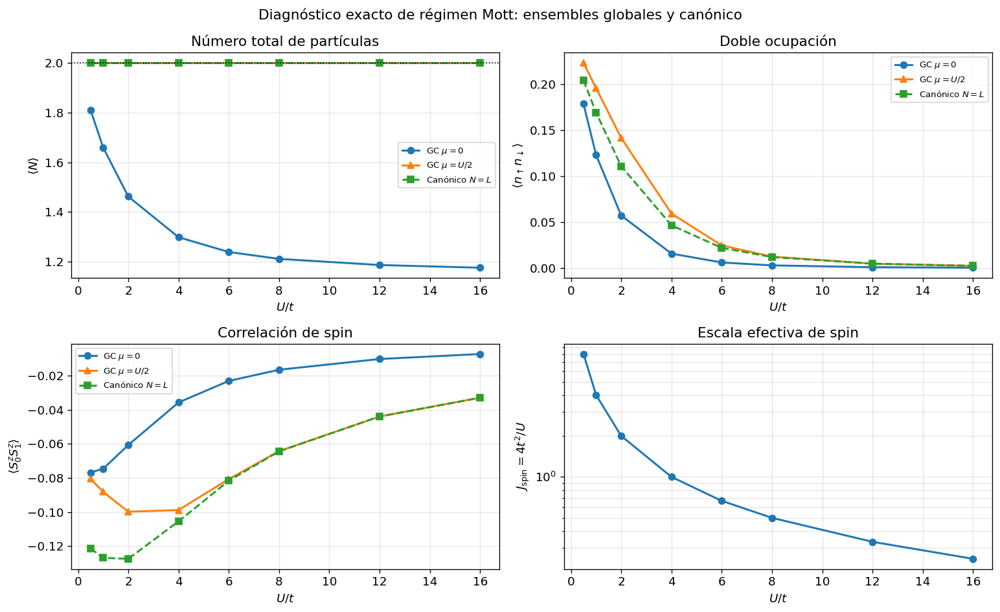

Lectura:
  - El Gibbs global con μ=0 no mantiene half-filling y desplaza <N> por debajo de L al aumentar U/t.
  - El Gibbs global con μ=U/2 mantiene half-filling en promedio, <N>≈L.
  - El ensemble canónico fija exactamente N=L y elimina fluctuaciones de número.
  - Para discutir Mott en sistemas pequeños, el sector canónico N=L es la referencia más limpia.
  - En half-filling, al crecer U/t se suprime la doble ocupación y la escala baja de spin es J_spin=4t²/U.


In [19]:
# ============================================================
# A4.1b — Diagnóstico exacto Mott: μ=0, μ=U/2 y half-filling canónico
# ============================================================

U_mott = np.array([0.5, 1, 2, 4, 6, 8, 12, 16], dtype=float)
beta_mott = 2.0
t_mott = 1.0

rows_mott = []

for U in U_mott:
    # Grand-canonical μ=0
    m_mu0 = FermiHubbardJW(
        n_sites=2,
        bonds=[(0, 1)],
        t=t_mott,
        U=float(U),
        mu=0.0,
    )

    # Grand-canonical particle-hole symmetric μ=U/2
    m_ph = FermiHubbardJW(
        n_sites=2,
        bonds=[(0, 1)],
        t=t_mott,
        U=float(U),
        mu=float(U) / 2.0,
    )

    N_hf = hf_N(m_mu0)

    rho_mu0 = m_mu0.gibbs_state(beta_mott)
    rho_ph = m_ph.gibbs_state(beta_mott)
    rho_hf = m_mu0.gibbs_state(beta_mott, N_sector=N_hf)

    rows_mott.append({
        "U/t": U,
        "J_spin=4t²/U": 4.0 * t_mott**2 / U,

        "E_mu0": m_mu0.energy(rho_mu0),
        "E_ph": m_ph.energy(rho_ph),
        "E_hf": m_mu0.energy(rho_hf),

        "N_mu0": m_mu0.total_number(rho_mu0),
        "N_ph": m_ph.total_number(rho_ph),
        "N_hf": m_mu0.total_number(rho_hf),

        "D_mu0": m_mu0.avg_double_occupancy(rho_mu0),
        "D_ph": m_ph.avg_double_occupancy(rho_ph),
        "D_hf": m_mu0.avg_double_occupancy(rho_hf),

        "Czz_mu0": m_mu0.spin_correlation(rho_mu0, 0, 1),
        "Czz_ph": m_ph.spin_correlation(rho_ph, 0, 1),
        "Czz_hf": m_mu0.spin_correlation(rho_hf, 0, 1),

        "MI_mu0": m_mu0.site_mutual_information(rho_mu0, 0, 1),
        "MI_ph": m_ph.site_mutual_information(rho_ph, 0, 1),
        "MI_hf": m_mu0.site_mutual_information(rho_hf, 0, 1),

        "D_trace_mu0_vs_hf": trace_distance(rho_mu0, rho_hf),
        "D_trace_ph_vs_hf": trace_distance(rho_ph, rho_hf),
    })

df_mott = pd.DataFrame(rows_mott)

display(df_mott.round(6))


fig, axes = plt.subplots(2, 2, figsize=(13, 8))

# ------------------------------------------------------------
# Número total
# ------------------------------------------------------------
axes[0, 0].plot(
    df_mott["U/t"],
    df_mott["N_mu0"],
    "o-",
    label="GC $\\mu=0$",
)

axes[0, 0].plot(
    df_mott["U/t"],
    df_mott["N_ph"],
    "^-",
    label="GC $\\mu=U/2$",
)

axes[0, 0].plot(
    df_mott["U/t"],
    df_mott["N_hf"],
    "s--",
    label="Canónico $N=L$",
)

axes[0, 0].axhline(2.0, color="k", linestyle=":", linewidth=1)

axes[0, 0].set(
    xlabel="$U/t$",
    ylabel="$\\langle N\\rangle$",
    title="Número total de partículas",
)

axes[0, 0].legend(fontsize=8)
axes[0, 0].grid(alpha=0.3)


# ------------------------------------------------------------
# Doble ocupación
# ------------------------------------------------------------
axes[0, 1].plot(
    df_mott["U/t"],
    df_mott["D_mu0"],
    "o-",
    label="GC $\\mu=0$",
)

axes[0, 1].plot(
    df_mott["U/t"],
    df_mott["D_ph"],
    "^-",
    label="GC $\\mu=U/2$",
)

axes[0, 1].plot(
    df_mott["U/t"],
    df_mott["D_hf"],
    "s--",
    label="Canónico $N=L$",
)

axes[0, 1].set(
    xlabel="$U/t$",
    ylabel="$\\langle n_{\\uparrow}n_{\\downarrow}\\rangle$",
    title="Doble ocupación",
)

axes[0, 1].legend(fontsize=8)
axes[0, 1].grid(alpha=0.3)


# ------------------------------------------------------------
# Correlación de spin
# ------------------------------------------------------------
axes[1, 0].plot(
    df_mott["U/t"],
    df_mott["Czz_mu0"],
    "o-",
    label="GC $\\mu=0$",
)

axes[1, 0].plot(
    df_mott["U/t"],
    df_mott["Czz_ph"],
    "^-",
    label="GC $\\mu=U/2$",
)

axes[1, 0].plot(
    df_mott["U/t"],
    df_mott["Czz_hf"],
    "s--",
    label="Canónico $N=L$",
)

axes[1, 0].set(
    xlabel="$U/t$",
    ylabel="$\\langle S^z_0 S^z_1\\rangle$",
    title="Correlación de spin",
)

axes[1, 0].legend(fontsize=8)
axes[1, 0].grid(alpha=0.3)


# ------------------------------------------------------------
# Escala efectiva de spin
# ------------------------------------------------------------
axes[1, 1].semilogy(
    df_mott["U/t"],
    df_mott["J_spin=4t²/U"],
    "o-",
)

axes[1, 1].set(
    xlabel="$U/t$",
    ylabel="$J_{\\rm spin}=4t^2/U$",
    title="Escala efectiva de spin",
)

axes[1, 1].grid(alpha=0.3, which="both")


plt.suptitle(
    "Diagnóstico exacto de régimen Mott: ensembles globales y canónico",
    fontsize=13,
)

plt.tight_layout()
plt.show()


print("Lectura:")
print("  - El Gibbs global con μ=0 no mantiene half-filling y desplaza <N> por debajo de L al aumentar U/t.")
print("  - El Gibbs global con μ=U/2 mantiene half-filling en promedio, <N>≈L.")
print("  - El ensemble canónico fija exactamente N=L y elimina fluctuaciones de número.")
print("  - Para discutir Mott en sistemas pequeños, el sector canónico N=L es la referencia más limpia.")
print("  - En half-filling, al crecer U/t se suprime la doble ocupación y la escala baja de spin es J_spin=4t²/U.")

El Gibbs canónico en $N=L$ muestra la física Mott de forma más limpia: al crecer $U/t$, baja la doble ocupación y las correlaciones de spin se vuelven más marcadas.

El Gibbs global con $\mu=0$ mezcla sectores de número de partículas, por lo que no aísla igual de bien la física de half-filling. El caso $\mu=U/2$ acerca el número medio de partículas a $N=L$, pero todavía permite fluctuaciones de $N$.

Por tanto, para discutir Mott usamos el ensemble canónico, no el flujo global con $\mu=0$.

### A.8.5 Retuning de la escala del baño

En A.8.3 vimos que el rendimiento del protocolo half-filling depende mucho de $h$.

Aquí comprobamos si un único $h$ fijo sirve para distintos valores de $U/t$, o si hay que reajustarlo al cambiar la interacción.

Comparamos dos estrategias:

1. **sin retuning:** usamos el mismo $h$ para todos los valores de $U/t$;
2. **con retuning:** para cada $U/t$ escogemos el $h$ que minimiza la distancia final al Gibbs canónico.

Mantenemos fijos $\theta$, $\delta$ y $M_T$. Por tanto, este no es un retuning completo del protocolo, sino solo de la escala energética del baño.

In [ ]:
# ============================================================
# A4.1c — Protocolo canónico en half-filling con retuning simple de h
# ============================================================

U_hf_protocol = [2.0, 4.0, 6.0, 8.0, 10.0, 12.0]
beta_hf_protocol = 2.0

rows_hf_protocol = []
res_hf_protocol = {}
h_scans_protocol = {}

for U in U_hf_protocol:
    m = FermiHubbardJW(n_sites=2, bonds=[(0, 1)], t=1.0, U=float(U), mu=0.0)
    N_hf = hf_N(m)
    rho_target = m.gibbs_state(beta_hf_protocol, N_sector=N_hf)

    best_h, out, df_scan = select_best_h_half_filling(
        m,
        beta=beta_hf_protocol,
        h_grid=(1.0, 2.0, 3.0, 4.0, 6.0),
        theta=0.18,
        delta=0.15,
        M_T=24,
        n_cycles=600,
        record_every=50,
        seed=7,
    )

    h_scans_protocol[U] = df_scan
    res_hf_protocol[U] = out

    rho_f = out["rho_final"]

    rows_hf_protocol.append({
        "U/t": U,
        "h_best": best_h,
        "theta": 0.18,
        "delta": 0.15,
        "M_T": 24,

        "D_trace": trace_distance(rho_f, rho_target),

        "E_protocol": m.energy(rho_f),
        "E_target": m.energy(rho_target),
        "abs_Delta_E": abs(m.energy(rho_f) - m.energy(rho_target)),

        "N_protocol": m.total_number(rho_f),
        "weight_half_filling": sector_weight(m, rho_f, N_hf),

        "D_avg_protocol": m.avg_double_occupancy(rho_f),
        "D_avg_target": m.avg_double_occupancy(rho_target),
        "abs_Delta_D": abs(m.avg_double_occupancy(rho_f) - m.avg_double_occupancy(rho_target)),

        "Czz_protocol": m.spin_correlation(rho_f, 0, 1),
        "Czz_target": m.spin_correlation(rho_target, 0, 1),
        "abs_Delta_Czz": abs(m.spin_correlation(rho_f, 0, 1) - m.spin_correlation(rho_target, 0, 1)),
    })

df_hf_protocol = pd.DataFrame(rows_hf_protocol)
display(df_hf_protocol.round(6))

,U/t,h_best,theta,delta,M_T,D_trace,E_protocol,E_target,abs_Delta_E,N_protocol,weight_half_filling,D_avg_protocol,D_avg_target,abs_Delta_D,Czz_protocol,Czz_target,abs_Delta_Czz
0,2.0,1.0,0.18,0.15,24,0.198844,-0.756389,-0.982201,0.225813,2.0,1.0,0.085999,0.110780,0.024781,-0.040334,-0.127350,0.087016
1,4.0,2.0,0.18,0.15,24,0.091121,-0.462825,-0.526692,0.063867,2.0,1.0,0.040705,0.046595,0.005890,-0.062981,-0.105390,0.042409
2,6.0,3.0,0.18,0.15,24,0.020207,-0.307218,-0.319779,0.012561,2.0,1.0,0.022538,0.022174,0.000364,-0.072064,-0.081611,0.009547
3,8.0,4.0,0.18,0.15,24,0.025672,-0.171604,-0.217886,0.046283,2.0,1.0,0.015650,0.012180,0.003470,-0.075508,-0.064407,0.011101
4,10.0,6.0,0.18,0.15,24,0.054759,-0.170565,-0.161253,0.009312,2.0,1.0,0.007577,0.007486,0.000091,-0.079545,-0.052477,0.027069
5,12.0,6.0,0.18,0.15,24,0.092582,0.785579,-0.126408,0.911987,2.0,1.0,0.041884,0.004997,0.036887,-0.062392,-0.043995,0.018397


In [13]:
# ============================================================
# A.8.5.1 — Referencia exacta: Gibbs canónico en half-filling
# ============================================================

U_grid_hf = [2.0, 4.0, 6.0, 8.0, 10.0, 12.0]
beta_hf_ref = 2.0

rows_gibbs_hf = []

for U in U_grid_hf:
    m = FermiHubbardJW(n_sites=2, bonds=[(0, 1)], t=1.0, U=float(U), mu=0.0)
    N_hf = hf_N(m)
    rho_g = m.gibbs_state(beta_hf_ref, N_sector=N_hf)

    rows_gibbs_hf.append({
        "U/t": U,
        "E_gibbs": m.energy(rho_g),
        "Ddbl_gibbs": m.avg_double_occupancy(rho_g),
        "Czz_gibbs": m.spin_correlation(rho_g, 0, 1),
        "weight_N=L": sector_weight(m, rho_g, N_hf),
    })

df_gibbs_hf = pd.DataFrame(rows_gibbs_hf)
display(df_gibbs_hf.round(6))

,U/t,E_gibbs,Ddbl_gibbs,Czz_gibbs,weight_N=L
0,2.0,-0.982201,0.110780,-0.127350,1.0
1,4.0,-0.526692,0.046595,-0.105390,1.0
2,6.0,-0.319779,0.022174,-0.081611,1.0
3,8.0,-0.217886,0.012180,-0.064407,1.0
4,10.0,-0.161253,0.007486,-0.052477,1.0
5,12.0,-0.126408,0.004997,-0.043995,1.0


In [17]:
# ============================================================
# A.8.5.2 — Selección global de (theta, delta, M_T)
# minimizando el error medio tras optimizar h para cada U
# ============================================================

U_fit = [2.0, 4.0, 8.0, 12.0]
beta_fit = 2.0

theta_grid = [0.10, 0.14, 0.18, 0.22]
delta_grid = [0.10, 0.15, 0.20]
MT_grid    = [16, 24, 32]

h_grid_coarse = [0.5, 1, 2, 3, 4, 6, 8, 10, 12]

global_rows = []

for theta in theta_grid:
    for delta in delta_grid:
        for MT in MT_grid:

            D_vals = []
            best_hs = {}

            for U in U_fit:
                m = FermiHubbardJW(
                    n_sites=2,
                    bonds=[(0, 1)],
                    t=1.0,
                    U=float(U),
                    mu=0.0,
                )

                best_h, out_best, df_scan = select_best_h_half_filling(
                    m,
                    beta=beta_fit,
                    h_grid=h_grid_coarse,
                    theta=theta,
                    delta=delta,
                    M_T=MT,
                    n_cycles=800,
                    record_every=50,
                    seed=7,
                )

                D_vals.append(float(df_scan["D_final"].min()))
                best_hs[U] = best_h

            global_rows.append({
                "theta": theta,
                "delta": delta,
                "M_T": MT,
                "mean_D": float(np.mean(D_vals)),
                "max_D": float(np.max(D_vals)),
                "best_hs": best_hs,
            })

df_global_params = pd.DataFrame(global_rows).sort_values(["mean_D", "max_D"])
display(df_global_params.head(10))

,theta,delta,M_T,mean_D,max_D,best_hs
16,0.14,0.20,24,0.097221,0.198813,"{2.0: 1.0, 4.0: 6.0, 8.0: 4.0, 12.0: 8.0}"
19,0.18,0.10,24,0.097231,0.198813,"{2.0: 1.0, 4.0: 6.0, 8.0: 4.0, 12.0: 6.0}"
20,0.18,0.10,32,0.097235,0.198813,"{2.0: 1.0, 4.0: 6.0, 8.0: 4.0, 12.0: 6.0}"
17,0.14,0.20,32,0.097248,0.198813,"{2.0: 1.0, 4.0: 6.0, 8.0: 4.0, 12.0: 8.0}"
21,0.18,0.15,16,0.097250,0.198813,"{2.0: 1.0, 4.0: 4.0, 8.0: 4.0, 12.0: 6.0}"
26,0.18,0.20,32,0.097254,0.198813,"{2.0: 1.0, 4.0: 2.0, 8.0: 4.0, 12.0: 6.0}"
9,0.14,0.10,16,0.097256,0.198831,"{2.0: 1.0, 4.0: 2.0, 8.0: 4.0, 12.0: 8.0}"
28,0.22,0.10,24,0.097259,0.198813,"{2.0: 0.5, 4.0: 6.0, 8.0: 4.0, 12.0: 6.0}"
10,0.14,0.10,24,0.097259,0.198813,"{2.0: 1.0, 4.0: 6.0, 8.0: 4.0, 12.0: 8.0}"
18,0.18,0.10,16,0.097262,0.198852,"{2.0: 1.0, 4.0: 2.0, 8.0: 4.0, 12.0: 6.0}"


In [18]:
# ============================================================
# A.8.5.3 — Comparación final con mejores parámetros globales
# ============================================================

best_global = df_global_params.iloc[0]
theta_star = float(best_global["theta"])
delta_star = float(best_global["delta"])
MT_star    = int(best_global["M_T"])

print("Parámetros globales elegidos:")
print(f"theta* = {theta_star}, delta* = {delta_star}, M_T* = {MT_star}")

U_eval = [2.0, 4.0, 6.0, 8.0, 10.0, 12.0]
beta_eval = 2.0
h_fixed = 3.0

rows_final_hf = []

for U in U_eval:
    m = FermiHubbardJW(n_sites=2, bonds=[(0, 1)], t=1.0, U=float(U), mu=0.0)
    N_hf = hf_N(m)
    rho_target = m.gibbs_state(beta_eval, N_sector=N_hf)

    A_raw, labs_raw = fhm.build_coupling_operators(m)

    # --- h fijo
    out_fixed = run_hf_protocol_no_norm(
        m, A_raw, labs_raw,
        beta=beta_eval,
        h_bath=float(h_fixed),
        theta=theta_star,
        delta=delta_star,
        M_T=MT_star,
        n_cycles=1000,
        record_every=50,
        seed=7,
    )
    rho_fixed = out_fixed["rho_final"]

    # --- h retuned: barrido grueso + fino
    best_h0, _, _ = select_best_h_half_filling(
        m,
        beta=beta_eval,
        h_grid=h_grid_coarse,
        theta=theta_star,
        delta=delta_star,
        M_T=MT_star,
        n_cycles=800,
        record_every=50,
        seed=7,
    )

    h_grid_fine = list(np.round(np.arange(max(0.5, best_h0 - 1.0), best_h0 + 1.01, 0.25), 2))
    best_h, out_ret, _ = select_best_h_half_filling(
        m,
        beta=beta_eval,
        h_grid=h_grid_fine,
        theta=theta_star,
        delta=delta_star,
        M_T=MT_star,
        n_cycles=1000,
        record_every=50,
        seed=7,
    )
    rho_ret = out_ret["rho_final"]

    rows_final_hf.extend([
        {
            "U/t": U,
            "strategy": "Gibbs",
            "h": np.nan,
            "D_trace": 0.0,
            "E": m.energy(rho_target),
            "Ddbl": m.avg_double_occupancy(rho_target),
            "Czz": m.spin_correlation(rho_target, 0, 1),
        },
        {
            "U/t": U,
            "strategy": "h fijo",
            "h": h_fixed,
            "D_trace": trace_distance(rho_fixed, rho_target),
            "E": m.energy(rho_fixed),
            "Ddbl": m.avg_double_occupancy(rho_fixed),
            "Czz": m.spin_correlation(rho_fixed, 0, 1),
        },
        {
            "U/t": U,
            "strategy": "h retuned",
            "h": best_h,
            "D_trace": trace_distance(rho_ret, rho_target),
            "E": m.energy(rho_ret),
            "Ddbl": m.avg_double_occupancy(rho_ret),
            "Czz": m.spin_correlation(rho_ret, 0, 1),
        },
    ])

df_final_hf = pd.DataFrame(rows_final_hf)
display(df_final_hf.round(6))

Parámetros globales elegidos:
theta* = 0.14, delta* = 0.2, M_T* = 24


,U/t,strategy,h,D_trace,E,Ddbl,Czz
0,2.0,Gibbs,NaN,0.000000,-0.982201,0.110780,-0.127350
1,2.0,h fijo,3.00,0.199724,-0.755258,0.082304,-0.042181
2,2.0,h retuned,0.75,0.198813,-0.756590,0.085474,-0.040596
3,4.0,Gibbs,NaN,0.000000,-0.526692,0.046595,-0.105390
4,4.0,h fijo,3.00,0.091703,-0.462574,0.043532,-0.061567
5,4.0,h retuned,6.75,0.092291,-0.450932,0.043687,-0.061490
6,6.0,Gibbs,NaN,0.000000,-0.319779,0.022174,-0.081611
7,6.0,h fijo,3.00,0.019492,-0.307725,0.021264,-0.072701
8,6.0,h retuned,3.25,0.019219,-0.310348,0.020990,-0.072839
9,8.0,Gibbs,NaN,0.000000,-0.217886,0.012180,-0.064407


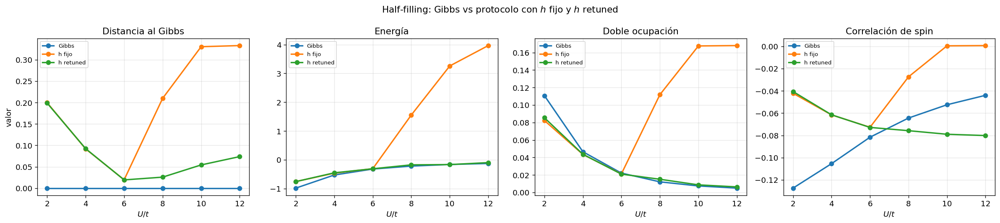

In [27]:
fig, axes = plt.subplots(1, 4, figsize=(20, 4.5))

for strategy, dfp in df_final_hf.groupby("strategy"):
    dfp = dfp.sort_values("U/t")

    axes[0].plot(dfp["U/t"], dfp["D_trace"], "o-", lw=2, label=strategy)
    axes[1].plot(dfp["U/t"], dfp["E"], "o-", lw=2, label=strategy)
    axes[2].plot(dfp["U/t"], dfp["Ddbl"], "o-", lw=2, label=strategy)
    axes[3].plot(dfp["U/t"], dfp["Czz"], "o-", lw=2, label=strategy)

axes[0].set_title("Distancia al Gibbs")
axes[1].set_title("Energía")
axes[2].set_title("Doble ocupación")
axes[3].set_title("Correlación de spin")

axes[0].set_ylabel("valor")

for ax in axes:
    ax.set_xlabel("$U/t$")
    ax.grid(alpha=0.3)
    ax.legend(fontsize=8)

plt.suptitle("Half-filling: Gibbs vs protocolo con $h$ fijo y $h$ retuned", fontsize=13)
plt.tight_layout()
plt.show()

El retuning de $h$ mejora la distancia al Gibbs, la energía y la doble ocupación respecto a usar un $h$ fijo. Sin embargo, la correlación de spin sigue siendo difícil, especialmente en régimen fuerte. Esto indica que ajustar la escala energética del baño ayuda, pero no basta para reproducir toda la física canónica de half-filling.

# B. Capa Qiskit: construcción, ISA y coste

Esta sección traduce el protocolo exacto a circuitos Qiskit.

No intentamos demostrar thermalización grande en hardware. El objetivo es comprobar:

1. que el Hamiltoniano Fermi-Hubbard manual es compatible con Qiskit Nature;
2. cómo se construyen los circuitos `FullBath` y `Sequential`;
3. qué coste tienen en qubits, profundidad, resets y medidas;
4. cómo cambian los recursos tras transpilar a una arquitectura tipo FakeSherbrooke;
5. cómo crece el coste al aumentar `trotter_reps`.

Las mediciones shot-based se estudian después, en la capa C.

In [ ]:
# B0 — Setup Qiskit compacto

qk_model = FermiHubbardJW(n_sites=2, bonds=[(0, 1)], t=1.0, U=4.0)

qk_params = dict(
    beta=2.0,
    h_bath=1.0,
    theta=0.25,
    delta=0.30,
    M_T=2,
    coupling_family="paper",
    trotter_order=2,
    trotter_reps=1,
    optimization_level=1,
)

bundle = get_fh_backend_bundle(min_total_qubits=2 * qk_model.n_qubits)

print(bundle["label"])
print("Noise model disponible:", bundle["have_noise_model"])

FakeSherbrooke (snapshot calibraciones reales)
Noise model disponible: True


## B1. Manual JW vs Qiskit Nature

Primero validamos que nuestro Hamiltoniano manual de Fermi–Hubbard no está usando una convención incompatible con Qiskit. La comparación más robusta es:

- comparar términos Pauli cuando el ordenamiento de orbitales coincide;
- comparar espectros, permitiendo un desplazamiento constante de energía, si Qiskit Nature usa otra convención de orden de espín/orbital.

Si los términos no coinciden pero el espectro sí, normalmente es un problema de ordenamiento de qubits, no de física.

In [ ]:
# B1 — Comparación manual JW vs Qiskit Nature

manual_op = qk_model.as_sparse_pauli_op(include_identity=True).simplify()
native_op = build_qiskit_nature_fh_line(
    n_sites=qk_model.n_sites,
    t=qk_model.t,
    U=qk_model.U,
)

print("Manual terms:", len(manual_op))
display(sparse_op_to_df(manual_op).round(6))

if native_op is not None:
    native_op = native_op.simplify()
    print("Qiskit Nature terms:", len(native_op))
    display(sparse_op_to_df(native_op).round(6))

    H_manual = manual_op.to_matrix()
    H_native = native_op.to_matrix()

    eval_manual = np.sort(np.linalg.eigvalsh(H_manual))
    eval_native = np.sort(np.linalg.eigvalsh(H_native))

    shift = float(np.mean(eval_manual - eval_native))
    spectrum_err = float(np.max(np.abs(eval_manual - (eval_native + shift))))

    print(f"Shift óptimo de energía: {shift:.8f}")
    print(f"Error espectral máximo tras shift: {spectrum_err:.3e}")

    df_compare = pd.DataFrame({
        "E_manual": eval_manual,
        "E_native_shifted": eval_native + shift,
        "diff": eval_manual - (eval_native + shift),
    })
    display(df_compare.round(8))

Manual terms: 11


,pauli,coeff_real,coeff_imag
0,IIII,2.0,0.0
1,IIIZ,-1.0,0.0
2,IIZI,-1.0,0.0
3,IIZZ,1.0,0.0
4,IXZX,-0.5,0.0
5,IYZY,-0.5,0.0
6,IZII,-1.0,0.0
7,XZXI,-0.5,0.0
8,YZYI,-0.5,0.0
9,ZIII,-1.0,0.0


Qiskit Nature terms: 11


,pauli,coeff_real,coeff_imag
0,IIII,2.0,0.0
1,IIIZ,-1.0,0.0
2,IIZI,-1.0,0.0
3,IIZZ,1.0,0.0
4,IXZX,-0.5,0.0
5,IYZY,-0.5,0.0
6,IZII,-1.0,0.0
7,XZXI,-0.5,0.0
8,YZYI,-0.5,0.0
9,ZIII,-1.0,0.0


Shift óptimo de energía: 0.00000000
Error espectral máximo tras shift: 0.000e+00


,E_manual,E_native_shifted,diff
0,-1.000000,-1.000000,0.0
1,-1.000000,-1.000000,0.0
2,-0.828427,-0.828427,0.0
3,0.000000,0.000000,0.0
4,0.000000,0.000000,0.0
5,0.000000,0.000000,0.0
6,0.000000,0.000000,0.0
7,1.000000,1.000000,0.0
8,1.000000,1.000000,0.0
9,3.000000,3.000000,0.0


## B2. Circuitos dinámicos `FullBath` y `Sequential`

Construimos dos versiones Qiskit del protocolo térmico.

`FullBath` usa varios qubits de baño en paralelo, uno por operador de acoplo. Es la versión más cercana al canal simultáneo, pero aumenta el número de qubits.

`Sequential` reutiliza un único qubit de baño. Esto reduce qubits auxiliares, pero introduce más medidas, resets y profundidad.

En esta sección solo inspeccionamos la estructura lógica de los circuitos. El coste transpilado a hardware se analiza en B3.

,protocol,n_cycles,ISA,n_sys,n_bath,n_ops,n_qubits_total,n_clbits,depth,size,cx,ecr,reset,measure
0,qiskit_full_bath,1,False,4,4,4,8,8,12,27,0,0,4,8
1,qiskit_full_bath,1,True,4,4,4,127,8,889,2180,0,367,4,8
2,qiskit_full_bath,2,False,4,4,4,8,12,24,50,0,0,8,12
3,qiskit_full_bath,2,True,4,4,4,127,12,1843,4084,0,737,8,12
4,qiskit_full_bath,4,False,4,4,4,8,20,48,96,0,0,16,20
5,qiskit_full_bath,4,True,4,4,4,127,20,3786,9352,0,1594,16,20
6,qiskit_sequential,1,False,4,1,4,5,8,48,72,0,0,4,8
7,qiskit_sequential,1,True,4,1,4,127,8,2579,5158,0,952,4,8
8,qiskit_sequential,2,False,4,1,4,5,12,96,140,0,0,8,12
9,qiskit_sequential,2,True,4,1,4,127,12,5194,10408,0,1922,8,12


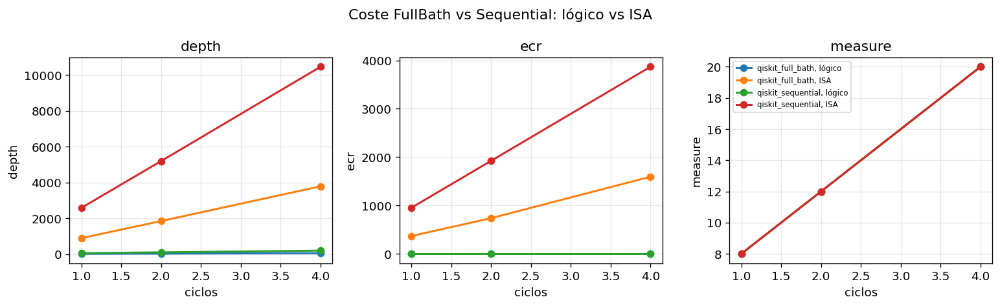

In [ ]:
# B2 — Recursos FullBath vs Sequential, lógico vs ISA

q_full = ThermalProtocolFullBathQiskit(qk_model, backend_bundle=bundle, **qk_params)
q_seq = ThermalProtocolSequentialQiskit(qk_model, backend_bundle=bundle, **qk_params)

df_res = resource_table([q_full, q_seq], cycles=(1, 2, 4))

cols = [
    "protocol", "n_cycles", "ISA",
    "n_sys", "n_bath", "n_ops",
    "n_qubits_total", "n_clbits",
    "depth", "size", "cx", "ecr", "reset", "measure",
]
display(df_res[cols].round(0))

fig, axes = plt.subplots(1, 3, figsize=(13, 4))

for metric, ax in zip(["depth", "ecr", "measure"], axes):
    for (protocol, isa), sub in df_res.groupby(["protocol", "ISA"]):
        label = f"{protocol}, {'ISA' if isa else 'lógico'}"
        ax.plot(sub["n_cycles"], sub[metric], "o-", label=label)

    ax.set_xlabel("ciclos")
    ax.set_ylabel(metric)
    ax.set_title(metric)
    ax.grid(alpha=0.3)

axes[-1].legend(fontsize=7)
plt.suptitle("Coste FullBath vs Sequential: lógico vs ISA")
plt.tight_layout()
plt.show()

FullBath logical circuit


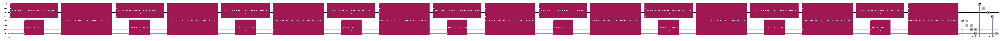

Sequential logical circuit


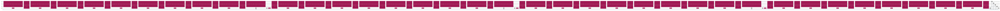

In [14]:
# ============================================================
# B2 — Visualización de circuitos lógicos pequeños
# ============================================================

qc_full_1 = q_full.build_circuit(
    n_cycles=1,
    init_label="0000",
    final_pauli={q: "Z" for q in range(qk_model.n_qubits)},
)

qc_seq_1 = q_seq.build_circuit(
    n_cycles=1,
    init_label="0000",
    final_pauli={q: "Z" for q in range(qk_model.n_qubits)},
)

print("FullBath logical circuit")
display(qc_full_1.draw("mpl", fold=-1))

print("Sequential logical circuit")
display(qc_seq_1.draw("mpl", fold=-1))

El circuito `FullBath` usa varios qubits de baño simultáneos. El circuito `Sequential` reutiliza un único baño, por lo que reduce qubits pero aumenta la profundidad y el número de resets/medidas intermedias.

## B3. Recursos lógicos e ISA

Una vez construidos los circuitos, estimamos su coste.

Comparamos `FullBath` y `Sequential` en dos niveles:

1. **nivel lógico**, antes de adaptar el circuito a un backend concreto;
2. **nivel ISA**, después de transpilar a una arquitectura tipo FakeSherbrooke.

Las métricas principales son:

- número total de qubits;
- profundidad del circuito;
- número de medidas;
- número de resets;
- número de puertas nativas, especialmente `ecr`.

Esta sección no estudia todavía resultados shot-based. Solo mide el coste de implementar el canal como circuito dinámico.

### B3.1 Transpilación a FakeSherbrooke

Transpilamos los circuitos lógicos a una arquitectura tipo FakeSherbrooke para estimar el coste en puertas nativas.

Después de la transpilación aparecen operaciones como `rz`, `sx`, `x`, `ecr`, `measure` y `reset`.

El circuito completo puede ser largo incluso para un solo ciclo, así que el dibujo sirve solo como visualización representativa. La comparación cuantitativa se hace con la tabla de recursos.

In [6]:
# ============================================================
# B3 — Transpilación ISA: FakeSherbrooke y puertas nativas
# ============================================================

from qiskit.transpiler import generate_preset_pass_manager

bundle = q_full._get_backend_bundle()
backend = bundle["hw_backend"]

print("Backend:", backend.name)
print("Basis gates / operations:")
print(getattr(backend.target, "operation_names", None))

circuits_to_transpile = {
    "FullBath, 1 ciclo": qc_full_1,
    "Sequential, 1 ciclo": qc_seq_1,
}

isa_rows = []
isa_circuits = {}

for name, qc in circuits_to_transpile.items():
    pm = generate_preset_pass_manager(
        optimization_level=1,
        backend=backend,
    )

    tqc = pm.run(qc)
    isa_circuits[name] = tqc

    ops = dict(tqc.count_ops())

    row = {
        "circuit": name,
        "n_qubits": tqc.num_qubits,
        "n_clbits": tqc.num_clbits,
        "depth": tqc.depth(),
        "size": tqc.size(),
        "ecr": int(ops.get("ecr", 0)),
        "cx": int(ops.get("cx", 0)),
        "rz": int(ops.get("rz", 0)),
        "sx": int(ops.get("sx", 0)),
        "x": int(ops.get("x", 0)),
        "measure": int(ops.get("measure", 0)),
        "reset": int(ops.get("reset", 0)),
    }

    isa_rows.append(row)

df_isa_native = pd.DataFrame(isa_rows)
display(df_isa_native)

Backend: fake_sherbrooke
Basis gates / operations:
dict_keys(['switch_case', 'for_loop', 'reset', 'ecr', 'sx', 'x', 'delay', 'rz', 'measure', 'if_else', 'id'])


,circuit,n_qubits,n_clbits,depth,size,ecr,cx,rz,sx,x,measure,reset
0,"FullBath, 1 ciclo",127,8,798,2100,367,0,932,644,145,8,4
1,"Sequential, 1 ciclo",127,8,2579,5158,952,0,2320,1465,409,8,4


In [28]:
display(isa_circuits["FullBath, 1 ciclo"].draw("mpl", fold=80))

In [21]:
display(isa_circuits["Sequential, 1 ciclo"].draw("mpl", fold=80))

 La transpilación a FakeSherbrooke convierte el circuito lógico a la base nativa del backend.

Esta tabla no mide ruido todavía. Solo estima el coste ISA: profundidad, resets, medidas y puertas nativas como `ecr`, `rz`, `sx` y `x`.

El circuito transpilado completo es largo incluso para un solo ciclo, así que el dibujo se usa solo como ejemplo visual. La comparación importante es la tabla de recursos.

### B3.2 Escalado de recursos con tamaño

Estimamos cómo crecen los recursos al pasar del dímero a sistemas pequeños más grandes.

La comparación no pretende ejecutar física grande en hardware, sino medir cómo escalan qubits, profundidad, resets, medidas y puertas nativas al aumentar el número de sitios.

In [7]:
# ============================================================
# B3 — Escalado de recursos Qiskit lógico/ISA
# ============================================================

qiskit_cases = {
    "dimer": FermiHubbardJW(n_sites=2, bonds=[(0, 1)], t=1.0, U=4.0, mu=0.0),
    "chain3": FermiHubbardJW(n_sites=3, bonds=[(0, 1), (1, 2)], t=1.0, U=4.0, mu=0.0),
    "plaquette2x2": FermiHubbardJW(
        n_sites=4,
        bonds=[(0, 1), (2, 3), (0, 2), (1, 3)],
        t=1.0,
        U=4.0,
        mu=0.0,
    ),
}

resource_rows = []

for case_name, model_case in qiskit_cases.items():

    q_full_case = fhm.ThermalProtocolFullBathQiskit(
        model_case,
        h_bath=1.0,
        beta=2.0,
        theta=0.1,
        delta=0.30,
        M_T=4,
        trotter_reps=1,
        backend_bundle=bundle,
    )

    q_seq_case = fhm.ThermalProtocolSequentialQiskit(
        model_case,
        h_bath=1.0,
        beta=2.0,
        theta=0.1,
        delta=0.30,
        M_T=4,
        trotter_reps=1,
        backend_bundle=bundle,
    )

    for protocol in [q_full_case, q_seq_case]:
        for ncyc in [1, 2]:
            row = protocol.resources(
                n_cycles=ncyc,
                final_pauli=None,
                init_label="0" * model_case.n_qubits,
                transpiled=True,
            )
            row["case"] = case_name
            resource_rows.append(row)

df_qiskit_resources = pd.DataFrame(resource_rows)

display(
    df_qiskit_resources[
        [
            "case",
            "protocol",
            "n_cycles",
            "n_qubits_total",
            "n_clbits",
            "depth",
            "size",
            "ecr",
            "cx",
            "reset",
            "measure",
        ]
    ]
)

,case,protocol,n_cycles,n_qubits_total,n_clbits,depth,size,ecr,cx,reset,measure
0,dimer,qiskit_full_bath,1,127,4,1536,3998,714,0,4,4
1,dimer,qiskit_full_bath,2,127,8,3365,7934,1434,0,8,8
2,dimer,qiskit_sequential,1,127,4,5361,9458,1722,0,4,4
3,dimer,qiskit_sequential,2,127,8,9294,18618,3444,0,8,8
4,chain3,qiskit_full_bath,1,127,6,2923,7198,1284,0,6,6
5,chain3,qiskit_full_bath,2,127,12,5372,14912,2685,0,12,12
6,chain3,qiskit_sequential,1,127,6,12494,24826,4704,0,6,6
7,chain3,qiskit_sequential,2,127,12,27202,51142,9423,0,12,12
8,plaquette2x2,qiskit_full_bath,1,127,8,5957,15426,2820,0,8,8
9,plaquette2x2,qiskit_full_bath,2,127,16,11086,30367,5658,0,16,16


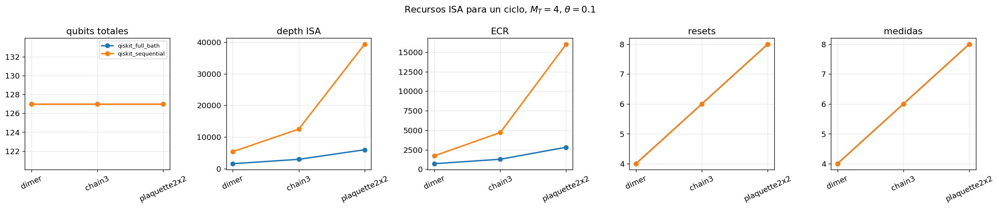

In [8]:
metrics = [
    ("n_qubits_total", "qubits totales"),
    ("depth", "depth ISA"),
    ("ecr", "ECR"),
    ("reset", "resets"),
    ("measure", "medidas"),
]

fig, axes = plt.subplots(1, len(metrics), figsize=(20, 4.2))

for ax, (metric, title) in zip(axes, metrics):
    for protocol_name, dfp in df_qiskit_resources.groupby("protocol"):
        df1 = (
            dfp[dfp["n_cycles"] == 1]
            .set_index("case")
            .loc[list(qiskit_cases.keys())]
            .reset_index()
        )

        ax.plot(
            df1["case"],
            df1[metric],
            "o-",
            lw=2,
            label=protocol_name,
        )

    ax.set_title(title)
    ax.tick_params(axis="x", rotation=25)
    ax.grid(alpha=0.3)

axes[0].legend(fontsize=8)

plt.suptitle(
    "Recursos ISA para un ciclo, $M_T=4$, $\\theta=0.1$",
    fontsize=13,
)

plt.tight_layout()
plt.show()

 `FullBath` consume más qubits porque introduce varios baños auxiliares simultáneos. `Sequential` reduce qubits al reutilizar un único baño, pero paga ese ahorro con mayor profundidad, más resets y más medidas intermedias.

La transpilación a FakeSherbrooke muestra el coste más realista: no basta contar qubits lógicos, también importan la profundidad ISA y las puertas entanglantes nativas como `ecr`.

Esta es la tensión principal de la implementación Qiskit: ahorrar qubits no implica necesariamente obtener circuitos más baratos.

## B.4. Coste de la sínstesis Trotter

Antes de hacer shots, conviene comprobar que el bloque Qiskit trotterizado aproxima el bloque unitario denso que usamos en NumPy. Lo hacemos solo para el dímero y $M_T=2$.

Este test mide error de implementación, no convergencia térmica.

In [ ]:
# ============================================================
# B4 — Barrido de trotter_reps y coste ISA
# ===========================================================

# ------------------------------------------------------------
# Modelo: dímero Fermi-Hubbard
# ------------------------------------------------------------

model_FH_trotter = fhm.FermiHubbardJW(
    n_sites=2,
    bonds=[(0, 1)],
    t=1.0,
    U=4.0,
    mu=0.0,
)


# ------------------------------------------------------------
# Parámetros de stress test
# No son los parámetros finales del protocolo.
# Se eligen para que el efecto de trotter_reps sea visible.
# ------------------------------------------------------------

trotter_reps_grid = [1, 2, 4, 8]

qiskit_trotter_base = dict(
    h_bath=1.0,
    beta=2.0,
    theta=0.35,
    delta=0.50,
    M_T=4,
    trotter_order=2,
    coupling_family="paper",
    optimization_level=1,
)

n_cycles_trotter = 1
final_Z_trotter = {q: "Z" for q in range(model_FH_trotter.n_qubits)}

rows_trotter = []

for reps in trotter_reps_grid:

    params = dict(qiskit_trotter_base)
    params["trotter_reps"] = reps

    q_full_rep = fhm.ThermalProtocolFullBathQiskit(
        model_FH_trotter,
        **params,
    )

    q_seq_rep = fhm.ThermalProtocolSequentialQiskit(
        model_FH_trotter,
        **params,
    )

    for protocol in [q_full_rep, q_seq_rep]:

        # Recursos lógicos, antes de transpilación
        row_logical = protocol.resources(
            n_cycles=n_cycles_trotter,
            final_pauli=final_Z_trotter,
            init_label="0" * model_FH_trotter.n_qubits,
            transpiled=False,
        )
        row_logical["trotter_reps"] = reps
        row_logical["level"] = "logical"

        # Recursos ISA, transpilado a FakeSherbrooke
        row_isa = protocol.resources(
            n_cycles=n_cycles_trotter,
            final_pauli=final_Z_trotter,
            init_label="0" * model_FH_trotter.n_qubits,
            transpiled=True,
        )
        row_isa["trotter_reps"] = reps
        row_isa["level"] = "ISA"

        rows_trotter.append(row_logical)
        rows_trotter.append(row_isa)


df_trotter_resources = pd.DataFrame(rows_trotter)

cols_show = [
    "protocol",
    "level",
    "trotter_reps",
    "n_qubits_total",
    "n_clbits",
    "depth",
    "size",
    "ecr",
    "cx",
    "reset",
    "measure",
]

display(df_trotter_resources[cols_show].sort_values(
    ["protocol", "level", "trotter_reps"]
))

,protocol,level,trotter_reps,n_qubits_total,n_clbits,depth,size,ecr,cx,reset,measure
1,qiskit_full_bath,ISA,1,127,8,1551,3805,663,0,4,8
5,qiskit_full_bath,ISA,2,127,8,3175,7001,1275,0,4,8
9,qiskit_full_bath,ISA,4,127,8,5975,14581,2499,0,4,8
13,qiskit_full_bath,ISA,8,127,8,12945,26915,4947,0,4,8
0,qiskit_full_bath,logical,1,8,8,20,39,0,0,4,8
4,qiskit_full_bath,logical,2,8,8,20,39,0,0,4,8
8,qiskit_full_bath,logical,4,8,8,20,39,0,0,4,8
12,qiskit_full_bath,logical,8,8,8,20,39,0,0,4,8
3,qiskit_sequential,ISA,1,127,8,5362,9462,1722,0,4,8
7,qiskit_sequential,ISA,2,127,8,10554,18076,3306,0,4,8


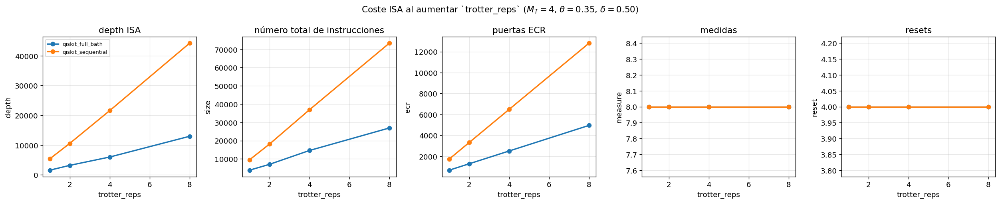

In [43]:
# ============================================================
# B4 — Plots del coste Trotter
# ============================================================

df_plot = df_trotter_resources.query("level == 'ISA'").copy()

metrics = [
    ("depth", "depth ISA"),
    ("size", "número total de instrucciones"),
    ("ecr", "puertas ECR"),
    ("measure", "medidas"),
    ("reset", "resets"),
]

fig, axes = plt.subplots(1, len(metrics), figsize=(21, 4.3))

for ax, (metric, title) in zip(axes, metrics):

    for protocol_name, dfp in df_plot.groupby("protocol"):
        dfp = dfp.sort_values("trotter_reps")

        ax.plot(
            dfp["trotter_reps"],
            dfp[metric],
            "o-",
            lw=2,
            label=protocol_name,
        )

    ax.set(
        xlabel="trotter_reps",
        ylabel=metric,
        title=title,
    )

    ax.grid(alpha=0.3)

axes[0].legend(fontsize=8)

plt.suptitle(
    "Coste ISA al aumentar `trotter_reps` "
    "($M_T=4$, $\\theta=0.35$, $\\delta=0.50$)",
    fontsize=13,
)

plt.tight_layout()
plt.show()

# C. Shots ideales

In [5]:
# ============================================================
# C0 — Setup común para C.1 y C.2
# ============================================================

import sys
import importlib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


# ------------------------------------------------------------
# Modelo físico: dímero Fermi-Hubbard
# ------------------------------------------------------------

model_FH = fhm.FermiHubbardJW(
    n_sites=2,
    bonds=[(0, 1)],
    t=1.0,
    U=4.0,
    mu=0.0,
)

beta_qiskit = 2.0


# ------------------------------------------------------------
# Parámetros Qiskit usados en C
# ------------------------------------------------------------

qiskit_params_C = dict(
    h_bath=1.0,
    beta=beta_qiskit,
    theta=0.10,
    delta=0.30,
    M_T=4,
    trotter_order=2,
    trotter_reps=1,
    coupling_family="paper",
    optimization_level=1,
)


# ------------------------------------------------------------
# Protocolos Qiskit
# ------------------------------------------------------------

q_full = fhm.ThermalProtocolFullBathQiskit(
    model_FH,
    **qiskit_params_C,
)

q_seq = fhm.ThermalProtocolSequentialQiskit(
    model_FH,
    **qiskit_params_C,
)

protocols_C = [q_full, q_seq]


# ------------------------------------------------------------
# Comprobación rápida
# ------------------------------------------------------------

print("Setup C creado correctamente.")
print()
print("Modelo:")
print(f"  L = {model_FH.n_sites}")
print(f"  qubits sistema = {model_FH.n_qubits}")
print(f"  U/t = {model_FH.U}")
print(f"  beta = {beta_qiskit}")
print()
print("FullBath:")
print(f"  protocol_name = {q_full.protocol_name}")
print(f"  n_total = {q_full.n_total}")
print(f"  n_bath_bits_per_cycle = {q_full.n_bath_bits_per_cycle}")
print()
print("Sequential:")
print(f"  protocol_name = {q_seq.protocol_name}")
print(f"  n_total = {q_seq.n_total}")
print(f"  n_bath_bits_per_cycle = {q_seq.n_bath_bits_per_cycle}")

Setup C creado correctamente.

Modelo:
  L = 2
  qubits sistema = 4
  U/t = 4.0
  beta = 2.0

FullBath:
  protocol_name = qiskit_full_bath
  n_total = 8
  n_bath_bits_per_cycle = 4

Sequential:
  protocol_name = qiskit_sequential
  n_total = 5
  n_bath_bits_per_cycle = 4



## C.1 Señal del baño antes del reset

La cantidad que medimos es la probabilidad de obtener $1$ en los qubits de baño antes del reset,

$$
P_B(1).
$$

Esta señal no es todavía un observable físico del sistema, pero confirma que el baño intercambia información con el sistema durante el ciclo.

En `FullBath`, cada ciclo mide varios qubits de baño simultáneos. En `Sequential`, se reutiliza un único baño y se mide varias veces dentro de cada ciclo. Por eso analizamos tanto la media por ciclo como los readouts individuales.

In [6]:
# ============================================================
# C.1 — Señal del baño antes del reset, ideal shots
# ============================================================

shots_C1 = 4096
max_cycles_C1 = 4
seeds_C1 = [101, 202, 303, 404, 505]

bath_cycle_rows = []
bath_readout_rows = []

for protocol in protocols_C:

    protocol_name = protocol.protocol_name
    per_cycle = protocol.n_bath_bits_per_cycle

    print(f"\nRunning {protocol_name}")
    print(f"  readouts de baño por ciclo = {per_cycle}")

    for seed in seeds_C1:

        out = protocol.run_counts(
            n_cycles=max_cycles_C1,
            shots=shots_C1,
            init_mode="mm",
            final_pauli=None,
            sim_mode="ideal",
            seed_base=seed,
        )

        p_flat = np.asarray(out["bath_p1_flat"], dtype=float)

        expected_len = max_cycles_C1 * per_cycle
        if len(p_flat) != expected_len:
            raise ValueError(
                f"{protocol_name}: longitud inesperada de bath_p1_flat. "
                f"Esperado {expected_len}, obtenido {len(p_flat)}."
            )

        p_mat = p_flat.reshape(max_cycles_C1, per_cycle)

        for cyc in range(max_cycles_C1):
            vals = p_mat[cyc]

            bath_cycle_rows.append({
                "protocol": protocol_name,
                "seed": seed,
                "cycle": cyc + 1,
                "bath_mean_cycle": float(np.mean(vals)),
                "bath_std_readouts": float(np.std(vals)),
                "n_readouts": int(per_cycle),
                "shots": int(shots_C1),
            })

            for readout_idx, p1 in enumerate(vals):
                bath_readout_rows.append({
                    "protocol": protocol_name,
                    "seed": seed,
                    "cycle": cyc + 1,
                    "readout_in_cycle": readout_idx,
                    "P1": float(p1),
                    "shots": int(shots_C1),
                })

df_bath_cycle_raw = pd.DataFrame(bath_cycle_rows)
df_bath_readout_raw = pd.DataFrame(bath_readout_rows)

df_bath_cycle = (
    df_bath_cycle_raw
    .groupby(["protocol", "cycle"], as_index=False)
    .agg(
        bath_mean=("bath_mean_cycle", "mean"),
        bath_std_seed=("bath_mean_cycle", "std"),
        n_seeds=("seed", "nunique"),
        n_readouts=("n_readouts", "first"),
        shots=("shots", "first"),
    )
)

df_bath_cycle["bath_sem_seed"] = (
    df_bath_cycle["bath_std_seed"].fillna(0.0)
    / np.sqrt(df_bath_cycle["n_seeds"])
)

df_bath_readout = (
    df_bath_readout_raw
    .groupby(["protocol", "cycle", "readout_in_cycle"], as_index=False)
    .agg(
        P1_mean=("P1", "mean"),
        P1_std_seed=("P1", "std"),
        n_seeds=("seed", "nunique"),
        shots=("shots", "first"),
    )
)

df_bath_readout["P1_sem_seed"] = (
    df_bath_readout["P1_std_seed"].fillna(0.0)
    / np.sqrt(df_bath_readout["n_seeds"])
)

display(df_bath_cycle.round(6))


Running qiskit_full_bath
  readouts de baño por ciclo = 4

Running qiskit_sequential
  readouts de baño por ciclo = 4


,protocol,cycle,bath_mean,bath_std_seed,n_seeds,n_readouts,shots,bath_sem_seed
0,qiskit_full_bath,1,0.003918,0.000260,5,4,4096,0.000116
1,qiskit_full_bath,2,0.004272,0.000193,5,4,4096,0.000086
2,qiskit_full_bath,3,0.003552,0.000091,5,4,4096,0.000040
3,qiskit_full_bath,4,0.004675,0.000119,5,4,4096,0.000053
4,qiskit_sequential,1,0.003772,0.000132,5,4,4096,0.000059
5,qiskit_sequential,2,0.004114,0.000191,5,4,4096,0.000085
6,qiskit_sequential,3,0.003723,0.000167,5,4,4096,0.000075
7,qiskit_sequential,4,0.004797,0.000246,5,4,4096,0.000110


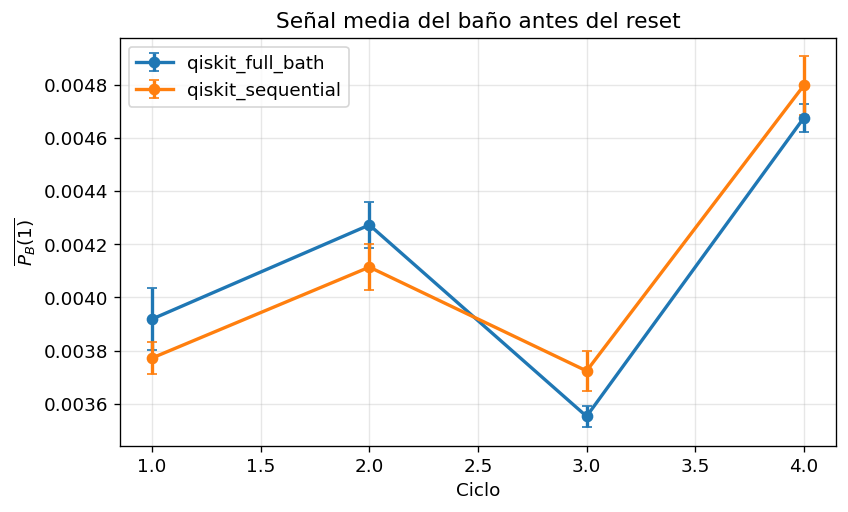

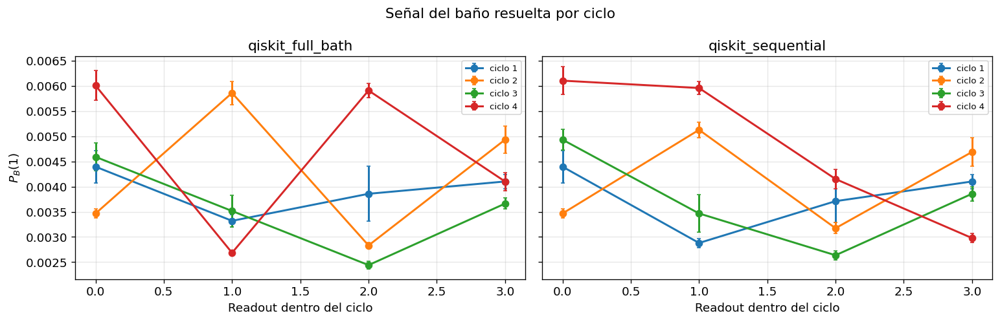

In [7]:
# ============================================================
# C.1 — Plots de señal del baño
# ============================================================

fig, ax = plt.subplots(figsize=(7.2, 4.4))

for protocol_name, dfp in df_bath_cycle.groupby("protocol"):
    dfp = dfp.sort_values("cycle")

    ax.errorbar(
        dfp["cycle"],
        dfp["bath_mean"],
        yerr=dfp["bath_sem_seed"],
        marker="o",
        capsize=3,
        lw=2,
        label=protocol_name,
    )

ax.set(
    xlabel="Ciclo",
    ylabel="$\\overline{P_B(1)}$",
    title="Señal media del baño antes del reset",
)

ax.grid(alpha=0.3)
ax.legend()

plt.tight_layout()
plt.show()


# ------------------------------------------------------------
# Señal resuelta por readout dentro de cada ciclo
# ------------------------------------------------------------

fig, axes = plt.subplots(
    1,
    len(protocols_C),
    figsize=(13, 4.2),
    sharey=True,
)

if len(protocols_C) == 1:
    axes = [axes]

for ax, protocol in zip(axes, protocols_C):
    protocol_name = protocol.protocol_name
    dfp = df_bath_readout[df_bath_readout["protocol"] == protocol_name]

    for cyc, dfc in dfp.groupby("cycle"):
        dfc = dfc.sort_values("readout_in_cycle")

        ax.errorbar(
            dfc["readout_in_cycle"],
            dfc["P1_mean"],
            yerr=dfc["P1_sem_seed"],
            marker="o",
            capsize=2,
            lw=1.8,
            label=f"ciclo {cyc}",
        )

    ax.set(
        xlabel="Readout dentro del ciclo",
        title=protocol_name,
    )
    ax.grid(alpha=0.3)
    ax.legend(fontsize=8)

axes[0].set_ylabel("$P_B(1)$")

plt.suptitle("Señal del baño resuelta por ciclo", fontsize=13)
plt.tight_layout()
plt.show()

La señal del baño es pequeña pero distinta de cero. Esto indica que los auxiliares interactúan con el sistema antes del reset.

La media por ciclo resume la información global extraída por el baño. La figura resuelta por readout muestra la estructura interna de cada ciclo: en `FullBath` los readouts corresponden a baños distintos, mientras que en `Sequential` corresponden al mismo baño reutilizado.

Esta señal no mide energía ni thermalización. Es un diagnóstico shot-based de que el canal abierto se está implementando.

## C.2 Energía diagonal $E_Z$

La primera energía que podemos estimar directamente desde medidas en base computacional es la parte diagonal de Hubbard,

$$
E_Z
=
U\sum_i
\langle n_{i\uparrow}n_{i\downarrow}\rangle.
$$

Esta cantidad mide la contribución de doble ocupación. No es la energía total, porque falta la parte cinética del hopping.

La energía total requiere medir también Pauli strings con $X$ e $Y$, lo que se estudia en la sección siguiente.

In [6]:
# ============================================================
# C.2 — Energía diagonal E_Z desde shots ideales
# ============================================================

shots_C2 = 4096
cycles_C2 = [1, 2, 3, 4]
seeds_C2 = [111, 222, 333, 444, 555]

# Referencias exactas
rho_g_C2 = model_FH.gibbs_state(beta_qiskit)
rho_mm_C2 = np.eye(model_FH.dim, dtype=complex) / model_FH.dim

E_Z_gibbs = (
    model_FH.U
    * model_FH.n_sites
    * model_FH.avg_double_occupancy(rho_g_C2)
)

E_Z_mm = (
    model_FH.U
    * model_FH.n_sites
    * model_FH.avg_double_occupancy(rho_mm_C2)
)

energy_rows = []

for protocol in protocols_C:

    protocol_name = protocol.protocol_name

    print(f"\nRunning E_Z for {protocol_name}")

    for ncyc in cycles_C2:

        for seed in seeds_C2:

            out = protocol.run_bath_and_z(
                n_cycles=ncyc,
                shots=shots_C2,
                init_mode="mm",
                sim_mode="ideal",
                seed_base=seed + 1000 * ncyc,
            )

            p_flat = np.asarray(out["bath_p1_flat"], dtype=float)

            energy_rows.append({
                "protocol": protocol_name,
                "n_cycles": int(ncyc),
                "seed": int(seed),
                "E_Z": float(out["E_Z"]),
                "bath_mean": float(np.mean(p_flat)),
                "bath_std_readouts": float(np.std(p_flat)),
                "wall_time_sec": float(out.get("wall_time_sec", np.nan)),
                "shots": int(shots_C2),
            })

df_EZ_raw = pd.DataFrame(energy_rows)

df_EZ = (
    df_EZ_raw
    .groupby(["protocol", "n_cycles"], as_index=False)
    .agg(
        E_Z_mean=("E_Z", "mean"),
        E_Z_std_seed=("E_Z", "std"),
        bath_mean=("bath_mean", "mean"),
        bath_std_seed=("bath_mean", "std"),
        wall_time_sec_mean=("wall_time_sec", "mean"),
        n_seeds=("seed", "nunique"),
        shots=("shots", "first"),
    )
)

df_EZ["E_Z_sem_seed"] = (
    df_EZ["E_Z_std_seed"].fillna(0.0)
    / np.sqrt(df_EZ["n_seeds"])
)

df_EZ["bath_sem_seed"] = (
    df_EZ["bath_std_seed"].fillna(0.0)
    / np.sqrt(df_EZ["n_seeds"])
)

display(df_EZ.round(6))

print(f"E_Z inicial mixto máximo = {E_Z_mm:.6f}")
print(f"E_Z Gibbs exacto        = {E_Z_gibbs:.6f}")


Running E_Z for qiskit_full_bath

Running E_Z for qiskit_sequential


,protocol,n_cycles,E_Z_mean,E_Z_std_seed,bath_mean,bath_std_seed,wall_time_sec_mean,n_seeds,shots,E_Z_sem_seed,bath_sem_seed
0,qiskit_full_bath,1,1.962305,0.052931,0.004395,0.000150,6.785759,5,4096,0.023672,0.000067
1,qiskit_full_bath,2,2.000195,0.030269,0.005304,0.000187,54.400296,5,4096,0.013537,0.000084
2,qiskit_full_bath,3,1.980664,0.057986,0.003841,0.000282,58.309319,5,4096,0.025932,0.000126
3,qiskit_full_bath,4,2.020898,0.067098,0.003793,0.000112,67.763440,5,4096,0.030007,0.000050
4,qiskit_sequential,1,1.998828,0.053088,0.004395,0.000314,32.576433,5,4096,0.023742,0.000141
5,qiskit_sequential,2,1.990039,0.035037,0.005225,0.000073,48.183073,5,4096,0.015669,0.000033
6,qiskit_sequential,3,1.974219,0.057017,0.003992,0.000156,64.308250,5,4096,0.025499,0.000070
7,qiskit_sequential,4,1.987891,0.062697,0.003912,0.000098,85.646443,5,4096,0.028039,0.000044


E_Z inicial mixto máximo = 2.000000
E_Z Gibbs exacto        = 0.127296


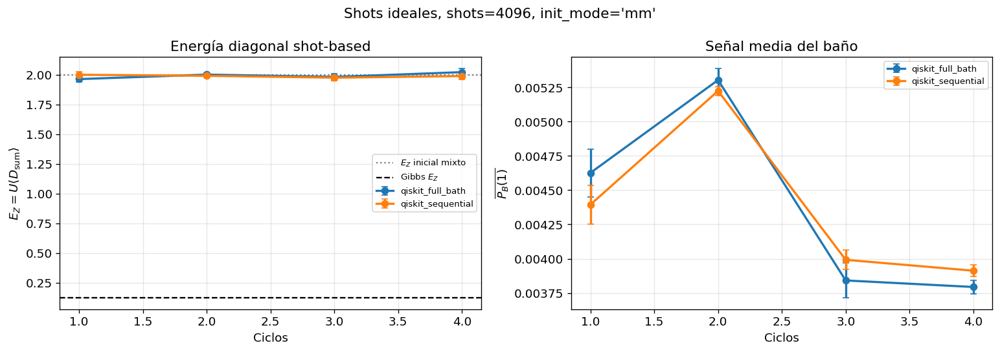

In [ ]:
# ============================================================
# C.2 — Plots de E_Z y señal media del baño
# ============================================================

fig, axes = plt.subplots(1, 2, figsize=(13, 4.6))

# ------------------------------------------------------------
# E_Z
# ------------------------------------------------------------
for protocol_name, dfp in df_EZ.groupby("protocol"):
    dfp = dfp.sort_values("n_cycles")

    axes[0].errorbar(
        dfp["n_cycles"],
        dfp["E_Z_mean"],
        yerr=dfp["E_Z_sem_seed"],
        marker="o",
        capsize=3,
        lw=2,
        label=protocol_name,
    )

axes[0].axhline(
    E_Z_mm,
    color="gray",
    ls=":",
    lw=1.4,
    label="$E_Z$ inicial mixto",
)

axes[0].axhline(
    E_Z_gibbs,
    color="black",
    ls="--",
    lw=1.4,
    label="Gibbs $E_Z$",
)

axes[0].set(
    xlabel="Ciclos",
    ylabel="$E_Z=U\\langle D_{\\rm sum}\\rangle$",
    title="Energía diagonal shot-based",
)

# ------------------------------------------------------------
# Señal media del baño asociada a esas ejecuciones
# ------------------------------------------------------------
for protocol_name, dfp in df_EZ.groupby("protocol"):
    dfp = dfp.sort_values("n_cycles")

    axes[1].errorbar(
        dfp["n_cycles"],
        dfp["bath_mean"],
        yerr=dfp["bath_sem_seed"],
        marker="o",
        capsize=3,
        lw=2,
        label=protocol_name,
    )

axes[1].set(
    xlabel="Ciclos",
    ylabel="$\\overline{P_B(1)}$",
    title="Señal media del baño",
)

for ax in axes:
    ax.grid(alpha=0.3)
    ax.legend(fontsize=8)

plt.suptitle(
    f"Shots ideales, shots={shots_C2}, init_mode='mm'",
    fontsize=13,
)

plt.tight_layout()
plt.show()

In [ ]:
# ============================================================
# C.2 — Sesgos respecto a referencias exactas
# ============================================================

df_EZ_bias = df_EZ.copy()

df_EZ_bias["Delta_EZ_vs_Gibbs"] = df_EZ_bias["E_Z_mean"] - E_Z_gibbs
df_EZ_bias["abs_Delta_EZ_vs_Gibbs"] = np.abs(df_EZ_bias["Delta_EZ_vs_Gibbs"])

df_EZ_bias["Delta_EZ_vs_mm"] = df_EZ_bias["E_Z_mean"] - E_Z_mm
df_EZ_bias["abs_Delta_EZ_vs_mm"] = np.abs(df_EZ_bias["Delta_EZ_vs_mm"])

display(
    df_EZ_bias[
        [
            "protocol",
            "n_cycles",
            "E_Z_mean",
            "E_Z_sem_seed",
            "Delta_EZ_vs_Gibbs",
            "Delta_EZ_vs_mm",
            "bath_mean",
            "bath_sem_seed",
        ]
    ].round(6)
)

,protocol,n_cycles,E_Z_mean,E_Z_sem_seed,Delta_EZ_vs_Gibbs,Delta_EZ_vs_mm,bath_mean,bath_sem_seed
0,qiskit_full_bath,1,1.962305,0.022169,1.835009,-0.037695,0.004626,0.000174
1,qiskit_full_bath,2,2.000195,0.013537,1.872899,0.000195,0.005304,0.000084
2,qiskit_full_bath,3,1.980664,0.025932,1.853368,-0.019336,0.003841,0.000126
3,qiskit_full_bath,4,2.020898,0.030007,1.893603,0.020898,0.003793,0.000050
4,qiskit_sequential,1,1.998828,0.023742,1.871532,-0.001172,0.004395,0.000141
5,qiskit_sequential,2,1.990039,0.015669,1.862743,-0.009961,0.005225,0.000033
6,qiskit_sequential,3,1.974219,0.025499,1.846923,-0.025781,0.003992,0.000070
7,qiskit_sequential,4,1.987891,0.028039,1.860595,-0.012109,0.003912,0.000044


## C.3 Energía total por Pauli strings

La cantidad $E_Z$ de la sección anterior solo mide la parte diagonal de Hubbard,

$$
E_Z =
U\sum_i
\langle n_{i\uparrow}n_{i\downarrow}\rangle.
$$

La energía total es

$$
E =
\langle H_{\rm FH}\rangle,
$$

e incluye también el hopping. Después de Jordan-Wigner, esos términos generan Pauli strings con $X$ e $Y$, por lo que no basta medir en la base computacional.

En esta sección descomponemos $H_{\rm FH}$ en Pauli strings y estimamos la energía como

$$
E =
\sum_k c_k \langle P_k\rangle.
$$

Cada string $P_k$ requiere medir en la base adecuada. Por tanto, esta sección evalúa el coste de medir la energía total con shots.

### C.3.1 Descomposición Pauli de $H_{\rm FH}$

Primero descomponemos el Hamiltoniano Fermi-Hubbard en Pauli strings.

Los términos diagonales vienen de la interacción y del número de partículas. Los términos no diagonales vienen del hopping y requieren medidas en bases con $X$ e $Y$.

,coeff,pauli_local_order,ops,kind,weight,abs_coeff
0,-0.5,XZXI,"{0: 'X', 2: 'X', 1: 'Z'}",hopping JW,3,0.5
1,-0.5,YZYI,"{0: 'Y', 2: 'Y', 1: 'Z'}",hopping JW,3,0.5
2,-0.5,IXZX,"{1: 'X', 3: 'X', 2: 'Z'}",hopping JW,3,0.5
3,-0.5,IYZY,"{1: 'Y', 3: 'Y', 2: 'Z'}",hopping JW,3,0.5
4,1.0,IIII,{},identity,0,1.0
5,-1.0,ZIII,{0: 'Z'},diagonal Z,1,1.0
6,-1.0,IZII,{1: 'Z'},diagonal Z,1,1.0
7,1.0,ZZII,"{0: 'Z', 1: 'Z'}",diagonal Z,2,1.0
8,1.0,IIII,{},identity,0,1.0
9,-1.0,IIZI,{2: 'Z'},diagonal Z,1,1.0


,target_sigma_E,n_terms,n_commuting_groups,sum_coeff_squared,shots_bound_per_estimator,rough_total_shots_ungrouped,rough_total_shots_grouped
0,0.20,12,2,9.0,225,2700,450
1,0.10,12,2,9.0,900,10800,1800
2,0.05,12,2,9.0,3600,43200,7200
3,0.02,12,2,9.0,22500,270000,45000


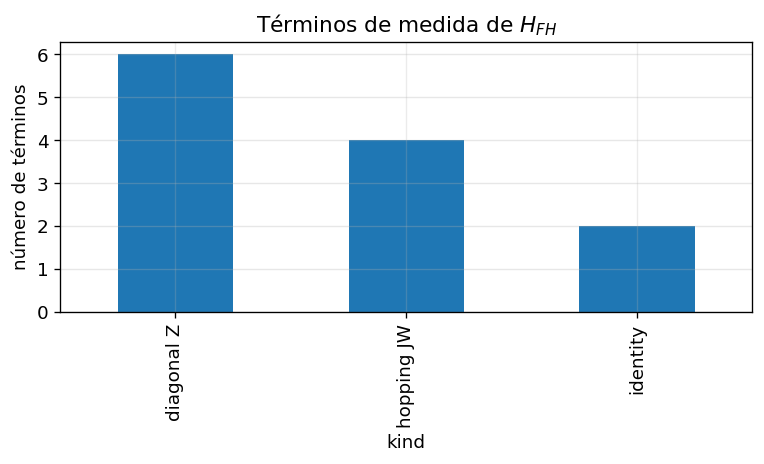

In [7]:
# — Coste por término Pauli de H_FH

def pauli_label_from_ops(ops, n_qubits):
    chars = ["I"] * n_qubits
    for q, p in ops.items():
        chars[q] = p
    return "".join(chars)

rows = []
for coeff, ops in qk_model.hamiltonian_pauli_terms(include_identity=True):
    kind = (
        "identity" if len(ops) == 0 else
        "diagonal Z" if set(ops.values()).issubset({"Z"}) else
        "hopping JW"
    )
    rows.append({
        "coeff": float(np.real(coeff)),
        "pauli_local_order": pauli_label_from_ops(ops, qk_model.n_qubits),
        "ops": dict(ops),
        "kind": kind,
        "weight": len(ops),
        "abs_coeff": abs(float(np.real(coeff))),
    })

df_terms = pd.DataFrame(rows)
display(df_terms)

groups = qk_model.as_sparse_pauli_op(include_identity=True).group_commuting(qubit_wise=False)

sum_c2 = float(np.sum(df_terms["coeff"] ** 2))
target_sigmas = [0.20, 0.10, 0.05, 0.02]

df_shots = pd.DataFrame([
    {
        "target_sigma_E": sigma,
        "n_terms": len(df_terms),
        "n_commuting_groups": len(groups),
        "sum_coeff_squared": sum_c2,
        "shots_bound_per_estimator": int(np.ceil(sum_c2 / sigma**2)),
        "rough_total_shots_ungrouped": int(np.ceil(sum_c2 / sigma**2)) * len(df_terms),
        "rough_total_shots_grouped": int(np.ceil(sum_c2 / sigma**2)) * len(groups),
    }
    for sigma in target_sigmas
])

display(df_shots)

fig, ax = plt.subplots(figsize=(6.5, 4))
df_terms.groupby("kind")["coeff"].count().plot(kind="bar", ax=ax)
ax.set_ylabel("número de términos")
ax.set_title("Términos de medida de $H_{FH}$")
ax.grid(alpha=0.3, axis="y")
plt.tight_layout()
plt.show()

### C.3.2 Reconstrucción shot-based de la energía total

Ejecutamos los circuitos de medida necesarios para estimar cada $\langle P_k\rangle$ y reconstruimos

$$
E =
\sum_k c_k \langle P_k\rangle.
$$

Esta prueba es una demostración de medición, no un barrido grande de thermalización.

In [ ]:
# ============================================================
# C.3.2 — Reconstrucción shot-based de la energía total
# ============================================================

# Usamos el mismo horizonte máximo que en C.1/C.2
n_cycles_C3 = max(cycles_C2) if "cycles_C2" in globals() else 4
shots_C3 = 2048
seed_C3 = 4321

print(f"C.3.2 usando n_cycles = {n_cycles_C3}")
print(f"shots = {shots_C3}")

res_E = q_full.energy_from_pauli_strings(
    n_cycles=n_cycles_C3,
    shots=shots_C3,
    init_mode="mm",
    sim_mode="ideal",
    seed_base=seed_C3,
)

df_terms = res_E["terms"].copy()


# ------------------------------------------------------------
# Normalizar nombres de columnas
# ------------------------------------------------------------

rename_map = {}

for cand in ["coefficient", "coeff", "coef", "c"]:
    if cand in df_terms.columns:
        rename_map[cand] = "coefficient"
        break

for cand in ["expectation", "expval", "mean", "value", "pauli_expectation"]:
    if cand in df_terms.columns:
        rename_map[cand] = "expectation"
        break

for cand in ["contribution", "energy_contribution", "term_energy"]:
    if cand in df_terms.columns:
        rename_map[cand] = "contribution"
        break

for cand in ["term", "pauli", "pauli_string", "label", "pauli_label"]:
    if cand in df_terms.columns:
        rename_map[cand] = "term"
        break

df_terms = df_terms.rename(columns=rename_map)


# ------------------------------------------------------------
# Construir etiqueta Pauli si viene como diccionario
# ------------------------------------------------------------

def pauli_label_from_ops(ops):
    if ops is None:
        return "I"

    if isinstance(ops, str):
        return ops

    if isinstance(ops, dict):
        if len(ops) == 0:
            return "I"
        return "".join(f"{q}{p}" for q, p in sorted(ops.items()))

    return str(ops)


if "term" not in df_terms.columns:
    if "pauli_ops" in df_terms.columns:
        df_terms["term"] = df_terms["pauli_ops"].apply(pauli_label_from_ops)
    else:
        raise KeyError(
            "No encuentro columna de Pauli string. "
            f"Columnas disponibles: {df_terms.columns.tolist()}"
        )


# ------------------------------------------------------------
# Construir contribución si hace falta
# ------------------------------------------------------------

if "contribution" not in df_terms.columns:
    if {"coefficient", "expectation"}.issubset(df_terms.columns):
        df_terms["contribution"] = (
            df_terms["coefficient"].astype(float)
            * df_terms["expectation"].astype(float)
        )
    else:
        raise KeyError(
            "No puedo construir contribution. "
            f"Columnas disponibles: {df_terms.columns.tolist()}"
        )

if "coefficient" not in df_terms.columns:
    df_terms["coefficient"] = np.nan

if "expectation" not in df_terms.columns:
    df_terms["expectation"] = np.nan


# ------------------------------------------------------------
# Agrupar términos iguales
# ------------------------------------------------------------

df_terms_grouped = (
    df_terms
    .groupby("term", as_index=False)
    .agg(
        coefficient=("coefficient", "sum"),
        expectation=("expectation", "mean"),
        contribution=("contribution", "sum"),
    )
    .sort_values("contribution")
    .reset_index(drop=True)
)

E_total_shots = float(df_terms_grouped["contribution"].sum())

rho_g_C3 = model_FH.gibbs_state(beta_qiskit)
rho_mm_C3 = np.eye(model_FH.dim, dtype=complex) / model_FH.dim

E_gibbs_C3 = float(model_FH.energy(rho_g_C3))
E_mm_C3 = float(model_FH.energy(rho_mm_C3))

delta_E_gibbs_C3 = abs(E_total_shots - E_gibbs_C3)
delta_E_mm_C3 = abs(E_total_shots - E_mm_C3)

summary_C3 = pd.DataFrame([
    {
        "n_cycles": n_cycles_C3,
        "shots": shots_C3,
        "E_total_shots": E_total_shots,
        "E_Gibbs": E_gibbs_C3,
        "E_mixto_inicial": E_mm_C3,
        "|E_shots - E_Gibbs|": delta_E_gibbs_C3,
        "|E_shots - E_mixto|": delta_E_mm_C3,
    }
])

display(summary_C3.round(6))
display(df_terms_grouped.round(6))

C.3.2 usando n_cycles = 4
shots = 2048


,n_cycles,shots,E_total_shots,E_Gibbs,E_mixto_inicial,|E_shots - E_Gibbs|,|E_shots - E_mixto|
0,4,2048,1.98291,-0.775146,2.0,2.758056,0.01709


,term,coefficient,expectation,contribution
0,0Z,-1.0,0.042969,-0.042969
1,0Z1Z,1.0,-0.027344,-0.027344
2,0X1Z2X,-0.5,0.041992,-0.020996
3,1Y2Z3Y,-0.5,0.019531,-0.009766
4,0Y1Z2Y,-0.5,0.006836,-0.003418
5,1X2Z3X,-0.5,-0.002930,0.001465
6,1Z,-1.0,-0.014648,0.014648
7,3Z,-1.0,-0.016602,0.016602
8,2Z,-1.0,-0.021484,0.021484
9,2Z3Z,1.0,0.033203,0.033203


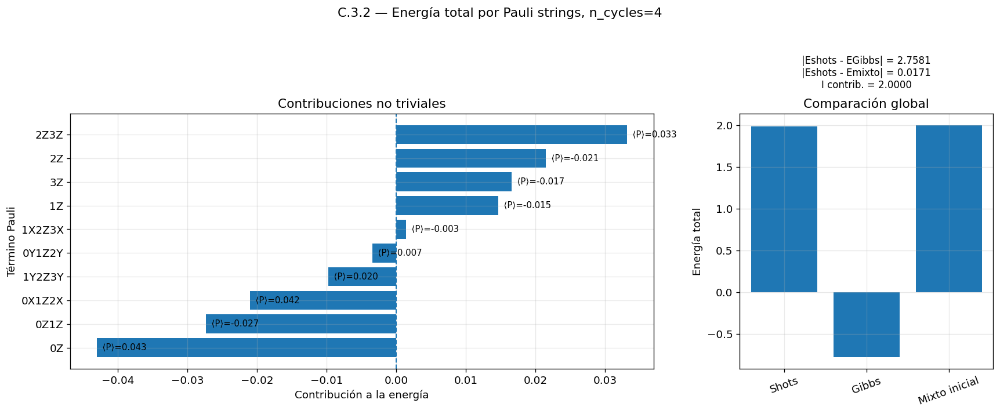

In [7]:
# ============================================================
# C.3.2 — Plot de la energía total reconstruida
# ============================================================

import matplotlib.pyplot as plt
import numpy as np

df_plot = df_terms_grouped.copy()

# Separar identidad porque domina visualmente pero no es una medida informativa
df_identity = df_plot[df_plot["term"].eq("I")].copy()
df_nontrivial = df_plot[~df_plot["term"].eq("I")].copy()
df_nontrivial = df_nontrivial.sort_values("contribution", ascending=True)

identity_contribution = (
    float(df_identity["contribution"].sum())
    if len(df_identity) > 0
    else 0.0
)

fig_height = max(4.5, 0.38 * len(df_nontrivial) + 2.0)

fig, axes = plt.subplots(
    1,
    2,
    figsize=(14.5, fig_height),
    gridspec_kw={"width_ratios": [2.3, 1.0]},
)

# ------------------------------------------------------------
# Panel 1: términos no triviales
# ------------------------------------------------------------

axes[0].barh(
    df_nontrivial["term"],
    df_nontrivial["contribution"],
)

axes[0].axvline(0.0, linestyle="--", linewidth=1.2)
axes[0].set_xlabel("Contribución a la energía")
axes[0].set_ylabel("Término Pauli")
axes[0].set_title("Contribuciones no triviales")

axes[0].grid(alpha=0.3, axis="x")

for i, (_, row) in enumerate(df_nontrivial.iterrows()):
    axes[0].text(
        row["contribution"],
        i,
        f"  ⟨P⟩={row['expectation']:.3f}",
        va="center",
        fontsize=9,
    )


# ------------------------------------------------------------
# Panel 2: comparación global
# ------------------------------------------------------------

labels_global = [
    "Shots",
    "Gibbs",
    "Mixto inicial",
]

values_global = [
    E_total_shots,
    E_gibbs_C3,
    E_mm_C3,
]

axes[1].bar(labels_global, values_global)
axes[1].set_ylabel("Energía total")
axes[1].set_title("Comparación global")
axes[1].grid(alpha=0.3, axis="y")

axes[1].tick_params(axis="x", rotation=20)

ymin = min(values_global)
ymax = max(values_global)
ypad = 0.15 * max(1.0, abs(ymax - ymin))

axes[1].text(
    1.0,
    ymax + ypad,
    (
        f"|Eshots - EGibbs| = {delta_E_gibbs_C3:.4f}\n"
        f"|Eshots - Emixto| = {delta_E_mm_C3:.4f}\n"
        f"I contrib. = {identity_contribution:.4f}"
    ),
    ha="center",
    va="bottom",
    fontsize=10,
)

plt.suptitle(
    f"C.3.2 — Energía total por Pauli strings, n_cycles={n_cycles_C3}",
    y=1.02,
)

plt.tight_layout()
plt.show()

La reconstrucción por Pauli strings muestra que, para el circuito Qiskit usado en C.3.2, la energía shot-based queda muy cerca de la energía del estado mixto inicial y lejos del Gibbs objetivo. Esto no indica un fallo del estimador, sino que con pocos ciclos y parámetros conservadores el circuito dinámico todavía no ha producido una preparación térmica efectiva.


# D. Shots con ruido

En esta sección comparamos simulación ideal y simulación con ruido calibrado usando el mismo circuito, los mismos shots y los mismos parámetros.

No esperamos preparar Gibbs con pocos ciclos. El objetivo es más limitado: medir cuánto se degrada la señal observable al pasar de ideal a noisy.

Usamos dos cantidades shot-based:

- la señal media del baño antes del reset, $\overline{P_B(1)}$;
- la energía diagonal $E_Z=U\langle D\rangle$.

$E_Z$ no es la energía total de Fermi-Hubbard: falta la contribución cinética del hopping.

In [ ]:
# ============================================================
# D.1 — Ideal vs noisy con mismos circuitos y mismos shots
# ============================================================

shots_noise = 2048
n_cycles_noise = [1, 2]
seed_noise = 777

noise_rows = []
bath_cycle_rows = []

bundle = q_full._get_backend_bundle()

if not bundle["have_noise_model"]:
    print("No hay noise model disponible en el bundle. Solo se ejecutará sim_mode='ideal'.")
    sim_modes = ["ideal"]
else:
    sim_modes = ["ideal", "noisy"]

rho_g_q = qk_model.gibbs_state(beta=2.0)
E_Z_gibbs = (
    qk_model.U
    * qk_model.n_sites
    * qk_model.avg_double_occupancy(rho_g_q)
)

for protocol in [q_full, q_seq]:

    for sim_mode in sim_modes:

        for ncyc in n_cycles_noise:

            out = protocol.run_bath_and_z(
                n_cycles=ncyc,
                shots=shots_noise,
                init_mode="mm",
                sim_mode=sim_mode,
                seed_base=seed_noise + 1000 * ncyc,
            )

            p_flat = np.asarray(out["bath_p1_flat"], dtype=float)
            per_cycle = protocol.n_bath_bits_per_cycle

            if len(p_flat) != ncyc * per_cycle:
                raise ValueError(
                    f"Longitud bath_p1_flat inesperada: {len(p_flat)} "
                    f"!= {ncyc} × {per_cycle}"
                )

            p_mat = p_flat.reshape(ncyc, per_cycle)

            bath_mean = float(np.mean(p_flat))
            bath_std_readouts = float(np.std(p_flat))

            # Error estándar binomial aproximado para la media agregada.
            n_effective = shots_noise * len(p_flat)
            bath_se = float(np.sqrt(max(bath_mean * (1 - bath_mean), 0.0) / n_effective))

            noise_rows.append({
                "protocol": protocol.protocol_name,
                "mode": sim_mode,
                "n_cycles": int(ncyc),
                "E_Z": float(out["E_Z"]),
                "bath_mean": bath_mean,
                "bath_std_readouts": bath_std_readouts,
                "bath_se": bath_se,
                "n_bath_readouts": int(len(p_flat)),
                "wall_time_sec": float(out["wall_time_sec"]),
            })

            for cyc in range(ncyc):
                vals = p_mat[cyc]
                bath_cycle_rows.append({
                    "protocol": protocol.protocol_name,
                    "mode": sim_mode,
                    "n_cycles_total": int(ncyc),
                    "cycle": int(cyc + 1),
                    "bath_mean_cycle": float(np.mean(vals)),
                    "bath_std_cycle": float(np.std(vals)),
                })

df_noise = pd.DataFrame(noise_rows)
df_noise_cycle = pd.DataFrame(bath_cycle_rows)

display(df_noise.round(6))

,protocol,mode,n_cycles,E_Z,bath_mean,bath_std_readouts,bath_se,n_bath_readouts,wall_time_sec
0,qiskit_full_bath,ideal,1,1.933594,0.035522,0.004149,0.002045,4,8.296279
1,qiskit_full_bath,ideal,2,2.013672,0.035828,0.004919,0.001452,8,18.079050
2,qiskit_full_bath,noisy,1,1.957031,0.210205,0.040804,0.004502,4,53.664540
3,qiskit_full_bath,noisy,2,1.894531,0.217590,0.031050,0.003223,8,57.290709
4,qiskit_sequential,ideal,1,1.941406,0.035278,0.001934,0.002038,4,23.525512
5,qiskit_sequential,ideal,2,2.019531,0.034790,0.004990,0.001432,8,25.367818
6,qiskit_sequential,noisy,1,1.886719,0.190796,0.042428,0.004341,4,41.730417
7,qiskit_sequential,noisy,2,1.783203,0.193176,0.036053,0.003084,8,86.260424


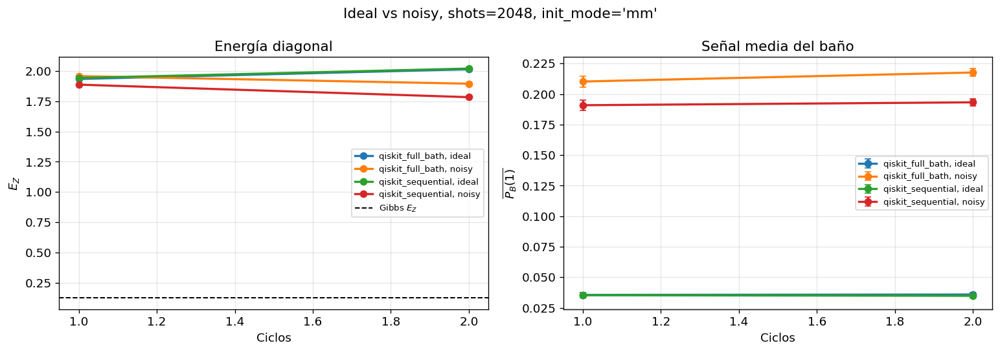

In [39]:
# ============================================================
# D.1 — Plots ideal vs noisy
# ============================================================

fig, axes = plt.subplots(1, 2, figsize=(13, 4.6))

# ------------------------------------------------------------
# Energía diagonal E_Z
# ------------------------------------------------------------
for (protocol_name, sim_mode), dfp in df_noise.groupby(["protocol", "mode"]):
    dfp = dfp.sort_values("n_cycles")

    axes[0].plot(
        dfp["n_cycles"],
        dfp["E_Z"],
        "o-",
        lw=2,
        label=f"{protocol_name}, {sim_mode}",
    )

axes[0].axhline(
    E_Z_gibbs,
    color="black",
    ls="--",
    lw=1.2,
    label="Gibbs $E_Z$",
)

axes[0].set(
    xlabel="Ciclos",
    ylabel="$E_Z$",
    title="Energía diagonal",
)

# ------------------------------------------------------------
# Señal media del baño
# ------------------------------------------------------------
for (protocol_name, sim_mode), dfp in df_noise.groupby(["protocol", "mode"]):
    dfp = dfp.sort_values("n_cycles")

    axes[1].errorbar(
        dfp["n_cycles"],
        dfp["bath_mean"],
        yerr=dfp["bath_se"],
        marker="o",
        capsize=3,
        lw=2,
        label=f"{protocol_name}, {sim_mode}",
    )

axes[1].set(
    xlabel="Ciclos",
    ylabel="$\\overline{P_B(1)}$",
    title="Señal media del baño",
)

for ax in axes:
    ax.grid(alpha=0.3)
    ax.legend(fontsize=8)

plt.suptitle(
    f"Ideal vs noisy, shots={shots_noise}, init_mode='mm'",
    fontsize=13,
)

plt.tight_layout()
plt.show()

,protocol,n_cycles,Delta_E_Z_noisy_minus_ideal,Delta_bath_noisy_minus_ideal
0,qiskit_full_bath,1,0.023438,0.174683
1,qiskit_full_bath,2,-0.119141,0.181763
2,qiskit_sequential,1,-0.054688,0.155518
3,qiskit_sequential,2,-0.236328,0.158386


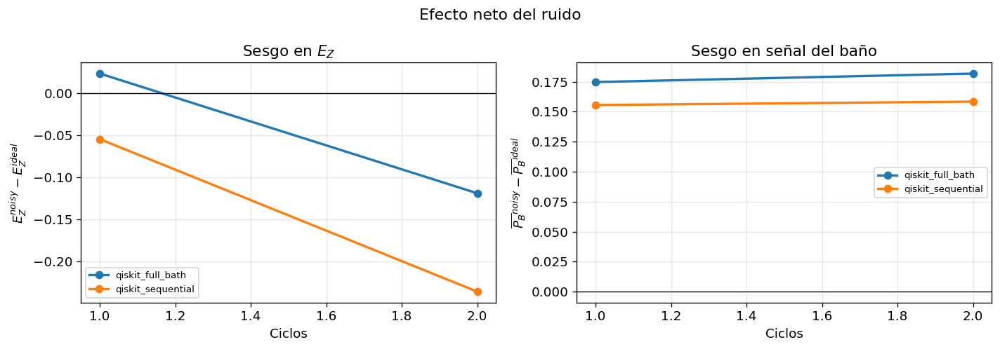

In [40]:
# ============================================================
# D.1 — Diferencia noisy - ideal
# ============================================================

if "noisy" in df_noise["mode"].unique():

    df_piv = df_noise.pivot_table(
        index=["protocol", "n_cycles"],
        columns="mode",
        values=["E_Z", "bath_mean"],
    )

    delta_rows = []

    for idx, row in df_piv.iterrows():
        protocol_name, ncyc = idx

        delta_rows.append({
            "protocol": protocol_name,
            "n_cycles": ncyc,
            "Delta_E_Z_noisy_minus_ideal": row[("E_Z", "noisy")] - row[("E_Z", "ideal")],
            "Delta_bath_noisy_minus_ideal": row[("bath_mean", "noisy")] - row[("bath_mean", "ideal")],
        })

    df_noise_delta = pd.DataFrame(delta_rows)

    display(df_noise_delta.round(6))

    fig, axes = plt.subplots(1, 2, figsize=(12, 4.2))

    for protocol_name, dfp in df_noise_delta.groupby("protocol"):
        dfp = dfp.sort_values("n_cycles")

        axes[0].plot(
            dfp["n_cycles"],
            dfp["Delta_E_Z_noisy_minus_ideal"],
            "o-",
            lw=2,
            label=protocol_name,
        )

        axes[1].plot(
            dfp["n_cycles"],
            dfp["Delta_bath_noisy_minus_ideal"],
            "o-",
            lw=2,
            label=protocol_name,
        )

    axes[0].axhline(0, color="black", lw=0.8)
    axes[1].axhline(0, color="black", lw=0.8)

    axes[0].set(
        xlabel="Ciclos",
        ylabel="$E_Z^{noisy}-E_Z^{ideal}$",
        title="Sesgo en $E_Z$",
    )

    axes[1].set(
        xlabel="Ciclos",
        ylabel="$\\overline{P_B}^{noisy}-\\overline{P_B}^{ideal}$",
        title="Sesgo en señal del baño",
    )

    for ax in axes:
        ax.grid(alpha=0.3)
        ax.legend(fontsize=8)

    plt.suptitle("Efecto neto del ruido")
    plt.tight_layout()
    plt.show()
else:
    print("No hay simulación noisy disponible.")

 El ruido introduce un sesgo claro respecto a la simulación ideal. El efecto es especialmente grande en la señal del baño, porque el protocolo depende de medidas y resets intermedios.

La energía diagonal $E_Z$ también se desplaza, aunque esta cantidad no es la energía total de Hubbard. Con pocos ciclos y estado inicial mixto no esperamos alcanzar el Gibbs; aquí medimos sensibilidad al ruido, no thermalización completa.

# E. Conclusiones

En este notebook hemos extendido el protocolo térmico tipo Lloyd-Abanin al modelo Fermi-Hubbard.

La capa exacta NumPy muestra que el protocolo puede aproximar el Gibbs global del dímero Hubbard con $\mu=0$ en régimen débil e intermedio. El error del punto fijo escala aproximadamente como $\theta^2$, lo que confirma el régimen perturbativo esperado.

El análisis en $(U/t,T/t)$ muestra que, con parámetros fijos, el protocolo funciona bien en una región amplia, pero empeora en régimen fuerte. Esto se interpreta como una falta de adaptación del filtro temporal a las escalas energéticas separadas del modelo Hubbard.

La variante canónica a half-filling muestra que, cuando el target vive en $N=L$, conviene usar operadores que conserven el número de partículas. La familia `Hubbard: ALL` es la elección más natural porque combina términos de carga, spin y hopping dentro del sector.

El retuning de $h$ mejora la adaptación del protocolo canónico, especialmente en energía y doble ocupación. Sin embargo, la correlación de spin sigue siendo difícil en régimen fuerte, lo que indica que ajustar solo la escala del baño no basta para reproducir simultáneamente la física de carga y de spin.

La capa Qiskit muestra que el protocolo puede implementarse como circuito dinámico con baños auxiliares, medidas y resets. `FullBath` usa más qubits, mientras que `Sequential` reutiliza el baño y reduce qubits a costa de más profundidad y resets. La simulación con ruido tipo FakeSherbrooke muestra que la señal shot-based es sensible al ruido, por lo que esta capa debe interpretarse como prueba de implementabilidad NISQ, no como simulación competitiva frente a NumPy exacto.